# Mentoría 09: Detección de fraude en transferencias y transacciones entre usuarios

## Práctico 2: Análisis Exploratorio y Curación de Datos

Fecha límite de entrega: 25/07/2025.

***Grupo 2***:
- Bobbiesi Bender, Sofía.
- Deghi, Sebastián.
- Cepeda, Mildre.
- Márquez, Dalma.

## Tabla de Contenidos <a name="toc"></a>

1. [Tabla de Contenidos](#toc)
2. [Introducción](#introduccion)
  - 2.1. [Origen y estructura general de los datos](#origen)
  - 2.2 [Estructura del dataset](#estructura)
3. [Análisis Exploratorio del Dataset ](#exploracion)
    - 3.1. [Analisis General](#origen)
    - 3.2. [Análisis temporal](#origen)
    - 3.3. [Análisis según las clases de los nodos](#origen)
        - 3.3.1. [Distribución de `features` por clase](#origen)
        - 3.3.2. [Evolución temporal de cada clase](#origen)
        - 3.3.3. [Conectividad media por clase](#origen)
        - 3.3.4. [Caracterización individual de nodos](#origen)
        - 3.3.5. [Nodos por conectividad](#origen)
        - 3.3.6. [Análisis de Componentes Principales (PCA)](#origen)
        - 3.3.7. [Evolución temporal por nodo](#origen)
4. [Limpieza y curación de los datos](#limpieza)
    - 4.1. [Creación de un nuevo dataset](#limpieza)
5. [Modelos de Clasificación](#clasificacion)
    - 5.1. [Regresión Logística](#clasificacion)
    - 5.2. [Random Forest](#clasificacion)
    - 5.3. [Support-Vector Machines (SVM)](#clasificacion)
    - 5.4. [Árboles de Decisión](#clasificacion)
    - 5.5. [Multilayer Perceptron (red Neuronal MLP)](#clasificacion)
    - 5.6. [Graph Convolutional Network (GCN)](#clasificacion)
    - 5.7. [Graph Attention Network (GAT)](#clasificacion)
    - 5.8. [eXtreme Gradient Boosting (XGBoost)](#clasificacion)
    - 5.9. [Comparación de los modelos](#clasificacion)
6. [Conclusiones y Perspectivas](#conclusiones)

## 2. Introducción <a name="introduccion"></a>

En este trabajo se analizará un conjunto de datos sobre transacciones de Bitcoin, diseñado específicamente para tareas de análisis de grafos, detección de actividades ilícitas y aprendizaje automático. El conjunto, conocido como **Elliptic Dataset**, fue desarrollado por la empresa Elliptic, especializada en inteligencia aplicada a criptomonedas, con el objetivo de contribuir a la investigación en técnicas de detección de lavado de dinero (*Anti-Money Laundering*, AML). Actualmente, es uno de los datasets más completos y accesibles para el estudio de fraudes financieros en blockchain.

El dataset modela una **red temporal de transacciones de Bitcoin**, en la cual:

- Los **nodos** representan transacciones individuales.
- Las **aristas dirigidas** indican el flujo de BTC entre transacciones.
- Cada nodo incluye:
  - Un vector de **165 variables numéricas** que describen su comportamiento.
  - Una **etiqueta de clase** (`fraud_label`), que indica si la transacción es lícita, ilícita o desconocida.
  - Un **sello temporal**, que permite reconstruir la evolución de la red a lo largo de 49 "snapshots" temporales.

Estas propiedades hacen que el conjunto sea útil para tareas como:

- Clasificación supervisada y semi-supervisada en grafos.
- Detección de anomalías en transacciones financieras.
- Análisis temporal de comportamientos ilícitos.

### 2.1 Origen y estructura general de los datos <a name="origen"></a>

El dataset se encuentra publicado y analizado por la comunidad de *kaggle*, el mismo puede encontrarse en  https://www.kaggle.com/datasets/ellipticco/elliptic-data-set/code.
Sin embargo, también puede obtenerse directamente desde la librería `torch-geometric`, el cual se puede obtener de `torch_geometric.datasets.EllipticBitcoinDataset`, siendo esta última fuente la que utilizaremos. La estructura convencional de este tipo de dataset está constituido por tres archivos por separados:

* `elliptic_txs_edgelist.csv` (relaciones entre transacciones: aristas)
* `elliptic_txs_features.csv` (atributos de cada transacción: nodos)
* `elliptic_txs_classes.csv` (clase de cada transacción: nodo lícito/ilícito/desconocido)

Un análisis detallado sobre la obtención de los datos, el significado de cada característica (`featrures`) y un análisis de este trabajo puede encontrarse en el trabajo "Anti-Money Laundering in Bitcoin: Experimenting with Graph Convolutional Networks for Financial Forensics" de Weber et. al (https://arxiv.org/abs/1908.02591).

### 2.2 Estructura del dataset <a name="estructura"></a>

El archivo consolidado `elliptic_graph_dataset.csv` contiene, por fila, una relación entre dos transacciones (`person_id_from`, `person_id_to`), junto con:

- Los **Nodos**, los cuales representan transacciones o personas, se caracterizan por:
    * `person_id_from`: nodo origen,
    * `person_id_to`: nodo destino.
- La **etiqueta** (`fraud_label`) que determina la clase del nodo origen de la transacción, los cuales toman los valores:
    * lícito = 0,
    * ilícito = 1,
    * desconocido = 2.
- Los **165 atributos de los nodos** (`feature_0` a `feature_164`) que describen al nodo origen de la transacción, las cuales todos son del tipo numérico. Estas variables están organizadas en tres bloques según su tipo:

| Tipo de características | Rango                | Descripción                                                                 |
|-------------------------|----------------------|-----------------------------------------------------------------------------|
| **Locales**             | `feature_0`–`feature_93`   | Propiedades inmediatas de la transacción: monto total, cantidad de entradas/salidas, tiempo promedio entre operaciones, número de direcciones involucradas, etc. |
| **Agregadas**           | `feature_94`–`feature_153` | Estadísticas de nodos vecinos (media, máximo, mínimo, desviación estándar). |
| **Temporales**          | `feature_154`–`feature_164` | Información temporal local y del entorno: días desde la primera aparición, nivel de actividad reciente, etc. |

> **Propiedades locales**: Son aquellas que describen únicamente a la transacción en sí misma, sin considerar otras del entorno. Por ejemplo: monto recibido, número de entradas y salidas, promedio de valores, o número de direcciones involucradas.

Estas variables permiten capturar tanto el **comportamiento individual** de una transacción como su **contexto estructural y temporal** dentro de la red. Esto es clave para detectar actividades anómalas o patrones ilícito.

## 3. Análisis Exploratorio del Dataset <a name="exploracion"></a>

Primero importamos todas las librerías que utilizaremos

In [ ]:
# Importo las librerías generales
import math
from math import pi
import random
import numpy as np
import pandas as pd
from scipy.stats import uniform, randint

# Importo diccionarios
from collections import defaultdict

# Importo las librerías necesarias para graficar
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns

# Importo las librerías de pytorch y pytorch geometric
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.nn import GATConv
from torch_geometric.data import Data
from torch_geometric.utils import degree
from torch_geometric.utils import subgraph
from torch_geometric.utils import to_networkx

# Importo la librería de scikit-learn
import sklearn
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, classification_report
from sklearn.model_selection import StratifiedKFold, train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV

# Importo la librería de UMAP
import umap

# Importo la librería network
import networkx as nx
from networkx.algorithms import bipartite

# Importo las librerías de xgboost
import xgboost
from xgboost import XGBClassifier

Las versiones de las librerías a utilizar son:

In [ ]:
import session_info
session_info.show(html=False)

-----
matplotlib          3.9.4
networkx            3.2.1
numpy               2.0.2
pandas              2.3.0
seaborn             0.13.2
session_info        v1.0.1
sklearn             1.6.1
torch               2.5.1
torch_geometric     2.6.1
umap                0.5.9.post2
xgboost             2.1.4
-----
IPython             8.18.1
jupyter_client      8.6.3
jupyter_core        5.8.1
jupyterlab          4.4.5
notebook            7.4.4
-----
Python 3.9.23 | packaged by conda-forge | (main, Jun  4 2025, 17:57:12) [GCC 13.3.0]
Linux-6.5.0-27-generic-x86_64-with-glibc2.35
-----
Session information updated at 2025-07-25 15:18


Luego, descargamos el dataset desde la librería `torch geometric`:

In [ ]:
# Importo el dataset desde la librería
from torch_geometric.datasets import EllipticBitcoinDataset

***Observación***: Cuando se utiliza `torch_geometric.datasets.Dataset`, tal como el caso de `EllipticBitcoinDataset`, se obtiene dos carpetas:

📁 raw/: contiene los archivos crudos descargados directamente desde la fuente (por ejemplo .csv que es nuestro caso, .npz, .pt, etc.). Estos datos aún no están listos para ser usados directamente por PyTorch Geometric.

📁 processed/: contiene los archivos preprocesados por la clase del dataset (por ejemplo, convertidos a objetos Data). Esta carpeta se genera automáticamente la primera vez que accedés al dataset, gracias al método process() interno.

***Importante***: Nunca se debe editar `processed/` directamente. Si se desea hacer cambios en los datos, se debe modificar lo que está en `raw/` y borrar `processed/` para forzar el re-procesamiento..

A continuación, genero el dataset a partir de los datos descargados:

In [ ]:
# Cargar correctamente el dataset
dataset = EllipticBitcoinDataset(root='./data')

# Dataset en el primer tiempo
data = dataset[0]

# Imprimo el tipo de datos
print(data.keys)

<bound method BaseData.keys of Data(x=[203769, 165], edge_index=[2, 234355], y=[203769], train_mask=[203769], test_mask=[203769])>


La estructura de `dataset` contiene *49* snapshots temporales (tiempos), cada uno representando un grafo de transacciones. El caso particular de la variable `dataset[0]`  contiene todos los nodos de todos los tiempos (0 a 48), con el atributo temporal embebido. El mismo es un objeto de tipo `torch_geometric.data.Data`, el cual contiene:

* `x`: características de los nodos (transacciones), de tamaño `[num_nodes, num_features]`.
* `edge_index`: conexiones entre nodos (aristas), en formato COO (`[2, num_edges]`).
* `y`: etiquetas de los nodos (0 = lícita, 1 = ilícita, 2 = desconocida).
* `node_id`: IDs únicos para cada nodo (no siempre está presente como atributo).
* `time_step`: el paso temporal de este snapshot (en este caso 0).
* `train_mask`, `val_mask`, `test_mask`: máscaras booleanas que indican qué nodos se usan para entrenamiento, validación o prueba.

In [ ]:
# Mostrar información general
print("=== Información general ===")
print(f"Número de nodos: {data.num_nodes}")
print(f"Número de aristas: {data.num_edges}")
print(f"Características por nodo: {data.num_node_features}")
print(f"Etiquetas únicas: {torch.unique(data.y)}")
print(f"Tamaño de x (features): {data.x.shape}")
print(f"Tamaño de edge_index: {data.edge_index.shape}")

=== Información general ===
Número de nodos: 203769
Número de aristas: 234355
Características por nodo: 165
Etiquetas únicas: tensor([0, 1, 2])
Tamaño de x (features): torch.Size([203769, 165])
Tamaño de edge_index: torch.Size([2, 234355])


La clase `EllipticBitcoinDataset` en `torch_geometric` representa un grafo dirigido por defecto. Sin embargo, podemos verificarlo directamente:

In [ ]:
# Verificar si las aristas son simétricas (esto indica si el grafo es efectivamente dirigido o no)
edge_index = data.edge_index

# Crear un set con las aristas originales y su inversa
edges = set(tuple(edge_index[:, i].tolist()) for i in range(edge_index.size(1)))
reversed_edges = set((v, u) for (u, v) in edges)

is_directed = not reversed_edges.issubset(edges)
print(f"¿El grafo es dirigido?: {is_directed}")

¿El grafo es dirigido?: True


> Nota: incluso si `EllipticBitcoinDataset` carga un grafo dirigido, se puede convertirlo en no dirigido con `to_undirected()`.

Por otro lado, este dataset no es bipartito en sentido clásico (como usuario-transacción), ya que:
* Cada nodo representa una ***entidad (address)***.
* Las conexiones representan ***transacciones entre ellas***.

Sin embargo, podemos testearlo de forma estructural:

In [ ]:
# Convertir a networkx
G_nx = to_networkx(data, to_undirected=True)

# Verificar si es bipartito
is_bipartite = bipartite.is_bipartite(G_nx)
print(f"¿El grafo es bipartito?: {is_bipartite}")

¿El grafo es bipartito?: False


Además, el grafo que se carga por defecto con `torch_geometric.datasets.EllipticBitcoinDataset` no es ponderado. Esto se debe a que:
* El objeto `data.edge_index` solo contiene índices de nodos conectados (no pesos).
* No se incluye un tensor `edge_attr` por defecto (atributos de las aristas). Si no está, el grafo no es ponderado.

In [ ]:
# Ver si hay atributos asociados a las aristas
print(f"¿edge_attr existe?: {'edge_attr' in data}")
print(f"edge_attr: {getattr(data, 'edge_attr', None)}")

¿edge_attr existe?: False
edge_attr: None


> Si tuvieramos información adicional sobre las transacciones (por ejemplo, cantidad de BTC), podrías hacer un grafo ponderado así:
>
> `data.edge_attr = torch.tensor(pesos, dtype=torch.float)  # pesos debe tener shape [num_edges, 1] o similar`
>
> Y luego usar `edge_attr` en modelos o análisis.

A continuación, veamos un primer grafo de `dataset[0]` con pocos puntos para evitar sobre carga, con el fin de realizar una primera y simple ilustración de los datos.

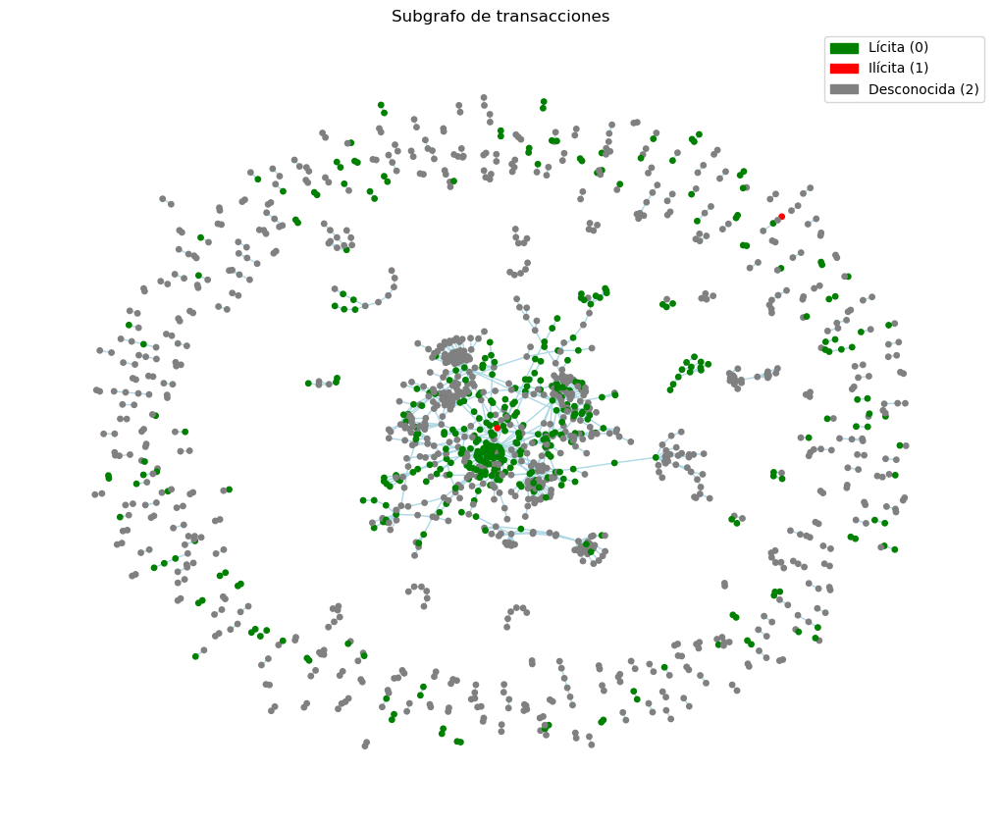

In [ ]:
# Visualizar el grafo con NetworkX (solo una muestra por simplicidad)
G = to_networkx(data, to_undirected=True)

# Colorear por etiqueta: 0 = lícita, 1 = ilícita, 2 = desconocida
labels = data.y.numpy()
colors = ['green' if y == 0 else 'red' if y == 1 else 'gray' for y in labels]

# Selección de subgrafo para visualización
n_subgraph = 1500
sub_nodes = list(range(n_subgraph))
subG = G.subgraph(sub_nodes)
sub_colors = colors[:n_subgraph]

# Graficar
plt.figure(figsize=(10, 8))
nx.draw(subG, node_size=15, node_color=sub_colors, edge_color='lightblue')
plt.title("Subgrafo de transacciones")

# Crear leyenda manual
legend_elements = [
    mpatches.Patch(color='green', label='Lícita (0)'),
    mpatches.Patch(color='red', label='Ilícita (1)'),
    mpatches.Patch(color='gray', label='Desconocida (2)')
]
plt.legend(handles=legend_elements, loc='upper right')
plt.show()

A partir del análisis del grafo anterior se pueden destacar las siguientes observaciones:

- La mayoría de los nodos poseen una etiqueta desconocida, lo que limita su uso en tareas supervisadas.
- Una proporción menor corresponde a nodos lícitos, mientras que los nodos ilícitos representan una fracción muy reducida del total.
- Se detecta una alta cantidad de nodos aislados, sin conexiones con otros elementos de la red.
- Muchos nodos presentan baja conectividad, es decir, están vinculados a muy pocas transacciones.
- Solo un pequeño número de nodos forma caminos extensos dentro del grafo, lo que indica que las trayectorias largas entre transacciones son poco frecuentes.

### 3.1 Análisis General

A partir del grafo obtenido anteriormente, tenemos un indicio desde donde podemos comenzar nuestro analisis y exploración del conjunto de datos. Primero, realizaremos una inspección básica del `data = dataset[0]`:

In [ ]:
print("=== COMPROBACIÓN DE CALIDAD ===")

# 1. Verificación de NaN, inf en las features
has_nan = torch.isnan(data.x).any().item()
has_inf = torch.isinf(data.x).any().item()

# Imprimo
print(f"\n¿Hay NaNs en data.x?: {has_nan}")
print(f"¿Hay infinitos en data.x?: {has_inf}")

# 2. Distribución de etiquetas
labels, counts = torch.unique(data.y, return_counts=True)
print("\nDistribución de etiquetas:")
for label, count in zip(labels.tolist(), counts.tolist()):
    desc = {0: "Lícita", 1: "Ilícita", 2: "Desconocida"}.get(label, "Desconocida")
    print(f"  {desc} ({label}): {count} nodos")

# 3. Duplicados en aristas
edge_index = data.edge_index
edges = edge_index.t().tolist()
edges_set = set(tuple(e) for e in edges)
num_edges = len(edges)
num_unique_edges = len(edges_set)

# Imprimo
print(f"\nAristas totales: {num_edges}")
print(f"Aristas únicas:  {num_unique_edges}")
print(f"¿Hay aristas duplicadas?: {num_edges != num_unique_edges}")

# 4. Nodos aislados
deg = degree(edge_index[0], data.num_nodes).cpu()
num_isolated = int((deg == 0).sum().item())
num_connected = data.num_nodes - num_isolated

# Imprimo
print(f"\nNodos aislados (sin conexiones): {num_isolated} de {data.num_nodes}")
print(f"Porcentaje de nodos aislados: {100 * num_isolated / data.num_nodes:.2f}%")
print(f"Nodos con conexiones: {num_connected} de {data.num_nodes}")
print(f"Porcentaje de nodos con conexiones: {100 * num_connected / data.num_nodes:.2f}%")

# 5. Porcentaje de etiquetas conocidas vs desconocidas
total_nodes = data.num_nodes
known_labels = counts[labels != 2].sum().item()
unknown_labels = counts[labels == 2].sum().item()

# Imprimo
print(f"\nPorcentaje de etiquetas conocidas: {100 * known_labels / total_nodes:.2f}%")
print(f"Porcentaje de etiquetas desconocidas: {100 * unknown_labels / total_nodes:.2f}%")

=== COMPROBACIÓN DE CALIDAD ===

¿Hay NaNs en data.x?: False
¿Hay infinitos en data.x?: False

Distribución de etiquetas:
  Lícita (0): 42019 nodos
  Ilícita (1): 4545 nodos
  Desconocida (2): 157205 nodos

Aristas totales: 234355
Aristas únicas:  234355
¿Hay aristas duplicadas?: False

Nodos aislados (sin conexiones): 37424 de 203769
Porcentaje de nodos aislados: 18.37%
Nodos con conexiones: 166345 de 203769
Porcentaje de nodos conconexioes: 81.63%

Porcentaje de etiquetas conocidas: 22.85%
Porcentaje de etiquetas desconocidas: 77.15%


Para una mejor perspectiva, realizaremos una gráfica de la clase de nodos:

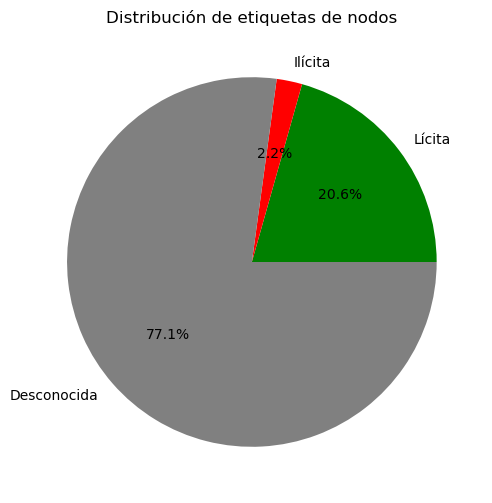

In [ ]:
# Etiquetas
label_dict = {0: "Lícita", 1: "Ilícita", 2: "Desconocida"}

# Gráfico de torta: distribución de clases
plt.figure(figsize=(6, 6))
plt.pie(counts.tolist(), labels=[label_dict[l.item()] for l in labels], autopct='%1.1f%%', colors=['green', 'red', 'gray'])
plt.title("Distribución de etiquetas de nodos")
plt.show()

Y una gráfica de los nodos aislados:

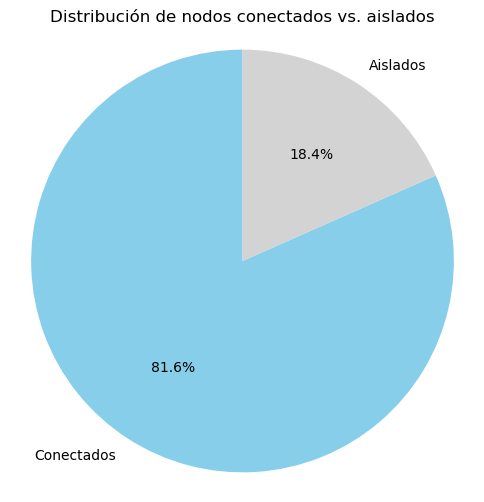

In [ ]:
# Etiquetas
labels = ['Conectados', 'Aislados']
sizes = [num_connected, num_isolated]
colors = ['skyblue', 'lightgray']

# Gráfico de torta: distribución nodos aislados
plt.figure(figsize=(6, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90)
plt.title("Distribución de nodos conectados vs. aislados")
plt.axis('equal')  # Para que sea un círculo perfecto
plt.show()

Además, podes clasificar los nodos aislados por clase:

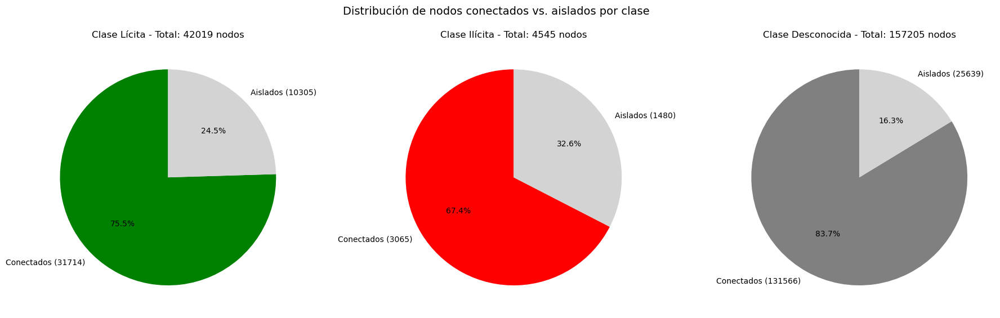

In [ ]:
# Datos base
labels = data.y
deg = degree(data.edge_index[0], data.num_nodes)

# Diccionarios
label_dict = {0: "Lícita", 1: "Ilícita", 2: "Desconocida"}
colors_dict = {0: ["green", "lightgray"], 1: ["red", "lightgray"], 2: ["gray", "lightgray"]}

# Crear figura
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Recorro las diferentes clases
for i, class_id in enumerate([0, 1, 2]):
    # Máscara de nodos de la clase actual
    mask = (labels == class_id)

    # Nodos conectados / aislados dentro de esa clase
    isolated = ((deg == 0) & mask).sum().item()
    total = mask.sum().item()
    connected = total - isolated

    # Valores y etiquetas
    values = [connected, isolated]
    pie_labels = [
        f"Conectados ({connected})",
        f"Aislados ({isolated})"
    ]

    # Pie chart
    axs[i].pie(
        values,
        labels=pie_labels,
        autopct=lambda p: f'{p:.1f}%' if p > 0 else '',
        colors=colors_dict[class_id],
        startangle=90
    )
    axs[i].set_title(f"Clase {label_dict[class_id]} - Total: {total} nodos")

# Ajustes finales
plt.suptitle("Distribución de nodos conectados vs. aislados por clase", fontsize=14)
plt.tight_layout()
plt.show()

Por último, analizaremos los ***grados de los nodos***. Primero, realizaremos un histograma con los grados y el número de nodos.

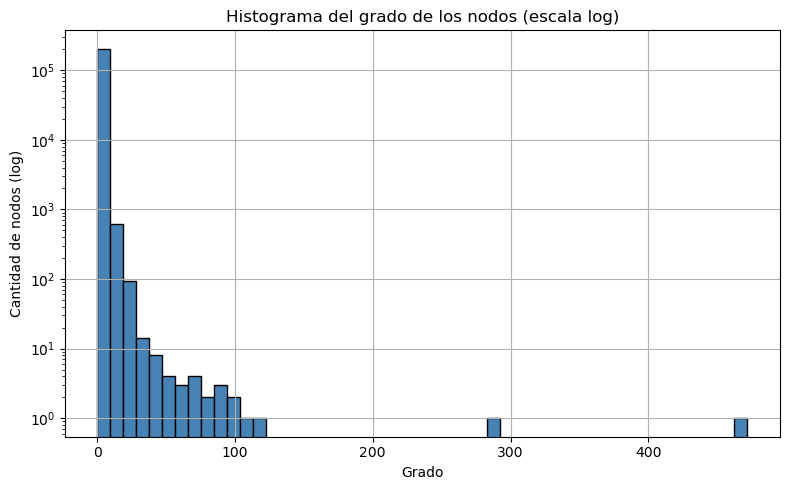

In [ ]:
# DataFrame con clase y grado
df_nodos = pd.DataFrame({
    'Grado': deg.numpy(),
    'Clase': data.y.numpy()
})
df_nodos['Clase'] = df_nodos['Clase'].map({0: 'Lícita', 1: 'Ilícita', 2: 'Desconocida'})

# Histograma del grado de los nodos
plt.figure(figsize=(8, 5))
plt.hist(df_nodos['Grado'], bins=50, color='steelblue', edgecolor='black', log=True)
plt.title('Histograma del grado de los nodos (escala log)')
plt.xlabel('Grado')
plt.ylabel('Cantidad de nodos (log)')
plt.grid(True)
plt.tight_layout()
plt.show()

En la gráfica anterior se ilustraron los grados en general. Sin embargo, como el dataset es dirigido, podemos dividir los nodos en término de ***grados en entrantes y salientes***. Para ver este comportamiento, calculamos para los primeros nodos:

In [ ]:
# Determino los numero de nodos
edge_index = data.edge_index
num_nodes = data.num_nodes

# Cálculo del grado de entrada y salida
out_degree = degree(edge_index[0], num_nodes=num_nodes)  # desde
in_degree = degree(edge_index[1], num_nodes=num_nodes)   # hacia

# Ejemplo: mostrar los primeros 10 nodos
for i in range(20):
    print(f"Nodo {i}: Out-degree = {out_degree[i].item()}, In-degree = {in_degree[i].item()}")

Nodo 0: Out-degree = 1.0, In-degree = 1.0
Nodo 1: Out-degree = 1.0, In-degree = 1.0
Nodo 2: Out-degree = 2.0, In-degree = 1.0
Nodo 3: Out-degree = 1.0, In-degree = 160.0
Nodo 4: Out-degree = 8.0, In-degree = 2.0
Nodo 5: Out-degree = 6.0, In-degree = 4.0
Nodo 6: Out-degree = 2.0, In-degree = 0.0
Nodo 7: Out-degree = 1.0, In-degree = 2.0
Nodo 8: Out-degree = 2.0, In-degree = 0.0
Nodo 9: Out-degree = 1.0, In-degree = 59.0
Nodo 10: Out-degree = 2.0, In-degree = 0.0
Nodo 11: Out-degree = 1.0, In-degree = 1.0
Nodo 12: Out-degree = 1.0, In-degree = 1.0
Nodo 13: Out-degree = 1.0, In-degree = 2.0
Nodo 14: Out-degree = 2.0, In-degree = 1.0
Nodo 15: Out-degree = 2.0, In-degree = 2.0
Nodo 16: Out-degree = 1.0, In-degree = 1.0
Nodo 17: Out-degree = 1.0, In-degree = 1.0
Nodo 18: Out-degree = 1.0, In-degree = 1.0
Nodo 19: Out-degree = 1.0, In-degree = 1.0


Entonces, podemos realizar histogramas para cada uno de los tipos de nodos:

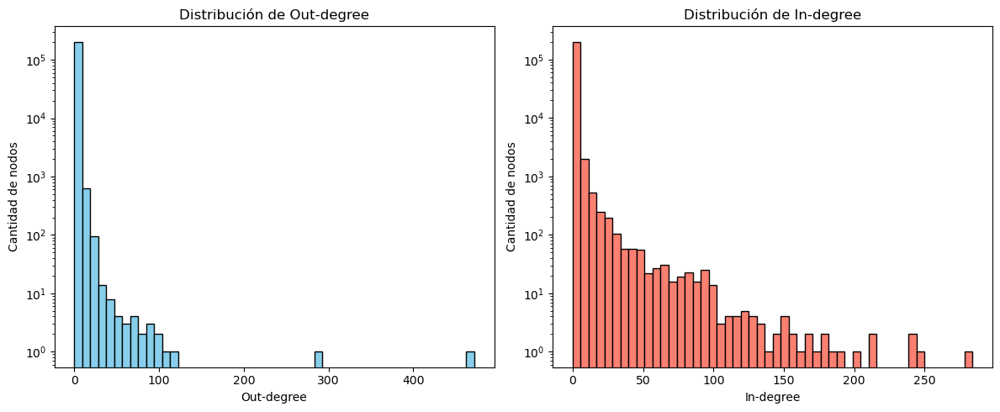

In [ ]:
# Genero el tamaño de las gráficas
plt.figure(figsize=(12, 5))

# Histograma de out-degree
plt.subplot(1, 2, 1)
plt.hist(out_degree.numpy(), bins=50, color='skyblue', edgecolor='black')
plt.title("Distribución de Out-degree")
plt.xlabel("Out-degree")
plt.ylabel("Cantidad de nodos")
plt.yscale('log')

# Histograma de in-degree
plt.subplot(1, 2, 2)
plt.hist(in_degree.numpy(), bins=50, color='salmon', edgecolor='black')
plt.title("Distribución de In-degree")
plt.xlabel("In-degree")
plt.ylabel("Cantidad de nodos")
plt.yscale('log')

# Imprimo las graficas
plt.tight_layout()
plt.show()

Además, podemos clasificar según sea la clase del nodo, ya sea ***lícito***, ***ilícito*** o ***desconocido***:

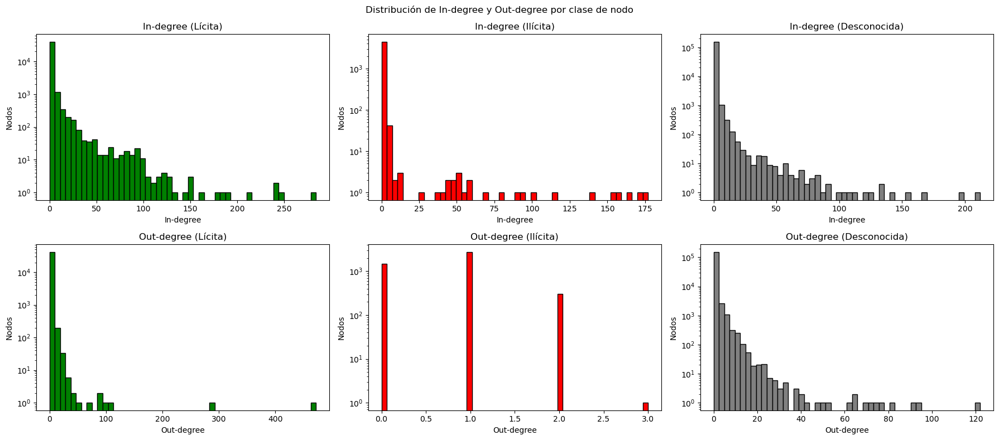

In [ ]:
# Cálculo de grados
edge_index = data.edge_index
num_nodes = data.num_nodes
y = data.y

# Tipos de grados
in_degree = degree(edge_index[1], num_nodes=num_nodes)   # entrantes
out_degree = degree(edge_index[0], num_nodes=num_nodes)  # salientes

# Diccionario de clases
label_dict = {0: "Lícita", 1: "Ilícita", 2: "Desconocida"}
colors_dict = {0: 'green', 1: 'red', 2: 'gray'}

# Graficar distribución por clase
fig, axs = plt.subplots(2, 3, figsize=(18, 8))
fig.suptitle("Distribución de In-degree y Out-degree por clase de nodo")

# Calculo para clase
for class_id in [0, 1, 2]:
    mask = (y == class_id)

    # Extraer grados para esa clase
    in_deg_class = in_degree[mask].numpy()
    out_deg_class = out_degree[mask].numpy()

    # Histogramas para In-degree
    axs[0, class_id].hist(in_deg_class, bins=50, color=colors_dict[class_id], edgecolor='black')
    axs[0, class_id].set_title(f"In-degree ({label_dict[class_id]})")
    axs[0, class_id].set_xlabel("In-degree")
    axs[0, class_id].set_ylabel("Nodos")
    axs[0, class_id].set_yscale('log')  # muchas colas largas

    # Histogramas para Out-degree
    axs[1, class_id].hist(out_deg_class, bins=50, color=colors_dict[class_id], edgecolor='black')
    axs[1, class_id].set_title(f"Out-degree ({label_dict[class_id]})")
    axs[1, class_id].set_xlabel("Out-degree")
    axs[1, class_id].set_ylabel("Nodos")
    axs[1, class_id].set_yscale('log')

# Imprimo las gráficas
plt.tight_layout()
plt.show()

* **Nodos LÍCITOS**
 - Tienen una distribución más amplia tanto en in-degree como en out-degree.
 - Existen muchos nodos con conectividad baja, pero también algunos con grados muy altos, superando los 400 en out-degree.
 - Esto sugiere que los nodos lícitos tienen una actividad transaccional más rica y diversa, actuando a veces como hubs o intermediarios.

* **Nodos ILÍCITOS**
 -  La mayoría tiene in-degree y out-degree muy bajos, concentrados entre 0 y 3.
 -  La distribución es mucho más restringida, sin presencia de nodos con alta conectividad.
 - Esto podría indicar un comportamiento más cauteloso o aislado por parte de quienes realizan actividades ilícitas, posiblemente para evitar detección.

* **Nodos DESCONOCIDOS**
 - Su distribución se parece a la de los lícitos, aunque con una cantidad aún mayor en los grados más bajos.
 - Refuerza la idea de que entre los nodos desconocidos puede haber una mezcla de comportamientos, y podrían incluir tanto lícitos como ilícitos no etiquetados.

**Conclusión general:**
Los nodos ilícitos tienden a tener una conectividad significativamente menor que los lícitos, lo que podría ser un indicador útil en modelos de detección de fraude. En cambio, los nodos lícitos muestran mayor diversidad de grados, y en muchos casos actúan como centros de alta actividad. Esta diferencia estructural entre clases puede ser aprovechada para entrenar modelos de clasificación basados en la topología del grafo.

Calculamos los valores medios y desviaciones de los histogramas anteriores:

In [ ]:
# Función de resumen estadístico
def summary_stats(values):
    return {
        "count": len(values),
        "mean": np.mean(values),
        "median": np.median(values),
        "min": np.min(values),
        "max": np.max(values),
        "std": np.std(values)
    }

# Mostrar resumen por clase
for class_id in [0, 1, 2]:
    mask = (y == class_id)
    in_deg_class = in_degree[mask].numpy()
    out_deg_class = out_degree[mask].numpy()

    print(f"\nEstadísticas para clase {label_dict[class_id]} (ID {class_id})")
    print("In-degree:")
    for k, v in summary_stats(in_deg_class).items():
        print(f"  {k:<6}: {v:.2f}" if isinstance(v, float) else f"  {k:<6}: {v}")

    print("Out-degree:")
    for k, v in summary_stats(out_deg_class).items():
        print(f"  {k:<6}: {v:.2f}" if isinstance(v, float) else f"  {k:<6}: {v}")


Estadísticas para clase Lícita (ID 0)
In-degree:
  count : 42019
  mean  : 1.909398078918457
  median: 1.0
  min   : 0.0
  max   : 284.0
  std   : 7.122453689575195
Out-degree:
  count : 42019
  mean  : 1.1858206987380981
  median: 1.0
  min   : 0.0
  max   : 472.0
  std   : 3.246730089187622

Estadísticas para clase Ilícita (ID 1)
In-degree:
  count : 4545
  mean  : 1.269966959953308
  median: 1.0
  min   : 0.0
  max   : 177.0
  std   : 7.214423656463623
Out-degree:
  count : 4545
  mean  : 0.7416941523551941
  median: 1.0
  min   : 0.0
  max   : 3.0
  std   : 0.5715570449829102

Estadísticas para clase Desconocida (ID 2)
In-degree:
  count : 157205
  mean  : 0.943684995174408
  median: 1.0
  min   : 0.0
  max   : 212.0
  std   : 2.1369516849517822
Out-degree:
  count : 157205
  mean  : 1.152361512184143
  median: 1.0
  min   : 0.0
  max   : 122.0
  std   : 1.3495252132415771


***Resultados relevantes***:
- En el análisis inicial del dataset se comprobó que no existen valores faltantes (NaN) ni infinitos (Inf) en las características, lo que indica que el conjunto de datos ha sido preprocesado adecuadamente.
- Se identificaron nodos aislados con grados elevados, los cuales, si bien son excepcionales, podrían resultar relevantes para la detección de comportamientos fraudulentos.
- No obstante, una gran proporción de nodos se encuentran completamente aislados, lo que limita su utilidad para el análisis estructural y predictivo.
- Por otra parte, una mayoría significativa de los nodos tienen etiquetas desconocidas (clase 2), las cuales no deben ser utilizadas en el entrenamiento supervisado, aunque pueden permanecer en el grafo como contexto para modelos basados en estructura.

### 3.2 Análisis temporal

Analicemos el conjunto de datos a partir de los diferentes snapshots temporales para cada transacción:

In [ ]:
# Cargar el archivo de características
df = pd.read_csv('./data/raw/elliptic_txs_features.csv', header=None)

# La columna 1 contiene los timestamps
timestamps = df[1]
unique_times = timestamps.unique()

# Imprimo
print(f"El dataset contiene {len(unique_times)} snapshots temporales.")
print(f"Tiempos únicos: {sorted(unique_times)}")

El dataset contiene 49 snapshots temporales.
Tiempos únicos: [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38), np.int64(39), np.int64(40), np.int64(41), np.int64(42), np.int64(43), np.int64(44), np.int64(45), np.int64(46), np.int64(47), np.int64(48), np.int64(49)]


***Comentario***: Detalles de `elliptic_txs_features.csv`
* Columna 0: ID de transacción (nodo).
* Columna 1: snapshot temporal (entre 0 y 48).
* Columnas 2 a 167: características del nodo (166 features).

En lo que sigue, definiremos una función que evalúa subgrafos a diferentes tiempos:

In [ ]:
# Genero una función general que genere subgrafos por snapshot
def get_subgraph_by_time(t, data, node_times):
    """
    Devuelve el subgrafo correspondiente al snapshot temporal `t`.

    Args:
        t (int): Snapshot temporal (entre 0 y 48)
        data (torch_geometric.data.Data): Grafo completo
        node_times (list or tensor): Lista de tiempo por nodo (orden igual a data.x)

    Returns:
        data_t (torch_geometric.data.Data): Subgrafo en el tiempo t
        idx_map (Tensor): Índices de nodos originales que quedaron en el subgrafo
    """
    # Asegurar que node_times sea tensor
    if not isinstance(node_times, torch.Tensor):
        node_times = torch.tensor(node_times)

    # Seleccionar índices de nodos en el tiempo t
    subset = (node_times == t).nonzero(as_tuple=True)[0]

    # Subgrafo: filtrar aristas que conectan solo nodos del snapshot
    edge_index_t, _ = subgraph(subset, data.edge_index, relabel_nodes=True)

    # Crear objeto Data para snapshot t
    data_t = Data(
        x=data.x[subset],
        edge_index=edge_index_t,
        y=data.y[subset]
    )

    return data_t, subset

Con esta función podemos ilustrar los diferentes aristas y nodos segun el tiempo:

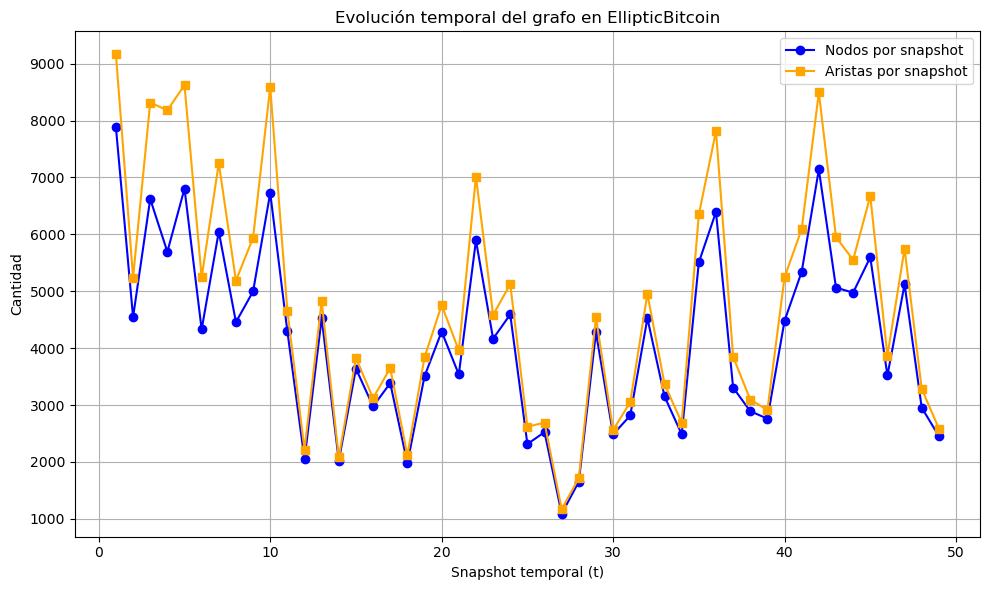

In [ ]:
# La columna 1 es el snapshot temporal
node_times = df[1].tolist()

# Genero el conjunot de puntos
num_nodos_por_t = []
num_aristas_por_t = []
snapshots = sorted(set(node_times))  # Debe ir de 0 a 48
for t in snapshots:
    data_t, _ = get_subgraph_by_time(t, data, node_times)
    num_nodos_por_t.append(data_t.num_nodes)
    num_aristas_por_t.append(data_t.num_edges)

# Genero una grafica
plt.figure(figsize=(10, 6))
plt.plot(snapshots, num_nodos_por_t, marker='o', label='Nodos por snapshot', color='blue')
plt.plot(snapshots, num_aristas_por_t, marker='s', label='Aristas por snapshot', color='orange')
plt.title("Evolución temporal del grafo en EllipticBitcoin")
plt.xlabel("Snapshot temporal (t)")
plt.ylabel("Cantidad")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Comportamiento dinámico del grafo:

- La cantidad de nodos y aristas varía significativamente entre snapshots (períodos de tiempo discretos).
- Esto sugiere que la actividad en la red de transacciones no es constante, sino que presenta fluctuaciones importantes en volumen.

Correlación entre nodos y aristas:
- Las curvas de nodos y aristas evolucionan de forma paralela, lo que indica que cuando hay más nodos activos, también se registran más transacciones (aristas).

Picos y caídas pronunciadas:
- Se observan varios picos de actividad, por ejemplo en los snapshots cercanos al 1, 10, 27, 34 y 42.
- También hay descensos abruptos, como entre los snapshots 10 y 12, y nuevamente alrededor del snapshot 30.
- Estos picos podrían coincidir con eventos relevantes en la red, como actividades coordinadas (posiblemente ilícitas), campañas de lavado o agrupamiento de transacciones.

Actividad no lineal y posiblemente cíclica:
- El patrón parece tener cierto comportamiento repetitivo, lo cual podría explorarse para detectar anomalías temporales o prever tendencias.

Además, podemos visualizar los diferentes grafos para diferentes tiempos. Con este objetivo, podemos definir la siguiente función:

In [ ]:
# Funcion que realiza un subgrafo a diferentes snapshot
def plot_snapshots_grid(times_list, data, node_times, rows=2, cols=3, layout='spring', node_size=20):
    """
    Visualiza múltiples snapshots temporales en una grilla.

    Args:
        times_list (list): Lista de snapshots temporales (por ejemplo [0, 10, 20]).
        data (torch_geometric.data.Data): Grafo completo.
        node_times (list or tensor): Lista de tiempos por nodo.
        rows (int): Cantidad de filas en la grilla.
        cols (int): Cantidad de columnas en la grilla.
        layout (str): Tipo de layout de NetworkX ('spring', 'kamada_kawai', etc).
        node_size (int): Tamaño de los nodos.
    """
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axes = axes.flatten()

    for i, t in enumerate(times_list):
        if i >= len(axes):
            break

        data_t, idx_orig = get_subgraph_by_time(t, data, node_times)

        # Obtener colores según clase
        y = data_t.y.tolist()
        color_map = []
        for label in y:
            if label == 0:
                color_map.append('green')     # Lícito
            elif label == 1:
                color_map.append('red')       # Ilícito
            else:
                color_map.append('lightgray') # Desconocido

        G = to_networkx(data_t, to_undirected=True)

        if layout == "spring":
            pos = nx.spring_layout(G, seed=42)
        elif layout == "kamada_kawai":
            pos = nx.kamada_kawai_layout(G)
        elif layout == "circular":
            pos = nx.circular_layout(G)
        else:
            pos = nx.random_layout(G)

        nx.draw(
            G, pos,
            ax=axes[i],
            node_color=color_map,
            node_size=node_size,
            edge_color='gray',
            with_labels=False,
            alpha=0.7
        )
        axes[i].set_title(f"Snapshot t={t}\nN={data_t.num_nodes}, E={data_t.num_edges}")
        axes[i].axis('off')

    # Ocultar ejes vacíos
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

Graficando para algunos valores notables de tiempos:

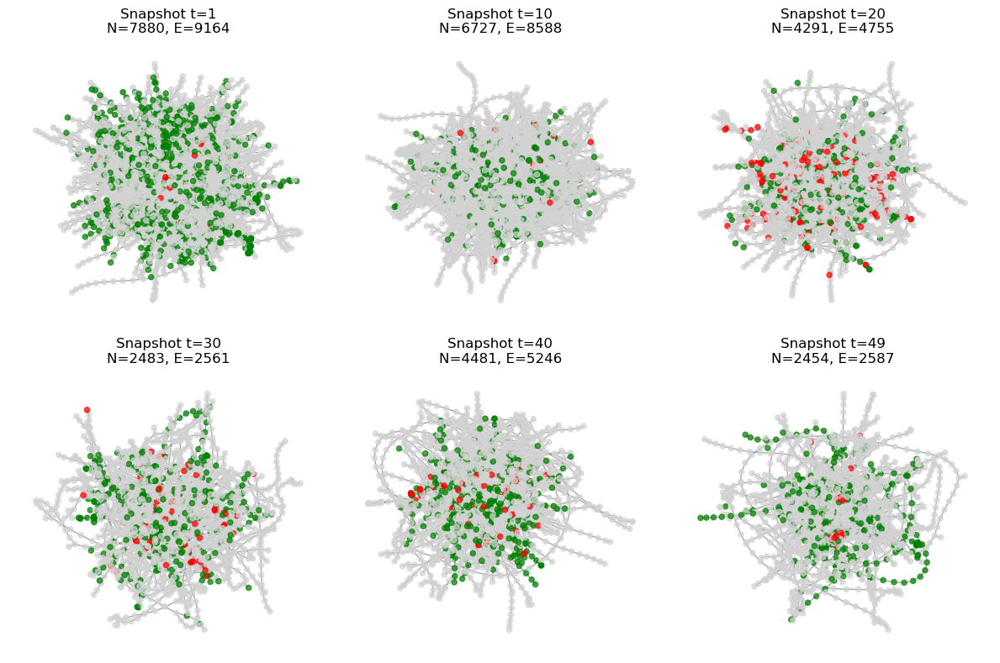

In [ ]:
# Último snapshot es t=49
times_to_plot = [1, 10, 20, 30, 40, 49]

# Grafico multiplot
plot_snapshots_grid(
    times_list=times_to_plot,
    data=data,
    node_times=node_times,
    rows=2,
    cols=3,
    layout='spring',
    node_size=20
)

Conclusión:
La visualización por snapshots muestra cómo la estructura del grafo evoluciona a lo largo del tiempo, tanto en tamaño como en distribución de clases. Los nodos ilícitos tienden a aparecer en las zonas periféricas, con una mayor presencia en ciertos momentos, lo cual puede ser clave para identificar patrones temporales de fraude. La ubicación y frecuencia de estos nodos refuerza la importancia de incorporar información temporal y estructural en los modelos de detección.

A continuación, realizaremos algunas gráficas capaces de ilustrarnos el comportamiento general del dataset.

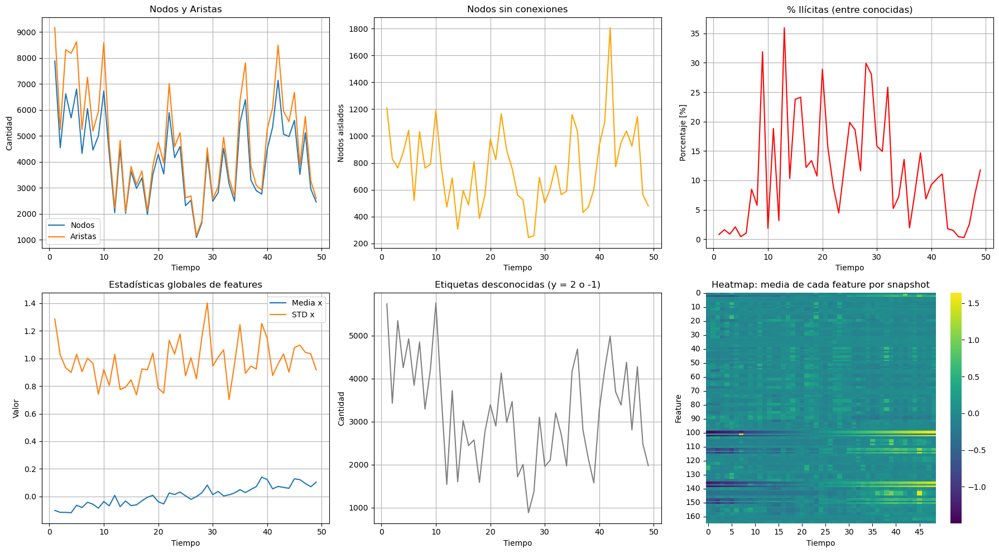

In [ ]:
# Inicializar listas
num_nodes, num_edges = [], []
num_isolated = []
num_known_labels, num_illicit, num_unknown = [], [], []
x_means = []
x_stds = []
x_means_per_feature = []  # Para el heatmap

timesteps = sorted(set(node_times))  # típicamente 0 a 48

for t in timesteps:
    data_t, _ = get_subgraph_by_time(t, data, node_times)

    # Nodos y aristas
    num_nodes.append(data_t.num_nodes)
    num_edges.append(data_t.num_edges)

    # Nodos aislados
    deg = degree(data_t.edge_index[0], data_t.num_nodes)
    num_isolated.append((deg == 0).sum().item())

    # Etiquetas
    mask_known = (data_t.y == 0) | (data_t.y == 1)
    mask_illicit = (data_t.y == 1)
    mask_unknown = (data_t.y == 2) | (data_t.y == -1)  # -1 para nodos sin etiqueta

    num_known_labels.append(mask_known.sum().item())
    num_illicit.append(mask_illicit.sum().item())
    num_unknown.append(mask_unknown.sum().item())

    # Estadísticas globales
    x = data_t.x
    x_means.append(x.mean().item())
    x_stds.append(x.std().item())

    # Promedio de cada feature (para heatmap)
    x_means_per_feature.append(x.mean(dim=0).numpy())

# Convertir a arrays
x_means_per_feature = np.array(x_means_per_feature).T  # shape: [num_features, num_timesteps]
percent_illicit = 100 * np.array(num_illicit) / np.maximum(np.array(num_known_labels), 1)

# ---------------------------
# Gráfico multiplot 2x3
# ---------------------------
plt.figure(figsize=(18, 10))

# 1. Nodos y Aristas
plt.subplot(2, 3, 1)
plt.plot(timesteps, num_nodes, label="Nodos")
plt.plot(timesteps, num_edges, label="Aristas")
plt.xlabel("Tiempo")
plt.ylabel("Cantidad")
plt.title("Nodos y Aristas")
plt.legend()
plt.grid(True)

# 2. Nodos aislados
plt.subplot(2, 3, 2)
plt.plot(timesteps, num_isolated, color="orange")
plt.xlabel("Tiempo")
plt.ylabel("Nodos aislados")
plt.title("Nodos sin conexiones")
plt.grid(True)

# 3. % de ilícitas
plt.subplot(2, 3, 3)
plt.plot(timesteps, percent_illicit, color="red")
plt.xlabel("Tiempo")
plt.ylabel("Porcentaje [%]")
plt.title("% Ilícitas (entre conocidas)")
plt.grid(True)

# 4. Media y std de features
plt.subplot(2, 3, 4)
plt.plot(timesteps, x_means, label="Media x")
plt.plot(timesteps, x_stds, label="STD x")
plt.xlabel("Tiempo")
plt.ylabel("Valor")
plt.title("Estadísticas globales de features")
plt.legend()
plt.grid(True)

# 5. Etiquetas desconocidas
plt.subplot(2, 3, 5)
plt.plot(timesteps, num_unknown, color="gray")
plt.xlabel("Tiempo")
plt.ylabel("Cantidad")
plt.title("Etiquetas desconocidas (y = 2 o -1)")
plt.grid(True)

# 6. Heatmap de medias por feature
plt.subplot(2, 3, 6)
sns.heatmap(
    x_means_per_feature,
    cmap="viridis",
    xticklabels=5,
    yticklabels=10
)
plt.xlabel("Tiempo")
plt.ylabel("Feature")
plt.title("Heatmap: media de cada feature por snapshot")

plt.tight_layout()
plt.savefig("auditoria_elliptic_dataset.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()

1. Nodos y Aristas (arriba izquierda)
 - Hay fluctuaciones significativas en la cantidad de nodos y aristas a lo largo del tiempo.
 - Ambas curvas siguen un patrón similar → mayor número de nodos implica mayor cantidad de conexiones.
 - Refleja una red dinámica, con momentos de intensa actividad y otros más reducidos.

2. Nodos sin conexiones (arriba centro)
 - Persisten altos niveles de nodos aislados (sin conexiones) en la mayoría de los snapshots.
 - Esto limita la utilidad de muchos nodos para el análisis estructural, ya que no aportan al grafo.

3. % de nodos ilícitos entre los conocidos (arriba derecha)
 - El porcentaje de nodos ilícitos varía mucho entre snapshots, alcanzando picos de más del 30% en ciertos momentos.
 - Podría indicar eventos anómalos o picos de fraude temporal, lo cual es útil para detección proactiva.

4. Estadísticas globales de features (abajo izquierda)
 - La media de los valores de las features tiende a mantenerse estable, pero la desviación estándar (STD) es alta, lo que sugiere gran dispersión y variabilidad entre nodos.
 - Esto puede dificultar la separación entre clases y exige normalización adecuada.

5. Cantidad de etiquetas desconocidas (abajo centro)
 - La cantidad de nodos con etiqueta desconocida es alta a lo largo del tiempo, aunque con variaciones.
 - Afecta directamente a los modelos supervisados, pero estos nodos pueden usarse en enfoques semi-supervisados o como contexto.

6. Heatmap de features por snapshot (abajo derecha)
 - El mapa de calor muestra cómo varían las medias de las features en el tiempo.
 - Hay algunas features que destacan en ciertos snapshots, lo cual podría ser útil para detección de patrones temporales o selección de variables relevantes.

Conclusión: El comportamiento temporal del grafo y sus características evidencia una red altamente dinámica, con variaciones importantes en conectividad, actividad fraudulenta y calidad de la información. Si bien persiste una gran proporción de nodos con información desconocida o sin conexiones, los picos en la proporción de nodos ilícitos y las variaciones de las features sugieren momentos críticos que podrían asociarse con actividades fraudulentas.

***Métricas de conectividad del grafo***

1. **Grado medio**

El grado medio en un snapshot temporal \( t \) está dado por:

$$
\langle k \rangle_t = \frac{2 \times \#\text{aristas}}{\#\text{nodos}}
$$

> El factor 2 se debe a que el grafo es no dirigido.

2. **Densidad**

La densidad del grafo en el snapshot \( t \) se calcula como:

$$
D_t = \frac{2 \times \#\text{aristas}}{\#\text{nodos} \times (\#\text{nodos} - 1)}
$$

> Es la proporción de enlaces reales sobre los posibles.

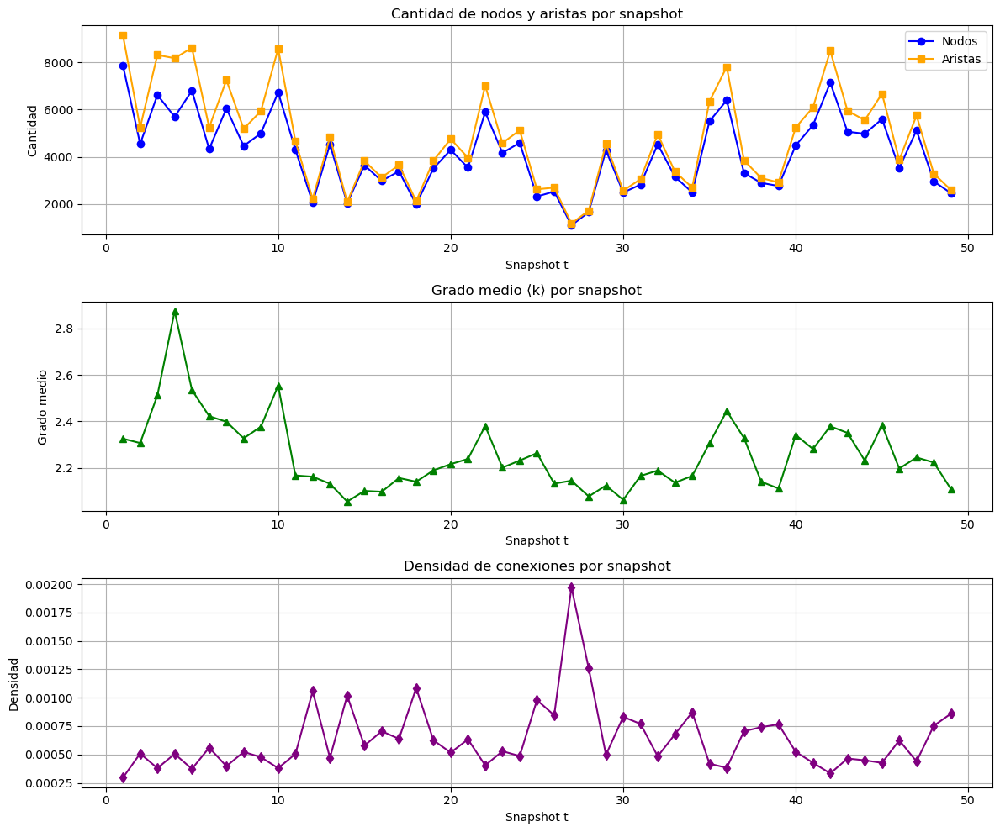

In [ ]:
# Genero las listas
num_nodos_por_t = []
num_aristas_por_t = []
grado_medio_por_t = []
densidad_por_t = []

# Genero los tiempos
snapshots = sorted(set(node_times))

# Calculo para los diferentes tiempos
for t in snapshots:
    data_t, _ = get_subgraph_by_time(t, data, node_times)
    n = data_t.num_nodes
    e = data_t.num_edges

    # Agrego a la lista
    num_nodos_por_t.append(n)
    num_aristas_por_t.append(e)

    # Grado medio y densidad
    grado_medio = 2 * e / n if n > 0 else 0
    densidad = (2 * e) / (n * (n - 1)) if n > 1 else 0

    # Agrego a la lista
    grado_medio_por_t.append(grado_medio)
    densidad_por_t.append(densidad)

# Genero las figuras
plt.figure(figsize=(12, 10))

# Subplot 1: Nodos y aristas
plt.subplot(3, 1, 1)
plt.plot(snapshots, num_nodos_por_t, label='Nodos', marker='o', color='blue')
plt.plot(snapshots, num_aristas_por_t, label='Aristas', marker='s', color='orange')
plt.title("Cantidad de nodos y aristas por snapshot")
plt.xlabel("Snapshot t")
plt.ylabel("Cantidad")
plt.legend()
plt.grid(True)

# Subplot 2: Grado medio
plt.subplot(3, 1, 2)
plt.plot(snapshots, grado_medio_por_t, label='Grado medio', marker='^', color='green')
plt.title("Grado medio ⟨k⟩ por snapshot")
plt.xlabel("Snapshot t")
plt.ylabel("Grado medio")
plt.grid(True)

# Subplot 3: Densidad
plt.subplot(3, 1, 3)
plt.plot(snapshots, densidad_por_t, label='Densidad', marker='d', color='purple')
plt.title("Densidad de conexiones por snapshot")
plt.xlabel("Snapshot t")
plt.ylabel("Densidad")
plt.grid(True)

# Imprimo el grafico
plt.tight_layout()
plt.show()

Gráfico 1: Cantidad de nodos y aristas por snapshot
- Se observa una correlación directa entre el número de nodos y de aristas: cuando hay más nodos activos, también aumentan las conexiones.

Gráfico 2: Grado medio por snapshot
- El grado medio (cantidad promedio de conexiones por nodo) varía en el tiempo, pero tiende a estabilizarse alrededor de 2.2–2.4.
- En algunos snapshots, como t=3 o t=27, se observan picos por encima de 2.8, lo cual podría indicar mayor concentración de conexiones en menos nodos (mayor centralización temporal).

Gráfico 3: Densidad de conexiones por snapshot
- La densidad (cantidad de conexiones sobre el total posible) es muy baja durante todo el período, lo cual es común en grafos reales como redes de transacciones.
- Se destacan picos de densidad en snapshots como t=27, lo que sugiere momentos donde el grafo está relativamente más conectado, pese a tener menos nodos.

Conclusión: A lo largo del tiempo, el grafo de transacciones en EllipticBitcoin se comporta como una red escasamente conectada pero dinámica, con fluctuaciones en su actividad estructural. El grado medio se mantiene relativamente bajo y estable, lo que indica que la mayoría de los nodos mantienen pocas conexiones. Sin embargo, en ciertos momentos, se incrementa la conectividad, aumentando tanto el grado medio como la densidad, lo que puede coincidir con eventos puntuales de alta actividad o potenciales actividades fraudulentas.

### 3.3 Análisis según las clases de los nodos

Analicemos el conjunto de datos a partir de las características según sean los nodos. Por lo cual, analizaremos cada una de las features según sea la clase (ilícito, lícito y desconocido) utilizando boxplots. Luego, implementaremos un análisis temporal por cada clase.

#### 3.3.1 Distribución de `features` por clase

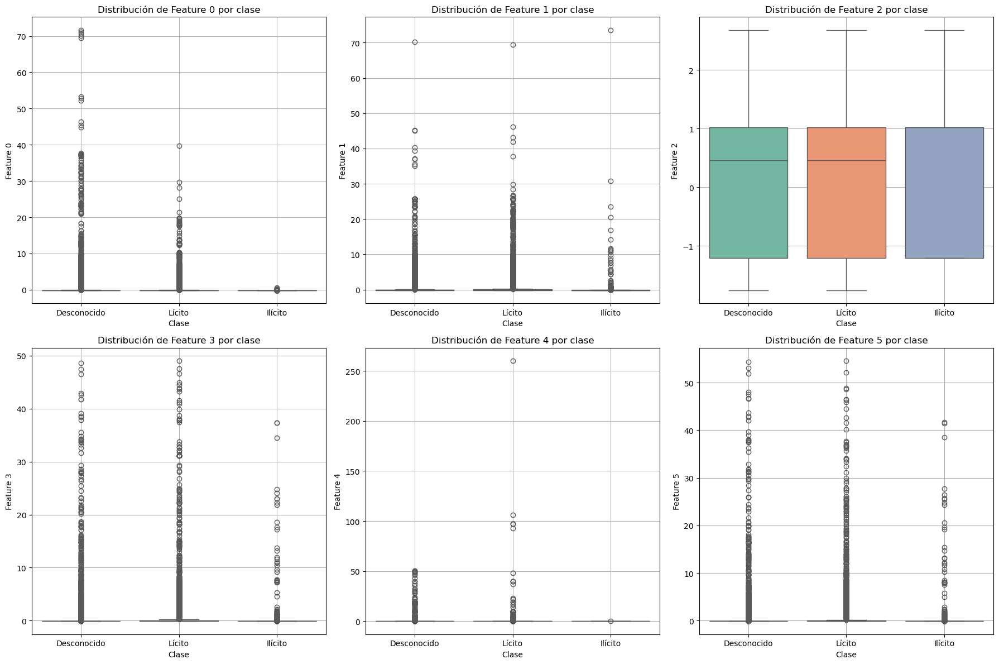

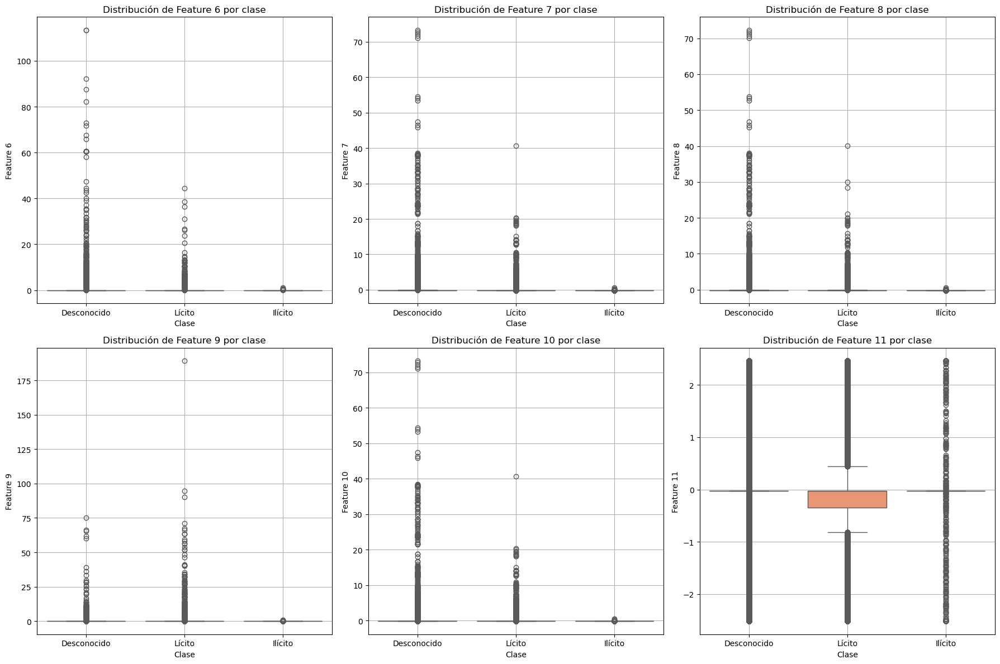

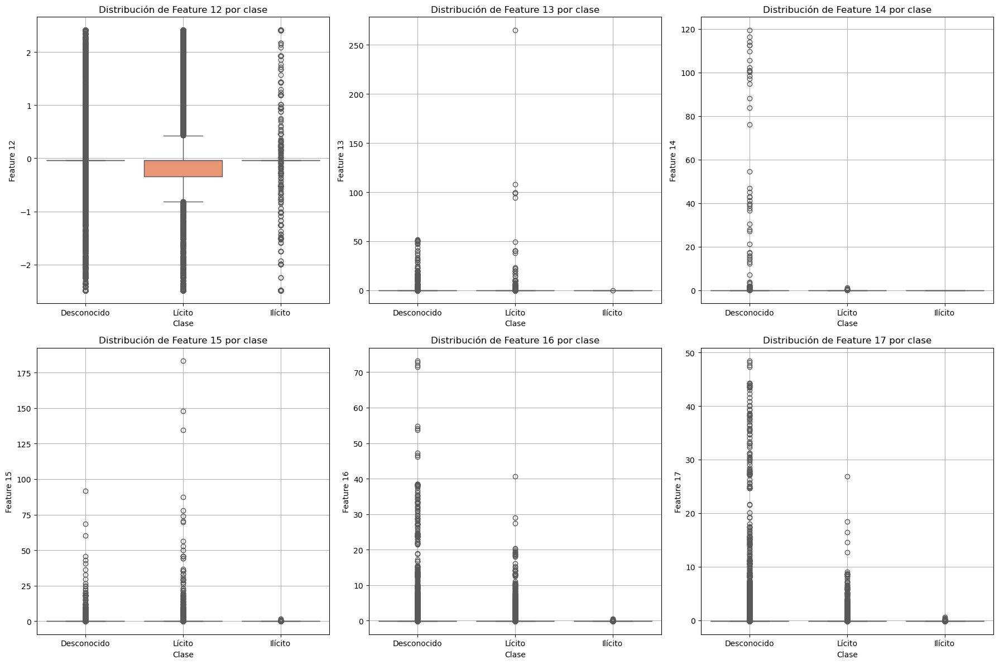

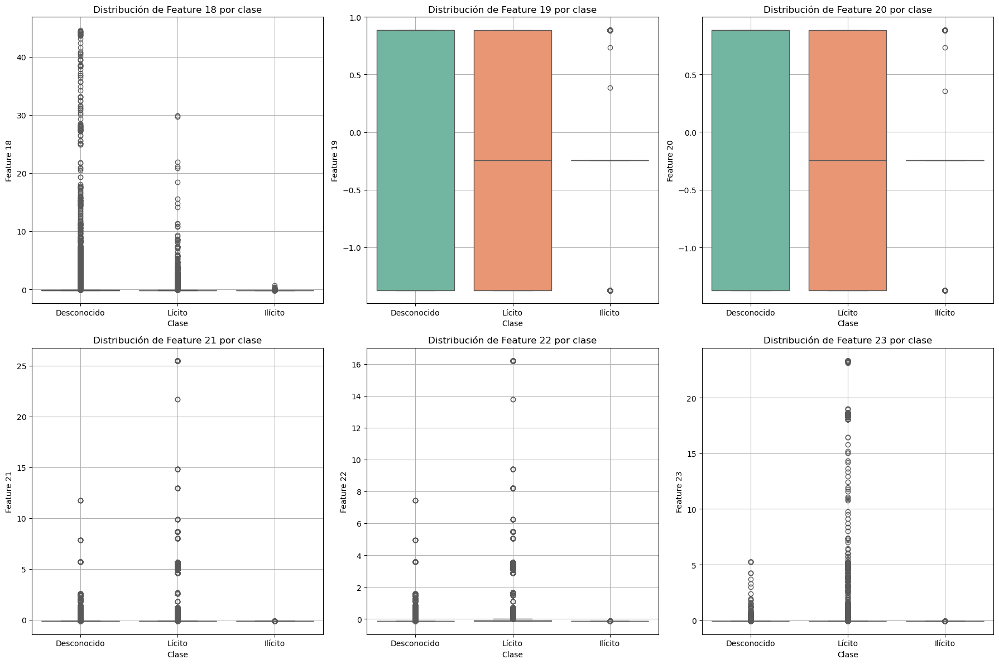

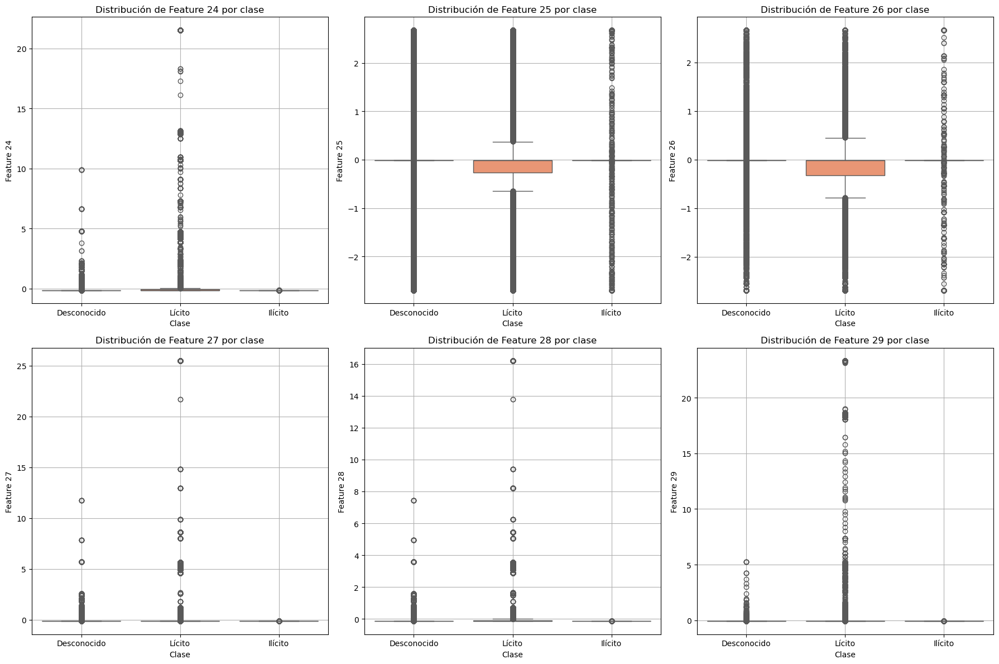

...

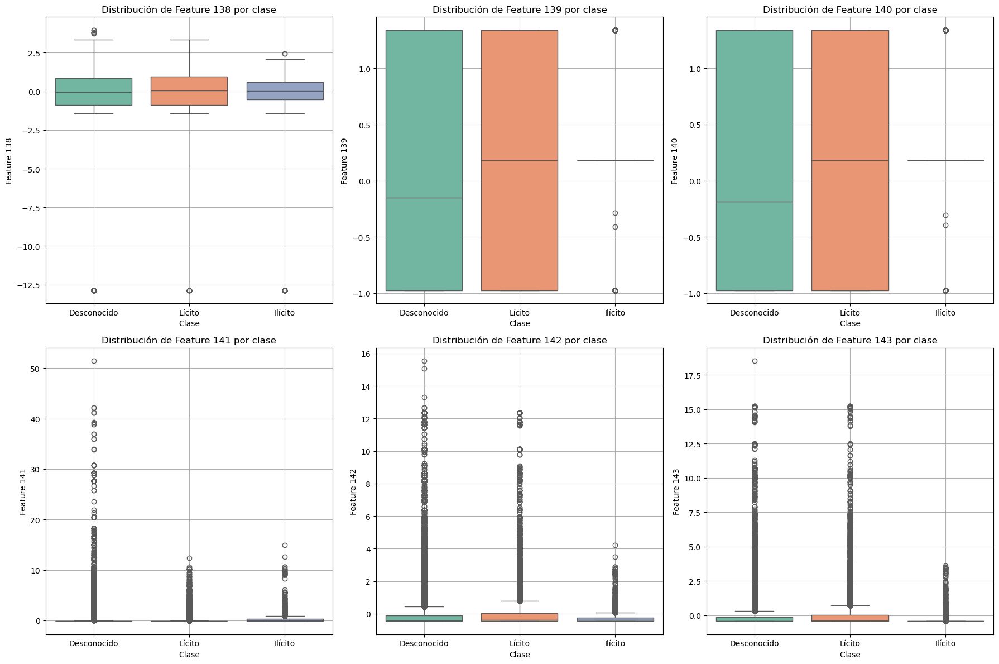

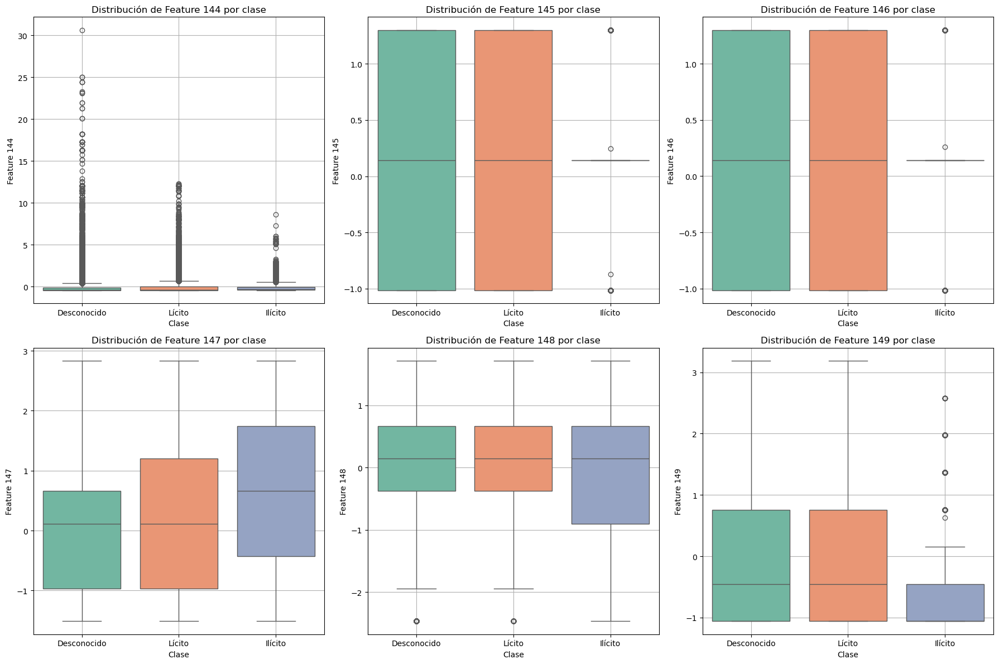

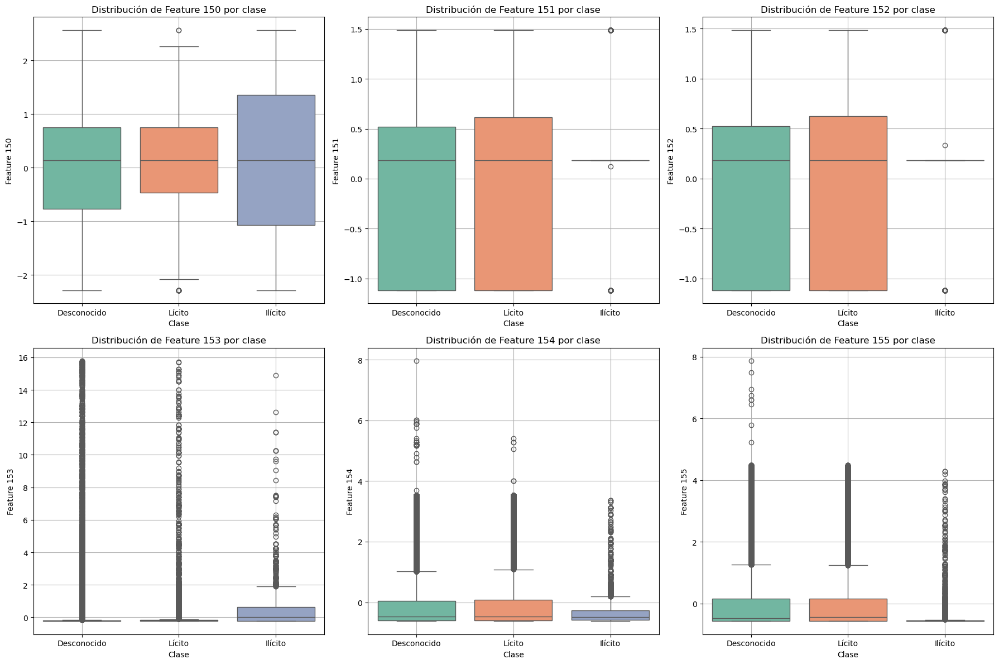

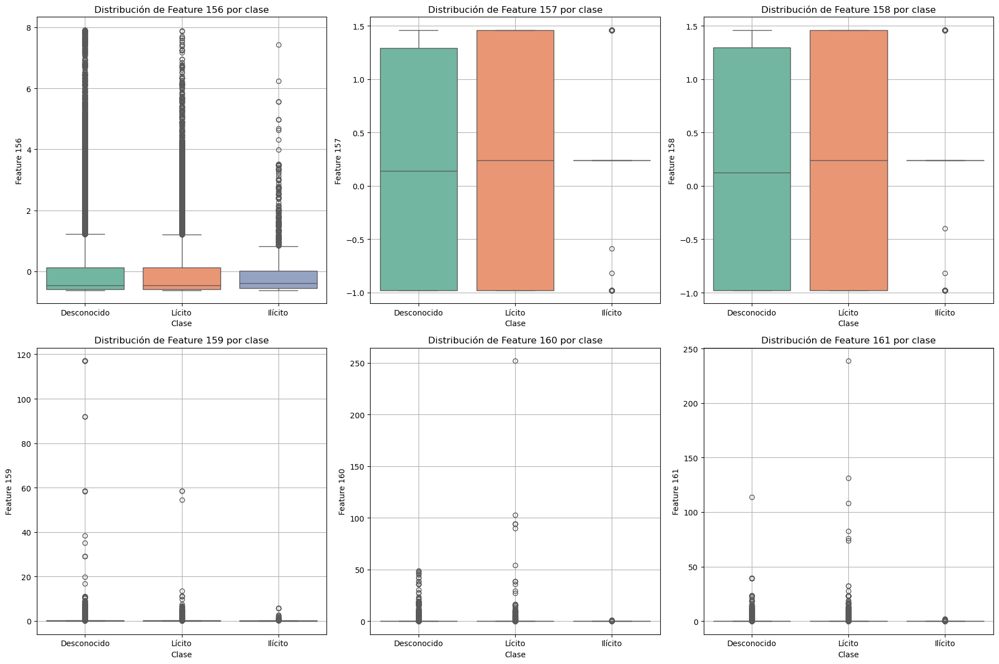

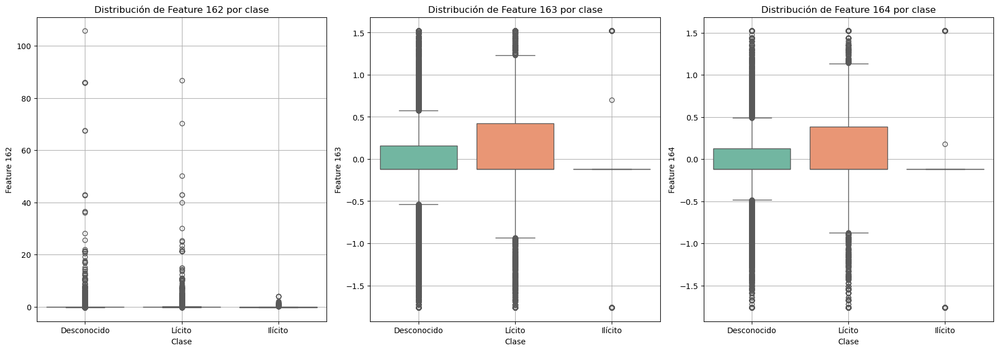

In [ ]:
# Extraer nodos, etiquetas y features
X = data.x.cpu().numpy()
y = data.y.cpu().numpy()

# Selección de features
all_features_idx = list(range(X.shape[1]))
batch_size = 6
num_batches = math.ceil(len(all_features_idx) / batch_size)

# Mapear clases
df_labels = pd.DataFrame({'Clase': y})
df_labels = df_labels[df_labels['Clase'] != -1]
df_labels['Clase'] = df_labels['Clase'].map({0: 'Lícito', 1: 'Ilícito', 2: 'Desconocido'})

# Grafico todas las features para visualizarlas
for b in range(num_batches):
    # Genero las imagenes
    plt.figure(figsize=(18, 12))
    batch_features = all_features_idx[b*batch_size:(b+1)*batch_size]

    # Crear DataFrame para este batch con nombres EXACTOS
    feature_names = [f"Feature {fidx}" for fidx in batch_features]
    df_features = pd.DataFrame(X[:, batch_features], columns=feature_names)

    # Concatenar etiquetas y features, filtrando filas con etiqueta válida
    df_batch = pd.concat([df_labels.reset_index(drop=True), df_features.reset_index(drop=True)], axis=1)
    df_batch = df_batch[df_batch['Clase'].notna()]  # asegurar no NaN

    # #Genero un loop por cada feature
    for i, feature in enumerate(feature_names):
        plt.subplot(2, 3, i+1)
        sns.boxplot(
            x='Clase',
            y=feature,
            data=df_batch,
            hue='Clase',
            palette='Set2',
            dodge=False,
            showfliers=True
        )
        plt.legend([], [], frameon=False)
        plt.title(f'Distribución de {feature} por clase')
        plt.grid(True)
    # Imprimo las graficas
    plt.tight_layout()
    plt.show()

#### 3.3.2 Evolución temporal de cada clase

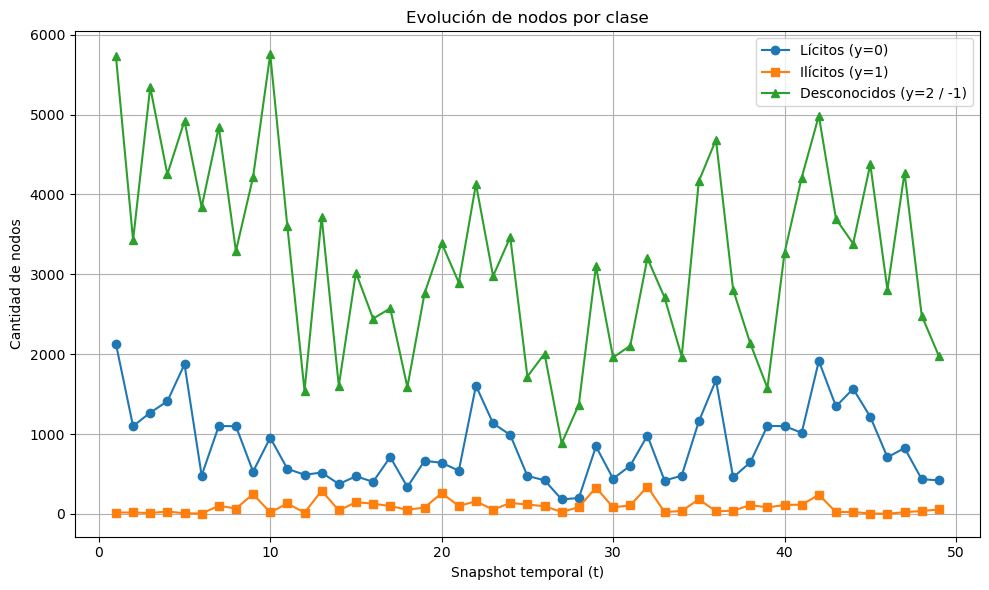

In [ ]:
# Inicializar listas
timesteps = sorted(set(node_times))
count_licit = []
count_illicit = []
count_unknown = []

# Genero las listas
for t in timesteps:
    data_t, idx_t = get_subgraph_by_time(t, data, node_times)
    y_t = data_t.y.cpu().numpy()

    # Agrego los valores calculados a las listas
    count_licit.append(np.sum(y_t == 0))
    count_illicit.append(np.sum(y_t == 1))
    count_unknown.append(np.sum((y_t == 2) | (y_t == -1)))

# Gráfico
plt.figure(figsize=(10, 6))
plt.plot(timesteps, count_licit, label="Lícitos (y=0)", marker='o')
plt.plot(timesteps, count_illicit, label="Ilícitos (y=1)", marker='s')
plt.plot(timesteps, count_unknown, label="Desconocidos (y=2 / -1)", marker='^')
plt.xlabel("Snapshot temporal (t)")
plt.ylabel("Cantidad de nodos")
plt.title("Evolución de nodos por clase")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Como resultado se puede observar que:
* Los boxplots de algunas features por clase permiten ver si alguna feature separa bien las clases.
* Las curvas temporales que muestran si las clases se distribuyen uniformemente o si hay periodos de mayor actividad ilícita o desconocida.

#### 3.3.3 Conectividad media por clase

Grado medio por clase:

$$
\langle k \rangle_t(c) = \frac{2 \times \text{aristas entre nodos de clase } c}{\text{nodos de clase } c}
$$

Entonces:

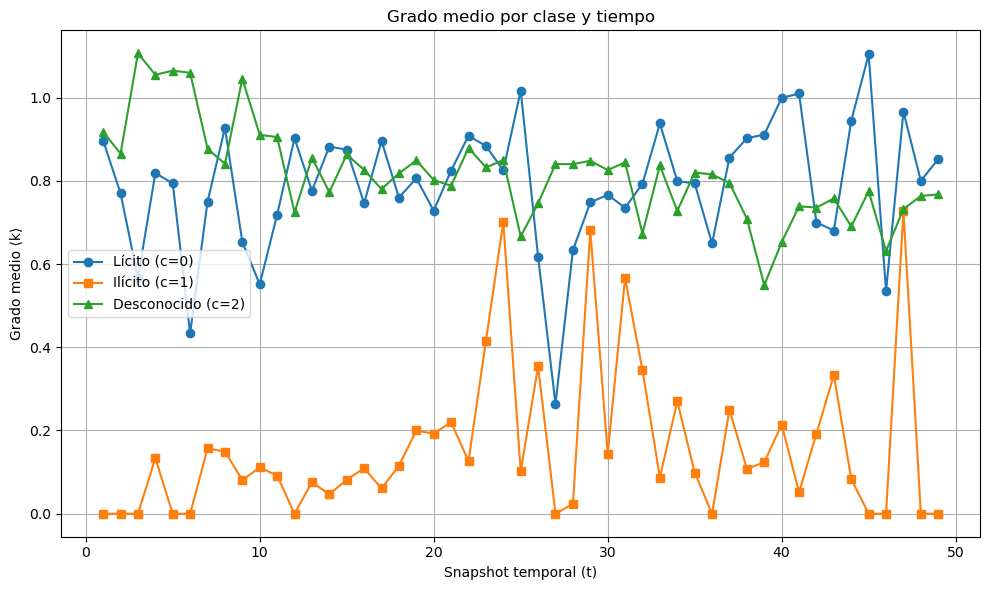

In [ ]:
# Inicializamos listas para guardar resultados
degree_mean_licit = []
degree_mean_illicit = []
degree_mean_unknown = []

for t in timesteps:
    data_t, idx_t = get_subgraph_by_time(t, dataset[0], node_times)
    y_t = data_t.y.cpu().numpy()
    edge_index = data_t.edge_index.cpu().numpy()

    # Para cada clase, seleccionamos los nodos de esa clase
    for clase, deg_list in zip(
        [0,1,2],
        [degree_mean_licit, degree_mean_illicit, degree_mean_unknown]
    ):
        nodes_clase = np.where(y_t == clase)[0]
        if len(nodes_clase) == 0:
            deg_list.append(0)
            continue

        # Filtrar aristas entre nodos de esa clase:
        mask_src = np.isin(edge_index[0], nodes_clase)
        mask_dst = np.isin(edge_index[1], nodes_clase)
        mask = mask_src & mask_dst

        # Aristas internas clase c
        num_aristas_clase = np.sum(mask) // 2  # divido 2 para no contar doble

        # Grado medio
        k_prom = 2 * num_aristas_clase / len(nodes_clase)
        deg_list.append(k_prom)

# Graficar
plt.figure(figsize=(10,6))
plt.plot(timesteps, degree_mean_licit, label="Lícito (c=0)", marker='o')
plt.plot(timesteps, degree_mean_illicit, label="Ilícito (c=1)", marker='s')
plt.plot(timesteps, degree_mean_unknown, label="Desconocido (c=2)", marker='^')
plt.xlabel("Snapshot temporal (t)")
plt.ylabel("Grado medio ⟨k⟩")
plt.title("Grado medio por clase y tiempo")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

#### 3.3.4 Caracterización individual de nodos

1. ***Grado***

   *Definición*: Es la cantidad de conexiones que tiene un nodo con otros nodos. En grafos no dirigidos, es simplemente el número de aristas conectadas al nodo.

   *Interpretación*:

   * Un nodo con alto grado participa en muchas transacciones (envía o recibe Bitcoin de muchos otros).
   * Un nodo aislado (grado 0) no tiene transacciones en el snapshot considerado.

    En el contexto de Bitcoin:

    * Nodos con alto grado pueden ser exchanges, mixers, o cuentas muy activas.
    * En nodos ilícitos, alto grado podría sugerir un intento de difuminar trazabilidad (e.g., lavado de dinero).

2. ***Coeficiente de clustering (Clustering coefficient)***

   *Definición*: Mide qué tan conectados están entre sí los vecinos de un nodo. Es decir, si un nodo tiene muchos vecinos, ¿qué fracción de esos vecinos están también conectados entre sí?

    $$
    C_i = \frac{2 \times \text{numero de triangulos conectados a $i$} }{\text{grado($i$)} \times (\text{grado($i$)-$1$})}
    $$

   *Interpretación*:

   * Valores cercanos a 1 indican que el nodo está en un grupo cohesivo (e.g., círculo cerrado de transacciones).
   * Valores bajos indican que el nodo conecta con nodos aislados entre sí (rol de puente o distribuidor).

    En el contexto de Bitcoin:

    * Alta clustering puede sugerir colaboración entre direcciones, como transacciones entre nodos controlados por la misma entidad.
    * En nodos ilícitos puede indicar estructuras coordinadas (e.g., redes de lavado).

3. ***Centralidad de cercanía (Closeness centrality)***

   *Definición*: Mide qué tan cerca está un nodo del resto de los nodos del grafo. Se calcula como el inverso de la suma de las distancias mínimas desde ese nodo hacia todos los demás.

    $$
    C_{closeness}(i) = \frac{ 1 }{\sum_{j} d(i,j)}
    $$

   *Interpretación*:

   * Alto valor: el nodo puede alcanzar rápidamente a todos los demás, ideal para difundir información o fondos.
   * Bajo valor: el nodo está en la periferia o aislado del grafo.

    En el contexto de Bitcoin:

    * Alta cercanía puede sugerir nodos puente, mezcladores, o nodos con alta capacidad de diseminación.
    * En análisis de crimen, estos nodos pueden ser estratégicos para propagar fondos ilícitos.

A continuación, se analizan estas métricas topológicas en un snapshot temporal específico, con el objetivo de observar cómo varía la estructura del grafo en ese instante y detectar posibles patrones o comportamientos diferenciales entre clases de nodos.

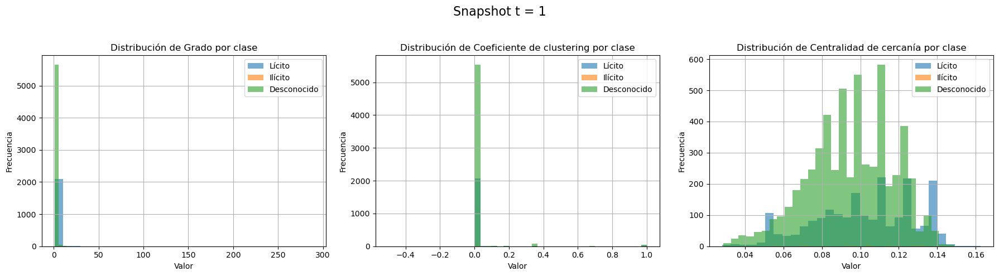

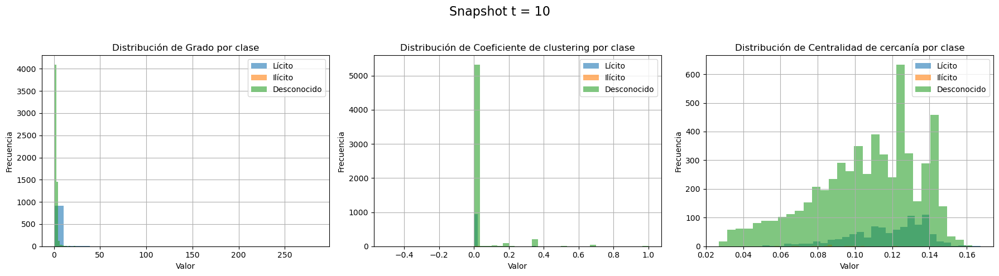

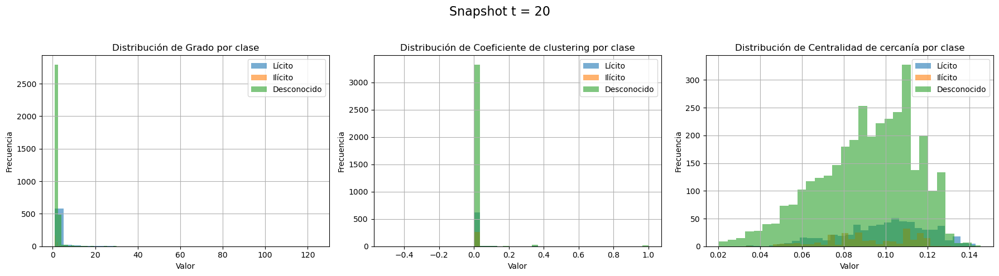

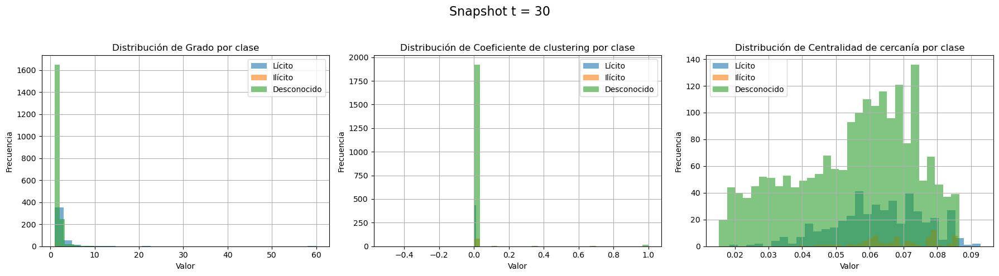

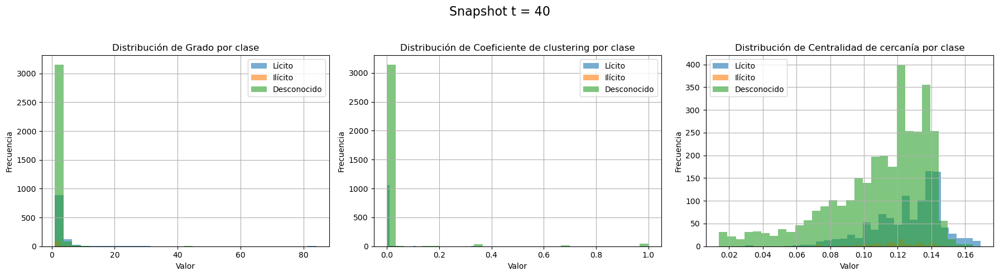

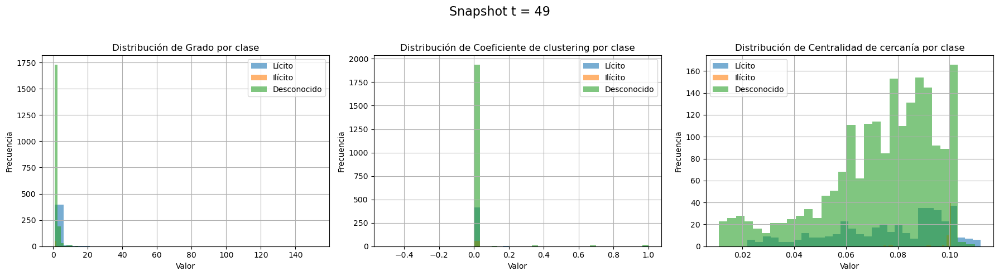

In [ ]:
# Valores de tiempos
snapshots = [1,10,20,30,40,49]

# Calculo y grafico las métricas para diferentes valorse de tiempo
for t in snapshots:
    data_t, idx_t = get_subgraph_by_time(t, dataset[0], node_times)

    # Convertir a NetworkX
    G = to_networkx(data_t, to_undirected=True)
    y_t = data_t.y.cpu().numpy()

    # Calcular métricas
    grado = dict(G.degree())
    clustering = nx.clustering(G)
    centrality = nx.closeness_centrality(G)

    # Inicializar dict para métricas por clase
    metricas_por_clase = {
        "Lícito": {"grado": [], "clustering": [], "centralidad": []},
        "Ilícito": {"grado": [], "clustering": [], "centralidad": []},
        "Desconocido": {"grado": [], "clustering": [], "centralidad": []}
    }

    # Clasificar nodos y guardar métricas
    for idx_nodo, clase in enumerate(y_t):
        if clase == 0:
            clase_str = "Lícito"
        elif clase == 1:
            clase_str = "Ilícito"
        elif clase == 2:
            clase_str = "Desconocido"
        else:
            continue  # etiquetas inválidas

        metricas_por_clase[clase_str]["grado"].append(grado.get(idx_nodo, 0))
        metricas_por_clase[clase_str]["clustering"].append(clustering.get(idx_nodo, 0))
        metricas_por_clase[clase_str]["centralidad"].append(centrality.get(idx_nodo, 0))

    # Graficar
    metricas = ["grado", "clustering", "centralidad"]
    titulos = ["Grado", "Coeficiente de clustering", "Centralidad de cercanía"]

    # Genero las figuras
    plt.figure(figsize=(18, 5))
    plt.suptitle(f"Snapshot t = {t}", fontsize=16)

    # Itero por cada fila
    for i, metrica in enumerate(metricas):
        plt.subplot(1, 3, i+1)
        for clase, datos in metricas_por_clase.items():
            plt.hist(datos[metrica], bins=30, alpha=0.6, label=clase)
        plt.title(f"Distribución de {titulos[i]} por clase")
        plt.xlabel("Valor")
        plt.ylabel("Frecuencia")
        plt.legend()
        plt.grid(True)

    # Imprimo los gráficos
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

En lo que sigue, calculamos para cada snapshot temporal *t* y para cada clase (Lícito, Ilícito, Desconocido) las siguientes métricas de los nodos en función del tiempo:

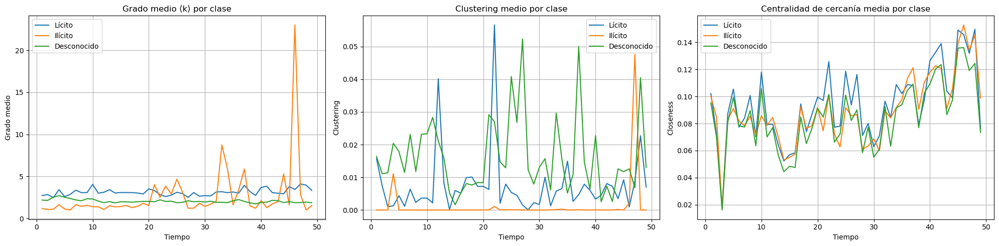

In [ ]:
# Inicializamos listas por clase
clases = {0: 'Lícito', 1: 'Ilícito', 2: 'Desconocido'}

# Diccionarios con evolución temporal por clase
evolucion_grado = {nombre: [] for nombre in clases.values()}
evolucion_clustering = {nombre: [] for nombre in clases.values()}
evolucion_centralidad = {nombre: [] for nombre in clases.values()}

#  Calculo para diferentes tiempos
for t in timesteps:
    data_t, idx_t = get_subgraph_by_time(t, dataset[0], node_times)
    y_t = data_t.y.cpu().numpy()

    # Genero el grafo
    G = to_networkx(data_t, to_undirected=True)

    # Métricas completas
    grado = dict(G.degree())
    clustering = nx.clustering(G)
    centralidad = nx.closeness_centrality(G)

    for clase_val, clase_nombre in clases.items():
        # Nodos de esta clase
        nodos_clase = [i for i, c in enumerate(y_t) if c == clase_val]

        # Control
        if len(nodos_clase) == 0:
            # Si no hay nodos, guardar 0
            evolucion_grado[clase_nombre].append(0)
            evolucion_clustering[clase_nombre].append(0)
            evolucion_centralidad[clase_nombre].append(0)
            continue

        # Agregar medias
        grado_med = np.mean([grado.get(n, 0) for n in nodos_clase])
        clustering_med = np.mean([clustering.get(n, 0) for n in nodos_clase])
        centralidad_med = np.mean([centralidad.get(n, 0) for n in nodos_clase])

        # Agrego a las listas
        evolucion_grado[clase_nombre].append(grado_med)
        evolucion_clustering[clase_nombre].append(clustering_med)
        evolucion_centralidad[clase_nombre].append(centralidad_med)

# -----------------------------
# Graficar evolución temporal
# -----------------------------
fig, axs = plt.subplots(1, 3, figsize=(20, 5))

# 1. Grado medio
for clase in clases.values():
    axs[0].plot(timesteps, evolucion_grado[clase], label=clase)
axs[0].set_title("Grado medio ⟨k⟩ por clase")
axs[0].set_xlabel("Tiempo")
axs[0].set_ylabel("Grado medio")
axs[0].grid(True)
axs[0].legend()

# 2. Clustering medio
for clase in clases.values():
    axs[1].plot(timesteps, evolucion_clustering[clase], label=clase)
axs[1].set_title("Clustering medio por clase")
axs[1].set_xlabel("Tiempo")
axs[1].set_ylabel("Clustering")
axs[1].grid(True)
axs[1].legend()

# 3. Centralidad media
for clase in clases.values():
    axs[2].plot(timesteps, evolucion_centralidad[clase], label=clase)
axs[2].set_title("Centralidad de cercanía media por clase")
axs[2].set_xlabel("Tiempo")
axs[2].set_ylabel("Closeness")
axs[2].grid(True)
axs[2].legend()

# Imprimo los gráficos
plt.tight_layout()
plt.show()

 1. Grado medio por clase (izquierda)
  - En general, los nodos lícitos presentan un grado medio consistentemente más alto que los ilícitos y desconocidos.
  - Los nodos ilícitos tienden a tener el menor grado medio durante la mayor parte del tiempo, aunque se observan algunos picos aislados (por ejemplo, en t ≈ 46) que podrían deberse a eventos anómalos o actividad coordinada.
  - Esto refuerza la idea de que los nodos ilícitos operan con menor conectividad para reducir su exposición.

2. Clustering medio por clase (centro)
 - El clustering es generalmente muy bajo en todas las clases, lo que sugiere que los nodos no tienden a formar triángulos o comunidades cerradas.
 - Los nodos ilícitos muestran clustering prácticamente nulo a lo largo de casi todos los snapshots, indicando una estrategia de aislamiento o evasión de redes densas.
 - Los lícitos y desconocidos presentan mayor variabilidad, pero sin llegar a valores altos.

3. Centralidad de cercanía media por clase (derecha)
 - La centralidad de cercanía aumenta progresivamente en el tiempo para todas las clases, lo que podría deberse a una mayor integración de los nodos en la red a medida que esta evoluciona.
 - Aunque las diferencias son sutiles, los nodos lícitos tienden a estar más “cerca” del resto de la red, mientras que los ilícitos y desconocidos presentan valores similares pero ligeramente inferiores en promedio.

Conclusión: A lo largo del tiempo, los nodos lícitos mantienen una mayor conectividad, están mejor integrados en la red y presentan algo más de agrupamiento local. En contraste, los nodos ilícitos muestran sistemáticamente valores más bajos en grado y clustering, lo que refleja un comportamiento más aislado y disperso. Estas diferencias estructurales pueden ser claves para alimentar modelos de detección de fraude basados en propiedades de red.

#### 3.3.5 Nodos por conectividad

A continuación, separaremos los nodos por conectividad (aislados, grado bajo/medio/alto), donde debemos recordar que:

* **Aislados**: grado = 0.
* **Bajo**: grado 1–2.
* **Medio**: grado 3–10
* **Alto**: grado >10

En lo que sigue, calcularemos la distribución de los grados. En el primer caso, consideraremos todos los nodos en todo el intervalo de tiempo.

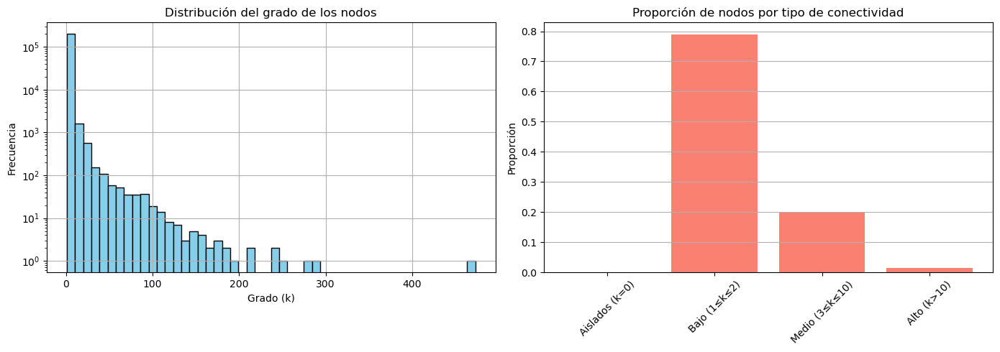

In [ ]:
# Obtener snapshot completo
data = dataset[0]
G = to_networkx(data, to_undirected=True)

# Calcular grado de todos los nodos
grado = dict(G.degree())

# Convertir a tensor para análisis
grado_tensor = torch.tensor(list(grado.values()))

# Categorías de conectividad
aislados = (grado_tensor == 0).sum().item()
grado_bajo = ((grado_tensor > 0) & (grado_tensor <= 2)).sum().item()
grado_medio = ((grado_tensor > 2) & (grado_tensor <= 10)).sum().item()
grado_alto = (grado_tensor > 10).sum().item()

# Total de nodos
total_nodos = len(grado_tensor)

# Proporciones
proporciones = {
    "Aislados (k=0)": aislados / total_nodos,
    "Bajo (1≤k≤2)": grado_bajo / total_nodos,
    "Medio (3≤k≤10)": grado_medio / total_nodos,
    "Alto (k>10)": grado_alto / total_nodos
}

# ------------ Distribución de grados ------------
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.hist(grado_tensor.numpy(), bins=50, color='skyblue', edgecolor='black')
plt.title("Distribución del grado de los nodos")
plt.xlabel("Grado (k)")
plt.ylabel("Frecuencia")
plt.yscale('log')
plt.grid(True)

# ----------- Proporción de cada grupo ------------
plt.subplot(1, 2, 2)
plt.bar(proporciones.keys(), proporciones.values(), color='salmon')
plt.title("Proporción de nodos por tipo de conectividad")
plt.ylabel("Proporción")
plt.xticks(rotation=45)
plt.grid(True, axis='y')

# Imprimo las graficas
plt.tight_layout()
plt.show()

Como segundo punto de análisis, calcularemos la conectividad en función de la evolución temporal:

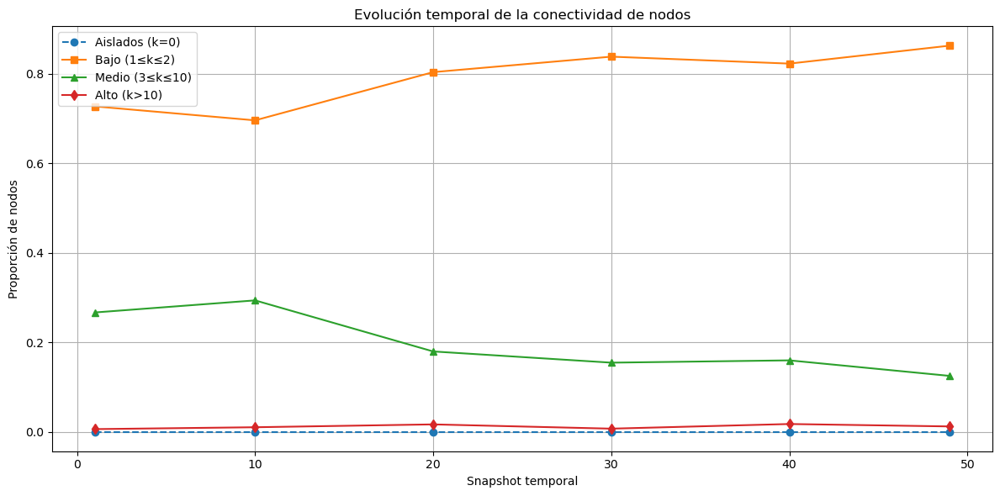

In [ ]:
# Lista de snapshots disponibles
conectividad_por_tiempo = []

# Calculo para cada uno de los tiempos
for t in snapshots:
    # Obtener subgrafo en el snapshot t
    data_t, idx_t = get_subgraph_by_time(t, dataset[0], node_times)
    G_t = to_networkx(data_t, to_undirected=True)

    # Calcular grado
    grado = dict(G_t.degree())
    grados_t = torch.tensor(list(grado.values()))

    # Clasificar por conectividad
    aislados = (grados_t == 0).sum().item()
    grado_bajo = ((grados_t > 0) & (grados_t <= 2)).sum().item()
    grado_medio = ((grados_t > 2) & (grados_t <= 10)).sum().item()
    grado_alto = (grados_t > 10).sum().item()

    # Total de los nodos
    total_nodos = len(grados_t)

    # Genero el diccionario con los datos
    conectividad_por_tiempo.append({
        't': t,
        'aislados': aislados / total_nodos if total_nodos > 0 else 0,
        'bajo': grado_bajo / total_nodos if total_nodos > 0 else 0,
        'medio': grado_medio / total_nodos if total_nodos > 0 else 0,
        'alto': grado_alto / total_nodos if total_nodos > 0 else 0
    })

# Convertimos a DataFrame para graficar
df_conectividad = pd.DataFrame(conectividad_por_tiempo)

# ------------------ Gráfico de evolución temporal ------------------
plt.figure(figsize=(12, 6))
plt.plot(df_conectividad['t'], df_conectividad['aislados'], label='Aislados (k=0)', linestyle='--', marker='o')
plt.plot(df_conectividad['t'], df_conectividad['bajo'], label='Bajo (1≤k≤2)', marker='s')
plt.plot(df_conectividad['t'], df_conectividad['medio'], label='Medio (3≤k≤10)', marker='^')
plt.plot(df_conectividad['t'], df_conectividad['alto'], label='Alto (k>10)', marker='d')

# Imprimo el gráfico
plt.title("Evolución temporal de la conectividad de nodos")
plt.xlabel("Snapshot temporal")
plt.ylabel("Proporción de nodos")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

En el tercer punto de análisis, calcularemos la conectividad en función de la evolución temporal paracada una de las clases:

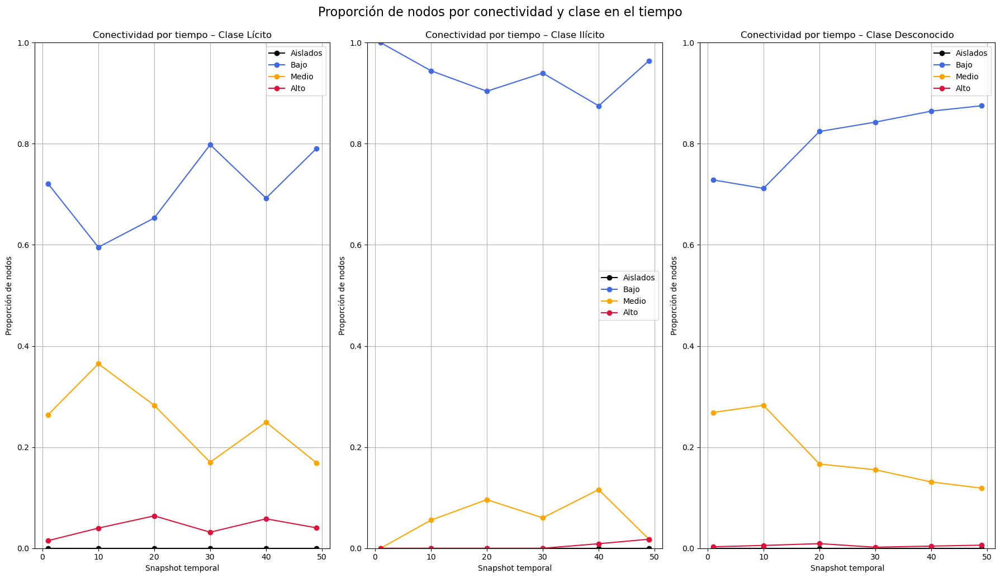

In [ ]:
# Diccionario para acumular las proporciones por clase y tiempo
conectividad_clase_tiempo = defaultdict(lambda: {
    'aislados': [], 'bajo': [], 'medio': [], 'alto': []
})

# Calculo para cada uno de los tiempos
for t in snapshots:
    data_t, idx_t = get_subgraph_by_time(t, dataset[0], node_times)
    G = to_networkx(data_t, to_undirected=True)
    y_t = data_t.y.cpu().numpy()
    grados = dict(G.degree())

    # Clasificar nodos por clase
    clases = {0: 'Lícito', 1: 'Ilícito', 2: 'Desconocido'}
    nodos_por_clase = {c: [] for c in clases.values()}

    for idx_local, clase_id in enumerate(y_t):
        clase_nombre = clases.get(clase_id)
        if clase_nombre is not None:
            nodos_por_clase[clase_nombre].append(idx_local)

    # Contar proporciones por conectividad para cada clase
    for clase, nodos in nodos_por_clase.items():
        if not nodos:
            for tipo in ['aislados', 'bajo', 'medio', 'alto']:
                conectividad_clase_tiempo[clase][tipo].append(0.0)
            continue

        grados_clase = torch.tensor([grados.get(n, 0) for n in nodos])
        total = len(grados_clase)

        aislados = (grados_clase == 0).sum().item() / total
        bajo = ((grados_clase > 0) & (grados_clase <= 2)).sum().item() / total
        medio = ((grados_clase > 2) & (grados_clase <= 10)).sum().item() / total
        alto = (grados_clase > 10).sum().item() / total

        conectividad_clase_tiempo[clase]['aislados'].append(aislados)
        conectividad_clase_tiempo[clase]['bajo'].append(bajo)
        conectividad_clase_tiempo[clase]['medio'].append(medio)
        conectividad_clase_tiempo[clase]['alto'].append(alto)

# Graficar para cada clase
tipos_conectividad = ['aislados', 'bajo', 'medio', 'alto']
colores = {
    'aislados': 'black',
    'bajo': 'royalblue',
    'medio': 'orange',
    'alto': 'crimson'
}

# Genero la grafica
plt.figure(figsize=(18, 10))
for i, (clase, valores) in enumerate(conectividad_clase_tiempo.items()):
    plt.subplot(1, 3, i + 1)
    for tipo in tipos_conectividad:
        plt.plot(snapshots, valores[tipo], label=tipo.capitalize(), color=colores[tipo], marker='o')
    plt.title(f'Conectividad por tiempo – Clase {clase}')
    plt.xlabel('Snapshot temporal')
    plt.ylabel('Proporción de nodos')
    plt.ylim(0, 1)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()

# Imprimo la grafica
plt.suptitle("Proporción de nodos por conectividad y clase en el tiempo", fontsize=16, y=1.03)
plt.show()

Conclusión: La conectividad en la red varía significativamente según la clase de nodo. Los nodos lícitos muestran una mayor diversidad en sus niveles de conexión, incluyendo una proporción estable de nodos con conectividad media y alta. Por el contrario, los nodos ilícitos mantienen sistemáticamente una conectividad baja, lo que refuerza su perfil menos visible y menos integrado en la red. Los nodos de clase desconocida se comportan de forma intermedia, aunque se acercan más al patrón ilícito.

#### 3.3.6 Análisis de Componentes Principales (PCA)

Recordemos que PCA (Análisis de Componentes Principales) es una técnica de reducción de dimensionalidad. Su objetivo es transformar un conjunto de variables posiblemente correlacionadas (como las `features` de los nodos) en un conjunto más pequeño de variables no correlacionadas llamadas componentes principales. Esto nos permite:

* Visualizar datos complejos (con muchas dimensiones) en 2D o 3D.
* Facilita la detección de patrones o agrupamientos.
* Mejora el rendimiento de modelos eliminando redundancias o ruido.

Cada componente principal es una dirección en el espacio de las features que captura la mayor varianza posible. La primera componente captura la dirección con mayor dispersión de datos, la segunda la siguiente mayor, y así sucesivamente.

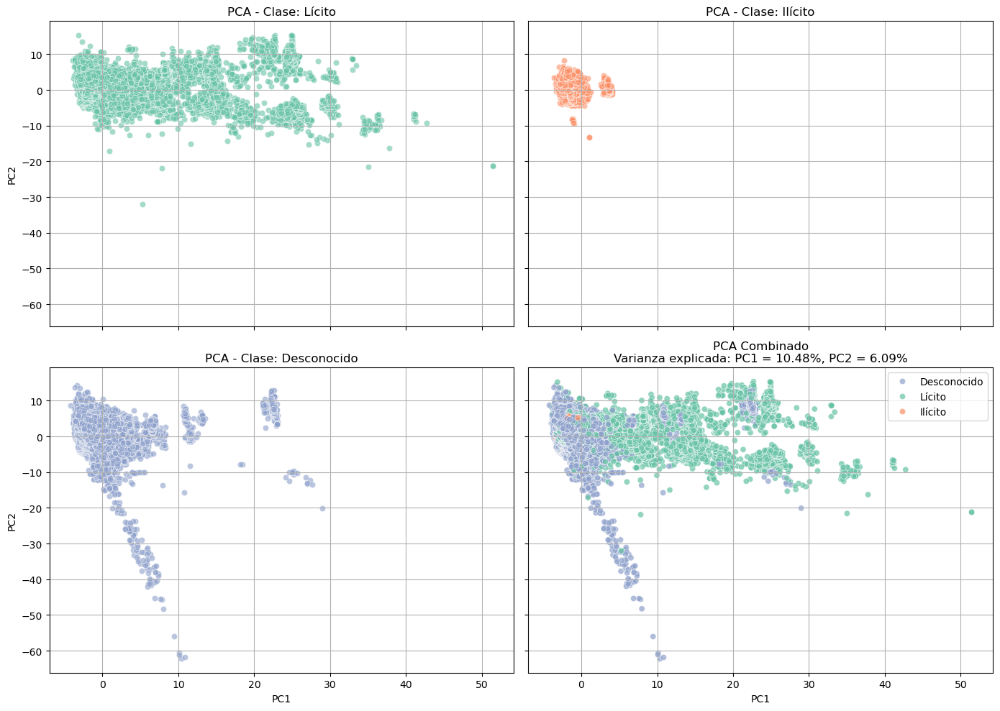

In [ ]:
# Extraer nodos, etiquetas y features
X = data.x.cpu().numpy()
y = data.y.cpu().numpy()

# Filtrar nodos con etiquetas válidas
mask_valid = (y != -1)
X_valid = X[mask_valid]
y_valid = y[mask_valid]

# Mapear clases
clases_map = {0: 'Lícito', 1: 'Ilícito', 2: 'Desconocido'}
colores_clase = {'Lícito': '#66c2a5', 'Ilícito': '#fc8d62', 'Desconocido': '#8da0cb'}
clases = pd.Series(y_valid).map(clases_map)

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_valid)
explained_var = pca.explained_variance_ratio_

# DataFrame
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['Clase'] = clases.values

# Multiplot 2x2
fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
axs = axs.flatten()

# Gráficos individuales por clase
for i, clase in enumerate(clases_map.values()):
    sns.scatterplot(
        data=df_pca[df_pca['Clase'] == clase],
        x='PC1', y='PC2', ax=axs[i],
        alpha=0.6, color=colores_clase[clase]
    )
    axs[i].set_title(f'PCA - Clase: {clase}')
    axs[i].grid(True)

# Gráfico combinado
sns.scatterplot(
    data=df_pca,
    x='PC1', y='PC2', hue='Clase',
    palette=colores_clase, alpha=0.7, ax=axs[3]
)
axs[3].set_title(
    f'PCA Combinado\nVarianza explicada: PC1 = {explained_var[0]:.2%}, PC2 = {explained_var[1]:.2%}'
)
axs[3].legend()
axs[3].grid(True)

# GEnero el gráfico
plt.tight_layout()
plt.show()

***Interpretación general del gráfico***:
* Cada punto representa un nodo.
* Los ejes `PC1` y `PC2` son combinaciones lineales de las features originales.
* Nodos más cercanos están más "relacionados" en términos de sus atributos.
* Si los colores se separan bien, significa que las clases tienen diferencias claras en las `features`.

***En el contexto de Elliptic Bitcoin Dataset***:
* Cada nodo representa una transacción en la red Bitcoin.
* Cada nodo está asociado a:
    * Un timestamp (snapshot temporal).
    * Un vector de 166 features: estadísticas de transacción, flujos de dinero, estructura del grafo, etc.
    * Una etiqueta:
        * 0: transacción lícita
        * 1: transacción ilícita (relacionada con actividades criminales, p. ej. ransomware)
        * 2: desconocida (sin etiqueta)
        * -1: (a veces se usa para marcar nodos sin etiqueta usable)

Aquí, el PCA lo que hace es:

* Reduce los 166 atributos que describen las transacciones a solo 2 componentes principales.
* Estos nuevos ejes representan las direcciones en las que más varían las transacciones en el conjunto de datos.
* El gráfico muestra cada transacción (nodo) como un punto en un plano, coloreado por su clase (`lícita`, `ilícita` o `desconocida`).

Entonces, la interprestación del gráfico PCA es:

1. Agrupamientos visuales separados entre clases:
    1. Si las transacciones ilícitas aparecen agrupadas en una región distinta a las lícitas, significa que tienen comportamientos sistemáticamente distintos (en términos de sus features).
    2. Esto puede reflejar, por ejemplo, que las transacciones ilícitas:
        * Tienen patrones de flujo distintos.
        * Se conectan con otras de forma más estructurada (p. ej., hubs).
        * Usan montos, tiempos o estructuras de red diferentes.
2. Superposición fuerte entre clases:
    1. Si las clases se mezclan mucho, entonces las transacciones ilícitas y lícitas no se diferencian claramente usando solo las primeras dos componentes principales.
    2. Puede ser que:
        * La diferencia esté en componentes menores (PC3, PC4...).
        * O bien, las transacciones ilícitas están camufladas y no se distinguen fácilmente por sus atributos básicos.
3. Distribución de nodos desconocidos:
    1. Si las transacciones con clase desconocida caen más cerca de las ilícitas que de las lícitas, eso puede sugerir que algunas de esas etiquetas faltantes podrían ser ilícitas no identificadas.
    2. Se puede usar esto como una pista para detección de anomalías o clasificación semi-supervisada.

En resumen, el PCA nos dice si hay diferencias estructurales claras entre transacciones lícitas e ilícitas en función de sus atributos.
* Si se separan: las features del dataset capturan comportamientos distintos de las transacciones ilícitas.
* Si se mezclan: las transacciones ilegales pueden estar ocultas en patrones comunes, y quizás se necesiten métodos no lineales (UMAP, redes neuronales) para detectarlas.

Con tal motivo, veamos ahora un análisis de ***UMAP*** (Uniform Manifold Approximation and Projection):

/home/dalma/miniconda3/envs/diplo_env/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/home/dalma/miniconda3/envs/diplo_env/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


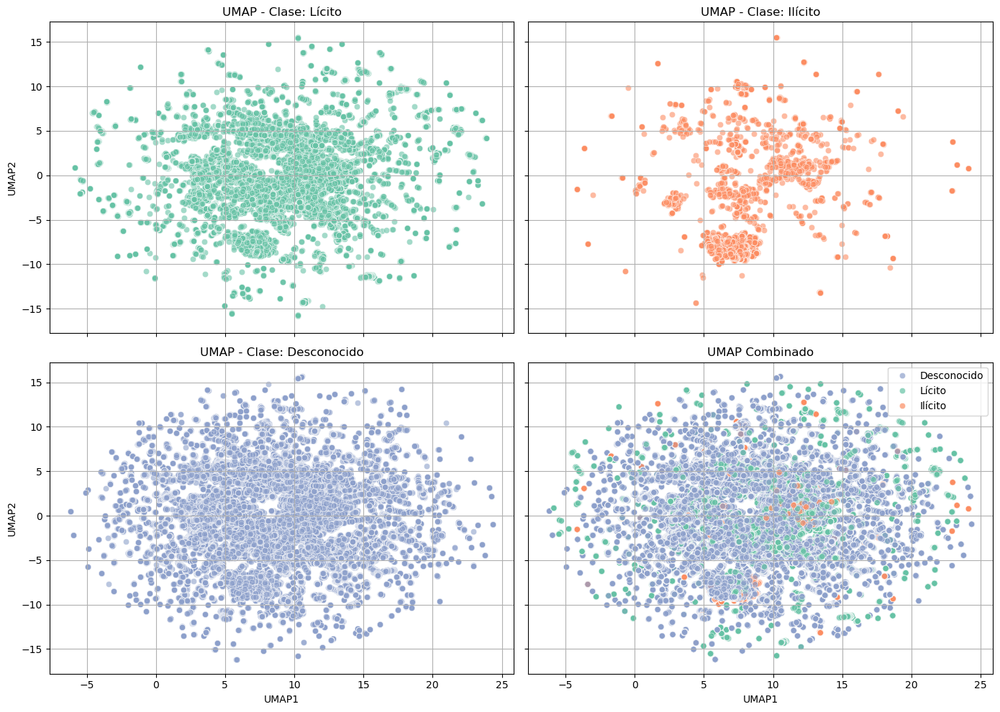

In [ ]:
# UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
X_umap = reducer.fit_transform(X_valid)

# DataFrame para visualizar
df_umap = pd.DataFrame(X_umap, columns=['UMAP1', 'UMAP2'])
df_umap['Clase'] = clases.values

# Multiplot 2x2
fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
axs = axs.flatten()

# Gráficos individuales por clase
for i, clase in enumerate(clases_map.values()):
    sns.scatterplot(
        data=df_umap[df_umap['Clase'] == clase],
        x='UMAP1', y='UMAP2', ax=axs[i],
        alpha=0.6, color=colores_clase[clase]
    )
    axs[i].set_title(f'UMAP - Clase: {clase}')
    axs[i].grid(True)

# Gráfico combinado
sns.scatterplot(
    data=df_umap,
    x='UMAP1', y='UMAP2', hue='Clase',
    palette=colores_clase, alpha=0.7, ax=axs[3]
)
axs[3].set_title('UMAP Combinado')
axs[3].legend()
axs[3].grid(True)

plt.tight_layout()
plt.show()

***¿Qué es UMAP?***

UMAP (Uniform Manifold Approximation and Projection) es una técnica de reducción de dimensionalidad no lineal que:
* Toma datos de alta dimensión (como los 166 features del Elliptic Dataset).
* Los proyecta en un espacio de 2 o 3 dimensiones para visualización o análisis exploratorio.
* Conserva tanto la estructura local (vecinos cercanos) como la global (formas grandes del conjunto).

Es especialmente útil cuando los datos tienen relaciones complejas no lineales que PCA no puede capturar bien.

***¿Cómo funciona UMAP (a grandes rasgos)?***
* Construye un grafo de proximidad entre los puntos en alta dimensión (basado en vecinos más cercanos).
* Optimiza una representación de baja dimensión que mantenga esa estructura de conectividad.
* Los puntos que estaban cerca en alta dimensión quedan juntos en el plano 2D (y viceversa).

***Aplicado al Elliptic Dataset,  ¿Qué hace UMAP?***

* Proyecta los 166 vectores en 2D.
* Visualizar si las transacciones ilícitas forman patrones distintos a las lícitas.
* De esta forma, observamos si hay una separación natural en las features originales que pueda ayudar a un clasificador.

Interpretación del gráfico UMAP:
* Si los puntos de una clase (por ejemplo, ilícitos) aparecen agrupados en ciertas zonas, significa que comparten patrones de comportamiento que UMAP ha captado.
* Si las clases se mezclan completamente, es probable que las features no sean suficientes por sí solas para diferenciarlas bien (al menos no sin un clasificador más complejo).
* Si los “Desconocidos” se agrupan cerca de lícitos o ilícitos, podrías inferir (aunque con cautela) posibles relaciones latentes.

***Comparar los embeddings de UMAP y PCA***

Entonces, vamos a comparar UMAP vs PCA como técnicas de reducción de dimensionalidad en términos de separabilidad de clases para el Elliptic Bitcoin Dataset. Para ello, usaremos la métrica ***Silhouette Score***, que mide qué tan bien separadas están las clases en un espacio embebido (PCA o UMAP):
* Varía entre -1 (mal separadas) y 1 (bien agrupadas y separadas).
* Cuanto más alto, mejor es la agrupación intra-clase y la separación inter-clase.

Interpretación:
* Si `UMAP > PCA`, entonces `UMAP` captura mejor la estructura latente de las clases (más útil para clasificación o visualización).
* Si `PCA ≈ UMAP`, probablemente las clases están entremezcladas y las features originales no permiten separarlas claramente sin modelos más complejos.

In [ ]:
# Filtrar nodos con etiquetas válidas (excluyendo y = -1)
mask_valid = (data.y != -1)
X = data.x[mask_valid].cpu().numpy()
y = data.y[mask_valid].cpu().numpy()

# PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X)

# UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
X_umap = reducer.fit_transform(X)

# Silhouette Score
score_pca = silhouette_score(X_pca, y)
score_umap = silhouette_score(X_umap, y)

# Imprimo los valores
print(f"Silhouette Score (PCA):  {score_pca:.3f}")
print(f"Silhouette Score (UMAP): {score_umap:.3f}")

/home/dalma/miniconda3/envs/diplo_env/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/dalma/miniconda3/envs/diplo_env/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Silhouette Score (PCA):  -0.159
Silhouette Score (UMAP): -0.032


#### 3.3.7 Evolución temporal por nodo

Exploraremos la evolución temporal (diferentes valores de snapshot) de cada nodo según sea su clase (lícito, ilícito y desconocida). Por lo que, en primera instancia, definiremos una función que implemente la evolución por nodo.

In [ ]:
def evolucion_nodos_optimizada(node_ids, dataset, node_times, ncols=4):
    """
    Visualiza la evolución temporal de una lista de nodos en un grafo dinámico.

    Para cada nodo, grafica su grado (cantidad de conexiones) a lo largo del tiempo,
    y marca con colores su clase (lícito, ilícito, desconocido), incluyendo nodos aislados.

    Parámetros:
    - node_ids : lista[int]
        Lista de IDs de nodos (índices globales en el dataset original).
    - dataset : torch_geometric.data.Dataset
        Dataset de PyTorch Geometric. Usualmente dataset[0] contiene el grafo completo.
    - node_times : torch.Tensor o np.ndarray
        Vector que indica a qué snapshot temporal pertenece cada nodo (misma longitud que el total de nodos).
    - ncols : int
        Número de columnas para el layout del multiplot. Por defecto: 4.

    La función:
    - Extrae subgrafos por snapshot
    - Calcula el grado y la clase del nodo por snapshot
    - Genera gráficos con evolución temporal por nodo
    """

    # === Parte 1: Caracterizar los nodos ===
    # Obtenemos las etiquetas (clases) y grados de los nodos en el grafo completo
    y = dataset[0].y
    deg = degree(dataset[0].edge_index[0], dataset[0].num_nodes)

    # Creamos un diccionario para etiquetar cada nodo según su tipo
    caracteristicas = {}
    for node_id in node_ids:
        if deg[node_id] == 0:
            caracteristicas[node_id] = "Aislado"
        elif y[node_id] == 0:
            caracteristicas[node_id] = "Lícito"
        elif y[node_id] == 1:
            caracteristicas[node_id] = "Ilícito"
        elif y[node_id] == 2:
            caracteristicas[node_id] = "Desconocido"
        else:
            caracteristicas[node_id] = "Desconocido"

    # === Parte 2: Construir la evolución temporal ===
    # Lista de tiempos únicos ordenados
    tiempos = sorted(set(node_times))

    # Lista donde se guardarán los resultados por nodo y tiempo
    resultados = []

    # Iteramos sobre cada snapshot temporal
    for t in tiempos:
        # Obtenemos el subgrafo correspondiente al snapshot t
        data_t, idx_t = get_subgraph_by_time(t, dataset[0], node_times)

        # idx_t contiene los IDs globales de nodos en este snapshot
        node_indices = idx_t.numpy()

        # Calculamos el grado de cada nodo local del subgrafo
        grados_t = degree(data_t.edge_index[0], data_t.num_nodes).numpy()

        # Extraemos las clases (y) del snapshot actual
        clases_t = data_t.y.numpy()

        # Creamos un diccionario que mapea de ID global → índice local en el snapshot t
        mapping_t = {global_id: i for i, global_id in enumerate(node_indices)}

        # Recorremos todos los nodos seleccionados
        for node_id in node_ids:
            if node_id in mapping_t:
                # Si el nodo está presente en el snapshot t
                idx_local = mapping_t[node_id]
                grado = grados_t[idx_local] if idx_local < len(grados_t) else 0
                clase = clases_t[idx_local]
            else:
                # Si el nodo no está presente en este snapshot, usamos NaN
                grado = np.nan
                clase = np.nan

            # Guardamos la información en una estructura para el DataFrame
            resultados.append({
                'Tiempo': t,
                'Grado': grado,
                'Clase': clase,
                'Nodo': node_id,
                'Tipo': caracteristicas.get(node_id, "Desconocido")
            })

    # === Parte 3: Crear un DataFrame con toda la información ===
    df_all = pd.DataFrame(resultados)

    # Validamos que la columna 'Clase' exista (puede fallar si no hay datos)
    if 'Clase' not in df_all.columns:
        print("⚠️ No se pudo construir correctamente la columna 'Clase'. Revisa los nodos.")
        return

    # Mapeamos los valores numéricos de clase a texto para mejorar visualización
    clase_map = {0: 'Lícito', 1: 'Ilícito', 2: 'Desconocido'}
    df_all['Clase_texto'] = df_all['Clase'].map(clase_map)

    # === Parte 4: Crear multiplot para visualización ===
    # Cantidad de nodos a graficar
    n = len(node_ids)

    # Determinamos cantidad de filas necesarias en el grid
    nrows = math.ceil(n / ncols)

    # Creamos una figura con subplots (una por nodo)
    fig, axs = plt.subplots(nrows, ncols, figsize=(4.5 * ncols, 3.5 * nrows), sharex=True)

    # Aseguramos que axs sea una lista plana
    axs = axs.flatten()

    # Recorremos cada nodo y su subplot correspondiente
    for i, node_id in enumerate(node_ids):
        ax = axs[i]
        df_node = df_all[df_all['Nodo'] == node_id]

        # Línea que conecta el grado a lo largo del tiempo
        ax.plot(df_node['Tiempo'], df_node['Grado'], color='blue', marker='o', label='Grado')

        # Colores para las clases, con 'lightgray' si el nodo no aparece en ese snapshot
        clase_colores = df_node['Clase'].map({0: 'green', 1: 'red', 2: 'gray'})
        clase_colores = clase_colores.fillna('lightgray')

        # Dibujamos los puntos coloreados por clase
        ax.scatter(df_node['Tiempo'], df_node['Grado'], c=clase_colores, s=50, alpha=0.7)

        # Título incluye ID y tipo (lícito, ilícito, etc.)
        tipo = caracteristicas.get(node_id, "Desconocido")
        ax.set_title(f"Nodo {node_id} ({tipo})")

        # Etiqueta y formato
        ax.set_ylabel("Grado")
        ax.grid(True)

    # Desactivamos subplots vacíos si hay menos de ncols*nrows
    for j in range(i + 1, len(axs)):
        axs[j].axis('off')

    # Etiqueta global del eje X
    plt.xlabel("Snapshot temporal")

    # Ajustamos layout para que no se superpongan
    plt.tight_layout()

    # Mostramos el plot final
    plt.show()

Debido a la presencia de nodos que solo pueden presentarse para un solo valor temporal (una sola aparición), calcularemos los nodos que tienen mayor cantidad de apariciones en tiempos (o snapshot) según su `id`.

In [ ]:
# Diccionario para contar en cuántos tiempos aparece cada nodo
apariciones_por_nodo = defaultdict(set)

# Recorrer todos los snapshots
for t in sorted(set(node_times)):
    data_t, idx_t = get_subgraph_by_time(t, data, node_times)
    node_ids = idx_t.numpy()
    for nid in node_ids:
        apariciones_por_nodo[int(nid)].add(t)

# Crear DataFrame con la cantidad de tiempos por nodo
df_apariciones = pd.DataFrame({
    'Nodo': list(apariciones_por_nodo.keys()),
    'Tiempos_activo': [len(v) for v in apariciones_por_nodo.values()]
})

# Ordenar de mayor a menor
df_apariciones = df_apariciones.sort_values(by='Tiempos_activo', ascending=False)

# Mostrar nodos más activos
print(df_apariciones.head(10))

          Nodo  Tiempos_activo
203768  203768               1
0            0               1
1            1               1
2            2               1
3            3               1
4            4               1
5            5               1
6            6               1
7            7               1
203752  203752               1


A partir del resultado obtenido, podemos inferir que cada `id` aparece una única vez por snapshot, lo que implica que no se repite dentro del mismo instante temporal. A continuación, se presenta un análisis gráfico de distintos nodos identificados por su `id`, diferenciados según su clase (lícita, ilícita o desconocida). Cada gráfico muestra cómo varía el grado del nodo a lo largo del tiempo, permitiendo observar patrones de comportamiento en función de la evolución temporal.

Lícito: seleccionados 4 nodos con ≥1 snapshots
Ilícito: seleccionados 4 nodos con ≥1 snapshots
Desconocido: seleccionados 4 nodos con ≥1 snapshots


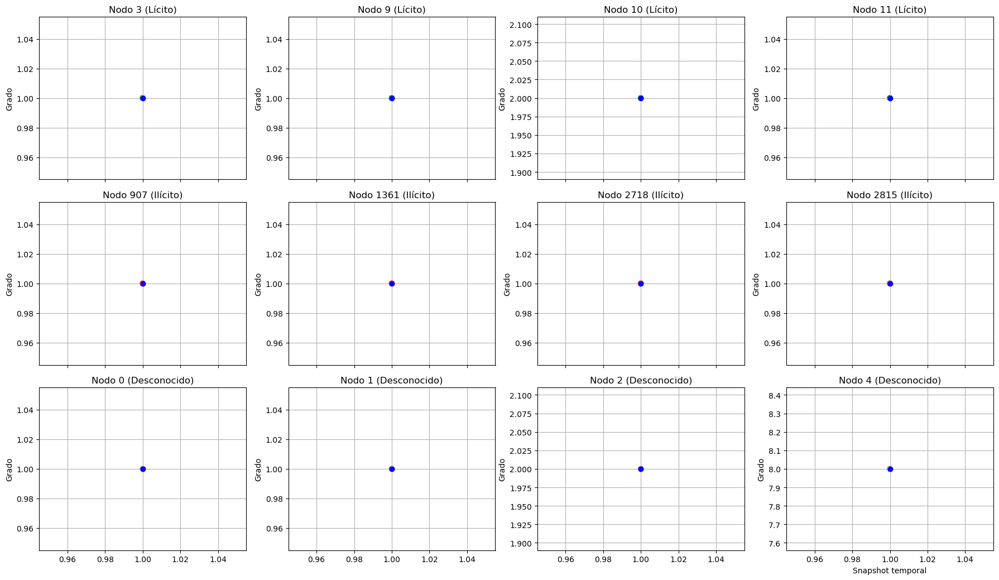

In [ ]:
# === PARÁMETROS ===
MIN_TIEMPOS = 1   # Mínimo de snapshots distintos en los que debe aparecer el nodo
MAX_NODOS = 4      # Cuántos nodos mostrar por clase

# === CLASIFICACIÓN DE NODOS ===
y = data.y
deg = degree(data.edge_index[0], data.num_nodes)

nodos_por_clase = {
    'Lícito': (y == 0).nonzero(as_tuple=True)[0].numpy(),
    'Ilícito': (y == 1).nonzero(as_tuple=True)[0].numpy(),
    'Desconocido': (y == 2).nonzero(as_tuple=True)[0].numpy()
}

# === Apariciones por nodo (cuántos tiempos aparece cada uno) ===
apariciones_por_nodo = defaultdict(set)

for t in sorted(set(node_times)):
    data_t, idx_t = get_subgraph_by_time(t, data, node_times)
    for nid in idx_t.numpy():
        apariciones_por_nodo[int(nid)].add(t)

# === Buscar nodos activos por clase ===
nodos_seleccionados = []

for clase, nodos in nodos_por_clase.items():
    candidatos = []

    for nodo in nodos:
        if len(apariciones_por_nodo[nodo]) >= MIN_TIEMPOS:
            candidatos.append((nodo, len(apariciones_por_nodo[nodo])))

    # Ordenar por cantidad de snapshots en los que aparece
    candidatos.sort(key=lambda x: x[1], reverse=True)

    # Tomar hasta MAX_NODOS
    nodos_clase = [n for n, _ in candidatos[:MAX_NODOS]]
    print(f"{clase}: seleccionados {len(nodos_clase)} nodos con ≥{MIN_TIEMPOS} snapshots")
    nodos_seleccionados.extend(nodos_clase)

# === Graficar evolución temporal ===
evolucion_nodos_optimizada(nodos_seleccionados, dataset, node_times, ncols=4)

## 4. Limpieza y curación de los datos <a name="limpieza"></a>

Ya hemos analizado cuidadosamente el dataset. En lo que sigue, debemos analizar la limpieza y curación de sus valores adecuadamente tal que sean capaces de ofrecer resultados fidedignos en la instancia de aplicar un modelo de clasificación.

Debido a las complejidades del conjunto de datos, existen diversas formas de abordar la limpieza de datos. Sin embargo, en este trabajo empezaremos con una limpieza básica, que usualmente se emplearía a un conjunto de datos estadísticamente independientes.

> Nota: El conjunto de datos con el que estamos trabajando NO es estadísticamente independientes. Además, dependen del tiempo. Esto implica que la limpieza de datos debería ser diferente a la usual. Si bien el grafo no está ponderado, el conjunto de datos incluye pesos que podrían ser utilizados para convertir el grafo en uno ponderado. También se tomó la decisión de quitar nodos aislados, que podrían haber sido tenidos en cuenta en un análisis más profundo ya que podrían haber tenido conexiones en el futuro.

#### 4.1 Creación de un nuevo dataset

Los posibles inconvenientes que debemos controlar y sus potenciales soluciones son:

| Problema detectado   | Posible solución                                                                               |
| -------------------- | ---------------------------------------------------------------------------------------------- |
| `NaN` o `inf` en `x` | Reemplazar con media o cero                                                                    |
| Muchas etiquetas `2` | Usar solo `y ∈ {0,1}` para entrenar                                                            |
| Nodos aislados       | Evaluar si eliminarlos o mantenerlos según el modelo                                           |
| Aristas duplicadas   | Puedes filtrarlas antes de pasar al modelo (aunque no es estrictamente necesario si es un GCN) |

A partir de los resultados observados durante el análisis exploratorio de los datos, como nuestro objetivo es estudiar las transacciones ilícitas, limpiaremos el dataset de la siguiente forma:
* los nodos desconocidos (`Clase = 2`) y,
* aislados (nodos con ***grado 0***).

Para realizar este procedimiento en `PyTorch Geometric`, debemos:
* Identificar los nodos que NO son `clase 2` (Desconocida).
* Calcular el grado de los nodos y excluir los de `grado 0` (aislados).
* Combinar ambos filtros y obtener un nuevo `data` sin esos nodos.

In [ ]:
# 1. Etiquetas y grado de los nodos
y = data.y
edge_index = data.edge_index
deg = degree(edge_index[0], data.num_nodes)

# 2. Máscaras para filtrar nodos
mask_no_desconocidos = (y != 2)           # Clase distinta de 2
mask_no_aislados = (deg > 0)              # Nodos con al menos una conexión
mask_valida = mask_no_desconocidos & mask_no_aislados  # Ambos filtros

# 3. Índices de los nodos válidos
nodos_validos = mask_valida.nonzero(as_tuple=True)[0]

# 4. Crear un nuevo subgrafo con esos nodos
from torch_geometric.utils import subgraph

# Aplicar subgraph para filtrar nodos y aristas
edge_index_clean, _, node_mask = subgraph(
    nodos_validos,
    edge_index,
    relabel_nodes=True,
    return_edge_mask=True
)

# 5. Construir nuevo objeto data limpio
data_clean = Data(
    x = data.x[nodos_validos],
    edge_index = edge_index_clean,
    y = data.y[nodos_validos]
)

# Verificación
print(f"Nodos originales: {data.num_nodes}")
print(f"Nodos después de limpieza: {data_clean.num_nodes}")
print(f"Aristas después de limpieza: {data_clean.num_edges}")

Nodos originales: 203769
Nodos después de limpieza: 34779
Aristas después de limpieza: 23610


Como resultado, `data_clean` contiene solamente los nodos:
* Que tienen etiquetas conocidas (0 o 1)
* Que están conectados (no aislados)

> Las aristas fueron relabeladas automáticamente para ajustarse a los nuevos índices.

En lo que sigue, visualizaremos un subgrafo limpio sin nodos desconocidos, ni aislados:

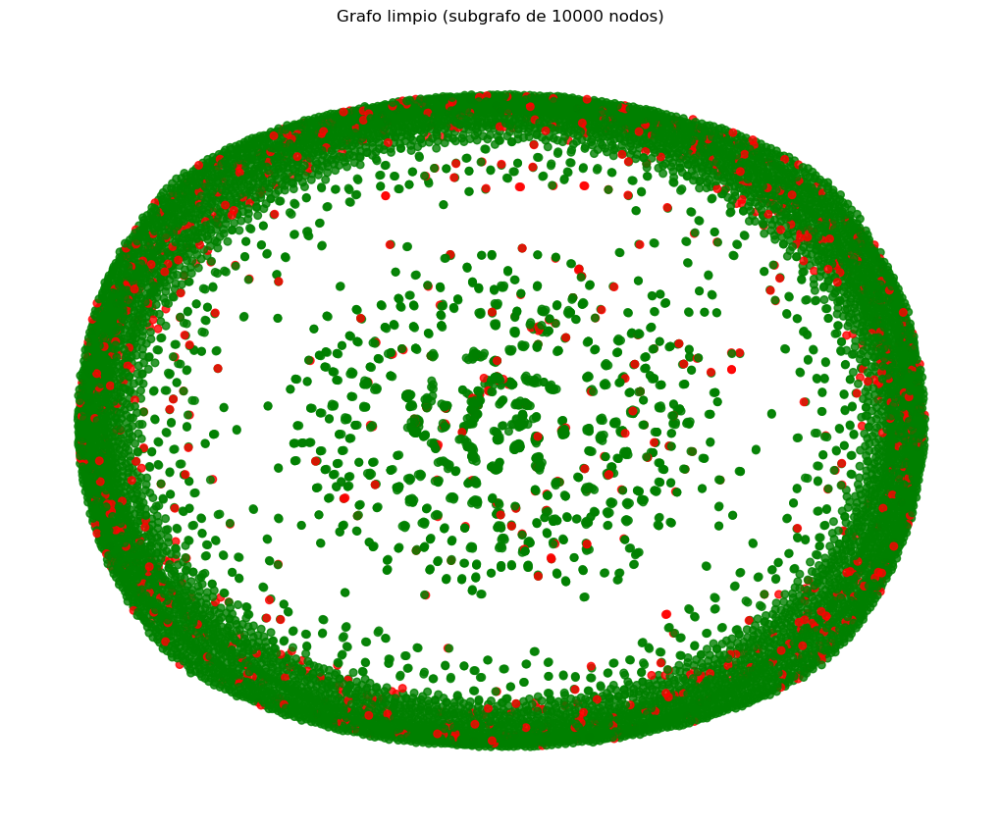

In [ ]:
# Número de nodos a visualizar
num_nodos = 10000  # ajustá este número según lo que soporte tu máquina

# Convertir a grafo de NetworkX (si aún no se hizo)
G_clean = to_networkx(data_clean, to_undirected=True)

# Lista total de nodos
nodos_totales = list(G_clean.nodes)

# Seleccionar muestra aleatoria
nodos_muestra = random.sample(nodos_totales, num_nodos)

# Crear subgrafo
subG = G_clean.subgraph(nodos_muestra)

# Colores por clase para los nodos seleccionados
color_map = {0: 'green', 1: 'red'}
y_clean = data_clean.y.numpy()
node_colors = [color_map[y_clean[n]] for n in nodos_muestra]

# Dibujar el subgrafo
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(subG, seed=42)  # Fijamos la semilla para consistencia
nx.draw(
    subG,
    pos=pos,
    node_color=node_colors,
    node_size=30,
    edge_color='lightgray',
    with_labels=False,
    alpha=0.8
)
plt.title(f"Grafo limpio (subgrafo de {num_nodos} nodos)")
plt.show()

Luego, guardaremos el grafo limpio (`data_clean`) como un archivo `.csv`, donde:
* En un archivo `nodos_clean.csv` se guardan los nodos con la información:
    * ID del nodo,
    * Clase (lícita, ilícita)
    * Grado
    * Todas las features (los 166 atributos de `data.x`)
* Y en otro archivo `aristas_clean.csv` se guardan las aristas con la lista de pares `(source, target)`.

In [ ]:
# === Preparar nodos ===
# ID del nodo
nodo_ids = torch.arange(data_clean.num_nodes)

# Clases (0 o 1)
clases = data_clean.y.numpy()

# Grado de cada nodo (basado en edge_index)
grados = degree(data_clean.edge_index[0], data_clean.num_nodes).numpy()

# Features (tensor a numpy)
features = data_clean.x.numpy()

# Crear DataFrame
df_nodos = pd.DataFrame(features)
df_nodos.insert(0, 'grado', grados)
df_nodos.insert(0, 'clase', clases)
df_nodos.insert(0, 'nodo_id', nodo_ids.numpy())

# Mapear clase numérica a texto
df_nodos['clase'] = df_nodos['clase'].map({0: 'lícita', 1: 'ilícita'})

# Guardar como CSV
df_nodos.to_csv('nodos_clean.csv', index=False)
print("Archivo 'nodos_clean.csv' guardado con éxito.")

# === Preparar aristas ===
edge_index = data_clean.edge_index.numpy()
df_aristas = pd.DataFrame({
    'source': edge_index[0],
    'target': edge_index[1]
})
df_aristas.to_csv('aristas_clean.csv', index=False)
print("Archivo 'aristas_clean.csv' guardado con éxito.")

Archivo 'nodos_clean.csv' guardado con éxito.
Archivo 'aristas_clean.csv' guardado con éxito.


## 5. Modelos de Clasificación <a name="clasificacion"></a>

Hemos analizado y explorado la estructura y comportamiento del dataset `EllipticBitcoinDataset`. Lo que nos resta es implementar diferentes modelos de clasificación, para los cuales deberemos entrenar, validar y poder predecir la detección de fraude en las transacciones entre Bitcoins. El objetivo es analizar y comparar la capacidad de predecir los diferentes modelos utilizando diferentes métricas:

* ***Accuracy***: Mide la proporción de predicciones correctas (tanto positivas como negativas) sobre el total de predicciones. Es útil cuando se busca una visión general del rendimiento del modelo, especialmente en conjuntos de datos balanceados.
* ***Precision***: Mide la exactitud de las predicciones positivas. Indica qué tan probable es que una predicción positiva del modelo sea correcta. Es importante cuando se quiere evitar falsos positivos, por ejemplo, en la detección de ilícitos.
* ***Recall (Sensibilidad o Tasa de Verdaderos Positivos)***: Mide la capacidad del modelo para identificar todos los casos positivos relevantes. Indica qué tan probable es que el modelo encuentre todos los casos positivos reales.Es crucial cuando se quiere minimizar los falsos negativos, donde no capturar un caso positivo real puede tener graves consecuencias.
* ***F1-score***: Media armónica de precisión y recall.

Los modelos que hemos propuesto para implementar son:

1. ***Regresión Logística,***
2. ***Random Forest,***
3. ***Support-Vector Machines (SVM),***
4. ***Árboles de Decisión,***
5. ***Multilayer Perceptron (red Neuronal MLP),***
6. ***Graph Convolutional Network (GCN).***
7. ***Graph Attention Network (GAT)***
8. ***eXtreme Gradient Boosting (XGBoost)***

En lo que sigue del conjunto completo del `dataset` debemos limpiarlo. Tal como discutió anteriormente:
* solo utilizaremos los nodos con clases conocidas (lícitas e ilícitas) y
* eliminaremos los nodos aislados.

Además, a cada modelo podemos analizarlo utilizando diferentes particiones:
* El método ***K-Fold*** nos ofrece dispersión estadística de las métricas. Sin embargo, las comparaciones del conjunto de entrenamiento y validación pueden variar. Esto que debe a que cada modelo utiliza diferentes librerías.
* Utilizar una única partición de los datos de entrenamiento y validación. El inconveniente de esta técnica reside en la falta de dispersión estadística de las métricas. La ventaja se encuentra en la comparación de los modelos bajo un mismo conjunto de entrenamiento y validación.
* Otra técnica de importancia radica en la optimización de los hiperparámetros de cada modelo.

> Nota: El objetivo principal radica en realizar pruebas de concepto, por lo que debemos utilizar técnicas elementales.

Comenzaremos introduciendo los diferentes modelos y aplicando solo las particiones determinadas por ***K-Fold***. En lo que sigue, escalaremos las `features` para un mejor procesamiento de los valores. Finalmente, al dataset resultante, lo dividiremos en datos de entrenamiento y validación utilizando ***K-Fold*** para entrenamiento y validación.

Por último, se observó que para cada tiempo solo se manifiesta en un solo usuario con su respectivo `id`. Por lo que no podemos utilizar todo el conjunto de datos del `dataset` en el entrenamiento de los modelos, sin la necesidad de dividirlo para cada uno de los diferentes snapshots.

In [ ]:
# === 0. Filtrar nodos: solo con etiqueta conocida (0 o 1) y que NO sean aislados ===
deg = degree(data.edge_index[0], data.num_nodes)
mask_known = ((data.y == 0) | (data.y == 1)) & (deg > 0)

# Genero el conjunto de datos a ajustar
X = data.x[mask_known].numpy()
y = data.y[mask_known].numpy()

# === 1. Separar conjunto de prueba final (20%) ===
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y)

# === 2. Escalar características ===
scaler = StandardScaler()
X_temp_scaled = scaler.fit_transform(X_temp)
X_test_scaled = scaler.transform(X_test)  # mismo escalado para test

#### 5.1. Regresión logística

Aplicaremos regresión logística al dataset limpio, calculándole las diferentes métricas. Primero calcularemos el entrenamiento y validación cruzada mediante ***K-Fold***:

In [ ]:
# === 3. Validación cruzada con KFold ===
k = 5
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
# Resultado: 80% train, 20% val para cada fold

# Guardar métricas
precisiones, recalls, f1_scores, accuracies = [], [], [], []

# Imprimo la inicializacion de las validaciones cruzadas
print(f"\n  Validación cruzada (K={k}) sobre {100.0/k}% de los datos:")

# Calculo las validaciones cruzadas
for fold, (train_idx, val_idx) in enumerate(skf.split(X_temp_scaled, y_temp), 1):
    print(f"\n📁 Fold {fold}/{k}")

    # Variables de entrenamiento
    X_train, X_val = X_temp_scaled[train_idx], X_temp_scaled[val_idx]
    y_train, y_val = y_temp[train_idx], y_temp[val_idx]

    # Entrenamiento
    model = LogisticRegression(max_iter=1000)
    model.fit(X_train, y_train)

    # Prediccion del modelo
    y_val_pred = model.predict(X_val)

    # Guardar métricas
    precisiones.append(precision_score(y_val, y_val_pred))
    recalls.append(recall_score(y_val, y_val_pred))
    f1_scores.append(f1_score(y_val, y_val_pred))
    accuracies.append(accuracy_score(y_val, y_val_pred))

    # Reporte completo
    print(classification_report(y_val, y_val_pred, target_names=["Lícito", "Ilícito"]))

# === 4. Resumen de métricas promedio en validación cruzada ===
print("\n  Promedios en validación cruzada (K-Fold):")
print(f"Accuracy:  {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
print(f"Precision: {np.mean(precisiones):.4f} ± {np.std(precisiones):.4f}")
print(f"Recall:    {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")
print(f"F1-score:  {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")


  Validación cruzada (K=5) sobre 20.0% de los datos:

📁 Fold 1/5
              precision    recall  f1-score   support

      Lícito       0.97      0.99      0.98      5075
     Ilícito       0.81      0.63      0.71       490

    accuracy                           0.95      5565
   macro avg       0.89      0.81      0.84      5565
weighted avg       0.95      0.95      0.95      5565


📁 Fold 2/5
              precision    recall  f1-score   support

      Lícito       0.97      0.99      0.98      5074
     Ilícito       0.85      0.66      0.75       491

    accuracy                           0.96      5565
   macro avg       0.91      0.83      0.86      5565
weighted avg       0.96      0.96      0.96      5565


📁 Fold 3/5
              precision    recall  f1-score   support

      Lícito       0.97      0.99      0.98      5074
     Ilícito       0.83      0.70      0.76       491

    accuracy                           0.96      5565
   macro avg       0.90      0.84     

Para una mejor interpretación de los valores de las métricas, procederemos a graficarlos de diferentes formas:
* Boxplot,
* Barplot.

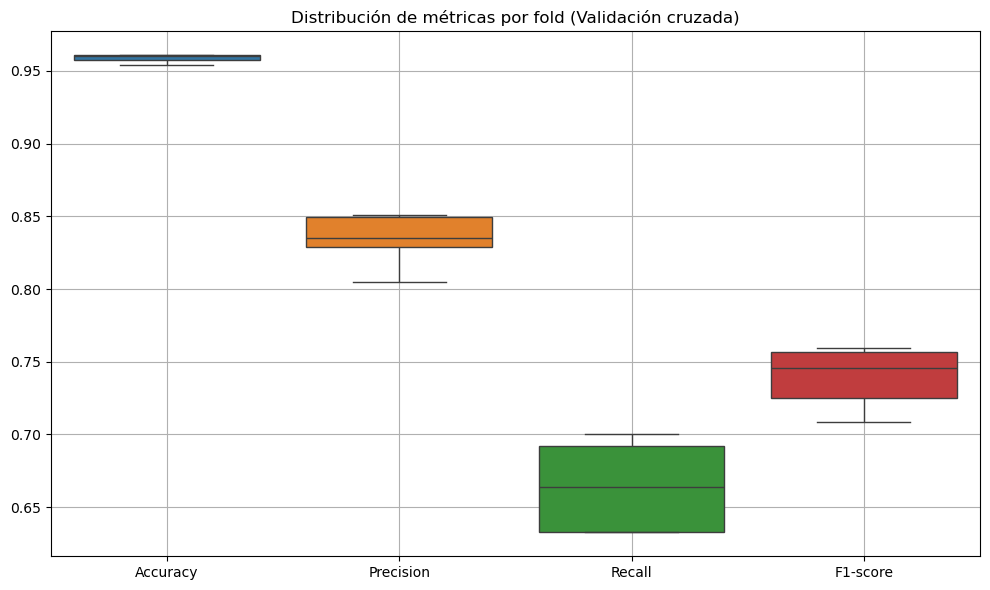

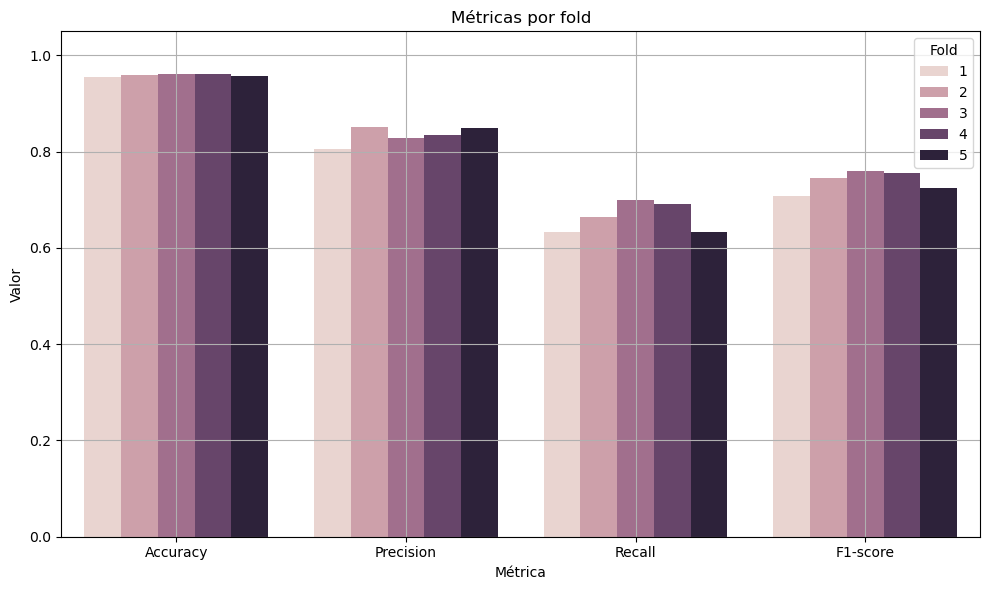

In [ ]:
# === Graficar distribución de métricas por fold ===

# Crear DataFrame de métricas por fold
df_metrics = pd.DataFrame({
    'Fold': list(range(1, k + 1)),
    'Accuracy': accuracies,
    'Precision': precisiones,
    'Recall': recalls,
    'F1-score': f1_scores
})

# Boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_metrics.drop(columns='Fold'))
plt.title("Distribución de métricas por fold (Validación cruzada)")
plt.grid(True)
plt.tight_layout()
plt.show()

# Barplot con valores individuales
df_metrics_melted = df_metrics.melt(id_vars="Fold", var_name="Métrica", value_name="Valor")
plt.figure(figsize=(10, 6))
sns.barplot(data=df_metrics_melted, x="Métrica", y="Valor", hue="Fold")
plt.title("Métricas por fold")
plt.ylim(0, 1.05)
plt.grid(True)
plt.tight_layout()
plt.show()

Por último, veamos la ***matriz de confusión***:

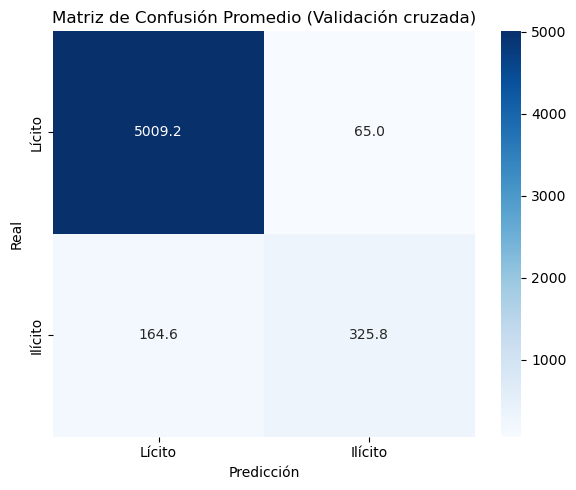

In [ ]:
# === Calcular matriz de confusión promedio ===
conf_matrices = []

# Repetimos validación cruzada solo para obtener las matrices
for train_idx, val_idx in skf.split(X_temp_scaled, y_temp):

    # Variables de entrenamiento y validación
    X_train, X_val = X_temp_scaled[train_idx], X_temp_scaled[val_idx]
    y_train, y_val = y_temp[train_idx], y_temp[val_idx]

    # Modelo de Regressión Logística
    model = LogisticRegression(max_iter=1000)
    model.fit(X_train, y_train)

    # Prediccion
    y_val_pred = model.predict(X_val)

    # Matriz de confusión
    conf = confusion_matrix(y_val, y_val_pred)
    conf_matrices.append(conf)

# Promediar matrices
conf_avg = np.mean(conf_matrices, axis=0)

# Mostrar matriz de confusión promedio
plt.figure(figsize=(6, 5))
sns.heatmap(conf_avg, annot=True, fmt=".1f", cmap="Blues",
            xticklabels=["Lícito", "Ilícito"], yticklabels=["Lícito", "Ilícito"])
plt.title("Matriz de Confusión Promedio (Validación cruzada)")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.tight_layout()
plt.show()

Para poder comparar estos valores con los de otros modelos, guardamos los valores de las métricas en listas de la regresión logística:

In [ ]:
# Listas con los valores de las métricas de la regresión logística
acc_log = df_metrics["Accuracy"].tolist()
prec_log = df_metrics["Precision"].tolist()
rec_log = df_metrics["Recall"].tolist()
f1_log = df_metrics["F1-score"].tolist()

#### 5.2. Random Forest

En lo que sigue, aplicaremos `RandomForestClassifier` al dataset limpio. Al igual que en el caso anterior, le calcularemos las diferentes métricas. Veamos para K-fold:

In [ ]:
# === 3. K-Fold cross-validation ===
k = 5
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
# Resultado: 80% train, 20% val para cada fold

# Guardar métricas
precisiones, recalls, f1_scores, accuracies = [], [], [], []

# Guardo la matriz de confusión
conf_matrices = []

# Imprimo la inicializacion de las validaciones cruzadas
print(f"\n Validación cruzada (K={k}) sobre {100.0/k}% de los datos con Random Forest:")

# Calculo las validaciones cruzadas
for fold, (train_idx, val_idx) in enumerate(skf.split(X_temp_scaled, y_temp), 1):
    print(f"\n📁 Fold {fold}/{k}")

    # Variables de entrenamiento
    X_train, X_val = X_temp_scaled[train_idx], X_temp_scaled[val_idx]
    y_train, y_val = y_temp[train_idx], y_temp[val_idx]

    # Modelo Random Forest
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    # Prediccion del modelo
    y_val_pred = model.predict(X_val)

    # Guardar métricas
    precisiones.append(precision_score(y_val, y_val_pred))
    recalls.append(recall_score(y_val, y_val_pred))
    f1_scores.append(f1_score(y_val, y_val_pred))
    accuracies.append(accuracy_score(y_val, y_val_pred))

    # Matriz de confusión
    conf_matrices.append(confusion_matrix(y_val, y_val_pred))

    # Reporte completo
    print(classification_report(y_val, y_val_pred, target_names=["Lícito", "Ilícito"]))

# === 4. Métricas promedio de validación cruzada ===
print("\n  Promedios en validación cruzada:")
print(f"Accuracy:  {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
print(f"Precision: {np.mean(precisiones):.4f} ± {np.std(precisiones):.4f}")
print(f"Recall:    {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")
print(f"F1-score:  {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")


 Validación cruzada (K=5) sobre 20.0% de los datos con Random Forest:

📁 Fold 1/5
              precision    recall  f1-score   support

      Lícito       0.98      1.00      0.99      5075
     Ilícito       0.99      0.80      0.89       490

    accuracy                           0.98      5565
   macro avg       0.99      0.90      0.94      5565
weighted avg       0.98      0.98      0.98      5565


📁 Fold 2/5
              precision    recall  f1-score   support

      Lícito       0.99      1.00      0.99      5074
     Ilícito       1.00      0.87      0.93       491

    accuracy                           0.99      5565
   macro avg       0.99      0.93      0.96      5565
weighted avg       0.99      0.99      0.99      5565


📁 Fold 3/5
              precision    recall  f1-score   support

      Lícito       0.99      1.00      0.99      5074
     Ilícito       1.00      0.85      0.92       491

    accuracy                           0.99      5565
   macro avg       0.

Nuevamente, también interpretaremos los valores de las métricas graficándolas de las formas:
* Boxplot,
* Barplot.

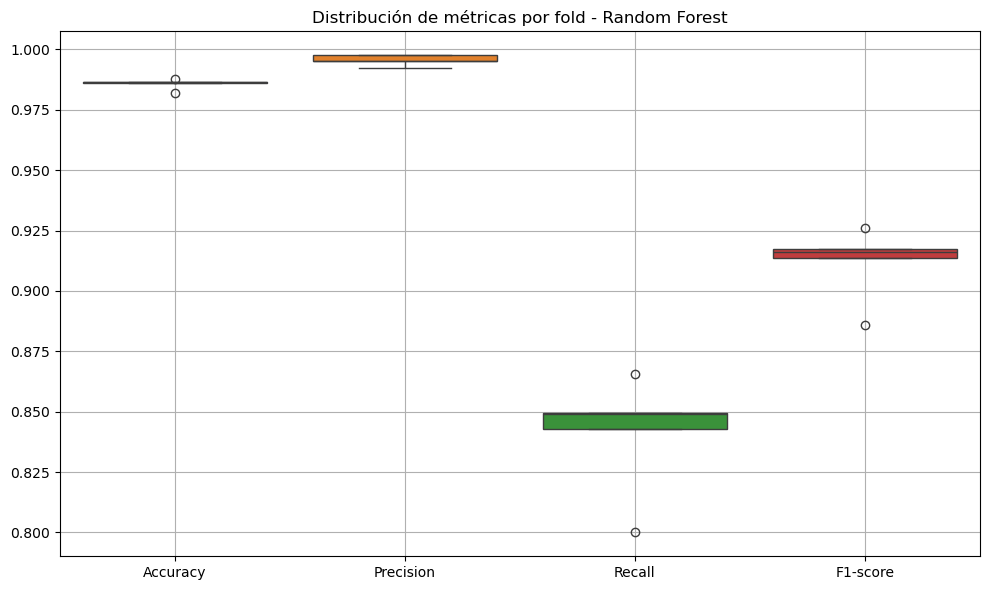

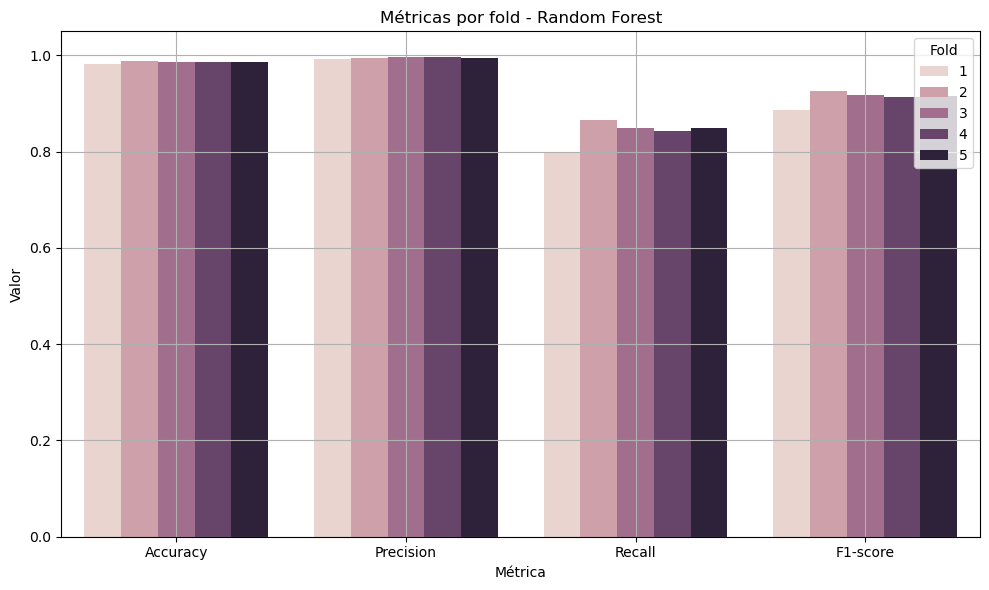

In [ ]:
# === 5. Visualización: boxplot/barplot de métricas ===
df_metrics = pd.DataFrame({
    'Fold': list(range(1, k + 1)),
    'Accuracy': accuracies,
    'Precision': precisiones,
    'Recall': recalls,
    'F1-score': f1_scores
})

# Boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_metrics.drop(columns='Fold'))
plt.title("Distribución de métricas por fold - Random Forest")
plt.grid(True)
plt.tight_layout()
plt.show()

# Barplot
df_melted = df_metrics.melt(id_vars="Fold", var_name="Métrica", value_name="Valor")
plt.figure(figsize=(10, 6))
sns.barplot(data=df_melted, x="Métrica", y="Valor", hue="Fold")
plt.title("Métricas por fold - Random Forest")
plt.ylim(0, 1.05)
plt.grid(True)
plt.tight_layout()
plt.show()

Por último, ilustraremos la ***matriz de confusión***:

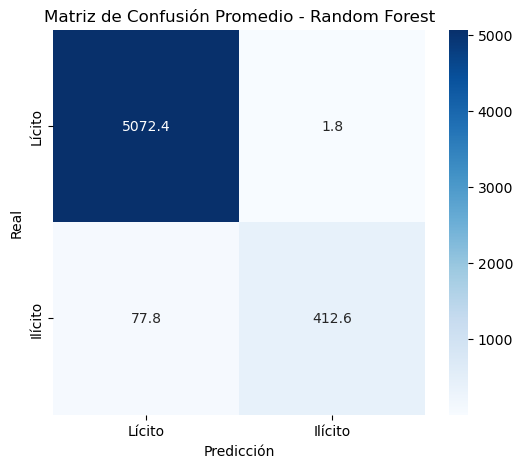

In [ ]:
# === 6. Matriz de confusión promedio ===
conf_avg = np.mean(conf_matrices, axis=0)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_avg, annot=True, fmt=".1f", cmap="Blues",
            xticklabels=["Lícito", "Ilícito"], yticklabels=["Lícito", "Ilícito"])
plt.title("Matriz de Confusión Promedio - Random Forest")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.show()

Guardamos las métricas para una posterior comparación:

In [ ]:
# Listas con los valores de las métricas de random forest
acc_rf = df_metrics["Accuracy"].tolist()
prec_rf = df_metrics["Precision"].tolist()
rec_rf = df_metrics["Recall"].tolist()
f1_rf = df_metrics["F1-score"].tolist()

#### 5.3 Support-Vector Machines (SVM)

El próximo modelo a implementar es el Support-Vector Machines (SVM), para el cual utilizaremos el método `SVC` de la librería `sklearn.svm`. esta función presenta dos `kernel`diferentes que podemos utilizar:
* `SVC(kernel='rbf')` (bueno para separación no lineal),
* `SVC(kernel='linear')` (más simple y rápido).

Para elegir el núcleo con el que trabajaremos, veamos primero la siguiente tabla comparativa detallada con las diferencias de cada uno de los núcleos:

| Característica           | `linear`                          | `rbf` (Radial Basis Function)           |
| ------------------------ | --------------------------------- | --------------------------------------- |
| Tipo de frontera         | Lineal                            | No lineal (curvas, complejas)           |
| Tiempo de entrenamiento  | Rápido                            | Más lento (kernel más complejo)         |
| Dimensionalidad          | Bueno para alta dimensión         | También funciona, pero más costoso      |
| Interpretabilidad        | Alta (coeficientes lineales)      | Baja (no interpretables fácilmente)     |
| Flexibilidad             | Limitada (líneas rectas)          | Alta (se ajusta a formas no lineales)   |
| Regularización (`C`)     | Simple de ajustar                 | A menudo requiere ajustar `C` y `gamma` |
| Tendencia al overfitting | Menor (si los datos son lineales) | Mayor si no se ajusta correctamente     |

Para nuestro caso (Elliptic Bitcoin Dataset) tenemos que:
* Los datos tienen múltiples `features` (~166).
* No sabemos a priori si la separación entre *lícito* e *ilícito* es lineal.

Por eso, utilizaremos `rbf` que es más flexible para nuestro problema, es decir, implementaremos `SVC(kernel='rbf')` como primera opción. A continuación, siguiendo el mismo esquema que usamos para regresión logística y Random Forest, calcularemos `SVM` usando validación cruzada de ***K-Fold***:

In [ ]:
# === 3. K-Fold cross-validation ===
k = 5
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
# Resultado: 80% train, 20% val para cada fold

# Guardar métricas
precisiones, recalls, f1_scores, accuracies = [], [], [], []

# Guardo la matriz de confusión
conf_matrices = []

# Imprimo la inicializacion de las validaciones cruzadas
print(f"\n  Validación cruzada (K={k}) sobre {100.0/k}% de los datos con SVM (RBF kernel):")

# Calculo las validaciones cruzadas
for fold, (train_idx, val_idx) in enumerate(skf.split(X_temp_scaled, y_temp), 1):
    print(f"\n📁 Fold {fold}/{k}")

    # Variables de entrenamiento
    X_train, X_val = X_temp_scaled[train_idx], X_temp_scaled[val_idx]
    y_train, y_val = y_temp[train_idx], y_temp[val_idx]

    # Modelo SVM con kernel RBF
    model = SVC(kernel='rbf', C=1.0, gamma='scale')  # podés ajustar C y gamma
    model.fit(X_train, y_train)

    # Prediccion del modelo
    y_val_pred = model.predict(X_val)

    # Guardar métricas
    precisiones.append(precision_score(y_val, y_val_pred))
    recalls.append(recall_score(y_val, y_val_pred))
    f1_scores.append(f1_score(y_val, y_val_pred))
    accuracies.append(accuracy_score(y_val, y_val_pred))

    # Matriz de confusión
    conf_matrices.append(confusion_matrix(y_val, y_val_pred))

    # Reporte completo
    print(classification_report(y_val, y_val_pred, target_names=["Lícito", "Ilícito"]))

# === 4. Métricas promedio de validación cruzada ===
print("\n  Promedios en validación cruzada - SVM (RBF):")
print(f"Accuracy:  {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
print(f"Precision: {np.mean(precisiones):.4f} ± {np.std(precisiones):.4f}")
print(f"Recall:    {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")
print(f"F1-score:  {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")


  Validación cruzada (K=5) sobre 20.0% de los datos con SVM (RBF kernel):

📁 Fold 1/5
              precision    recall  f1-score   support

      Lícito       0.97      1.00      0.98      5075
     Ilícito       0.94      0.69      0.79       490

    accuracy                           0.97      5565
   macro avg       0.95      0.84      0.89      5565
weighted avg       0.97      0.97      0.97      5565


📁 Fold 2/5
              precision    recall  f1-score   support

      Lícito       0.98      1.00      0.99      5074
     Ilícito       0.96      0.74      0.83       491

    accuracy                           0.97      5565
   macro avg       0.97      0.87      0.91      5565
weighted avg       0.97      0.97      0.97      5565


📁 Fold 3/5
              precision    recall  f1-score   support

      Lícito       0.98      1.00      0.99      5074
     Ilícito       0.94      0.75      0.84       491

    accuracy                           0.97      5565
   macro avg     

Luego, interpretaremos los valores de las métricas graficándolas de las formas:
* Boxplot,
* Barplot.

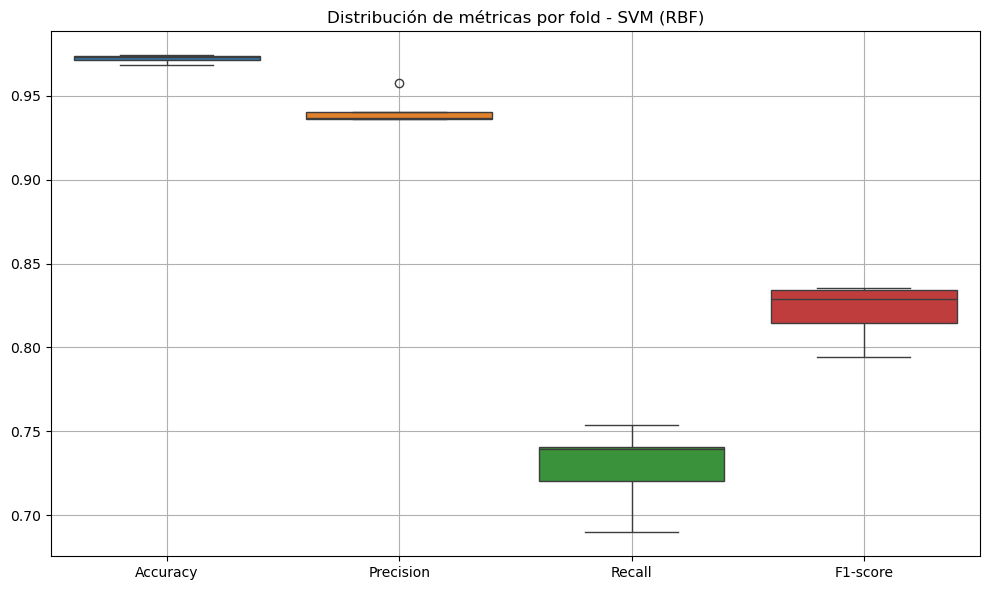

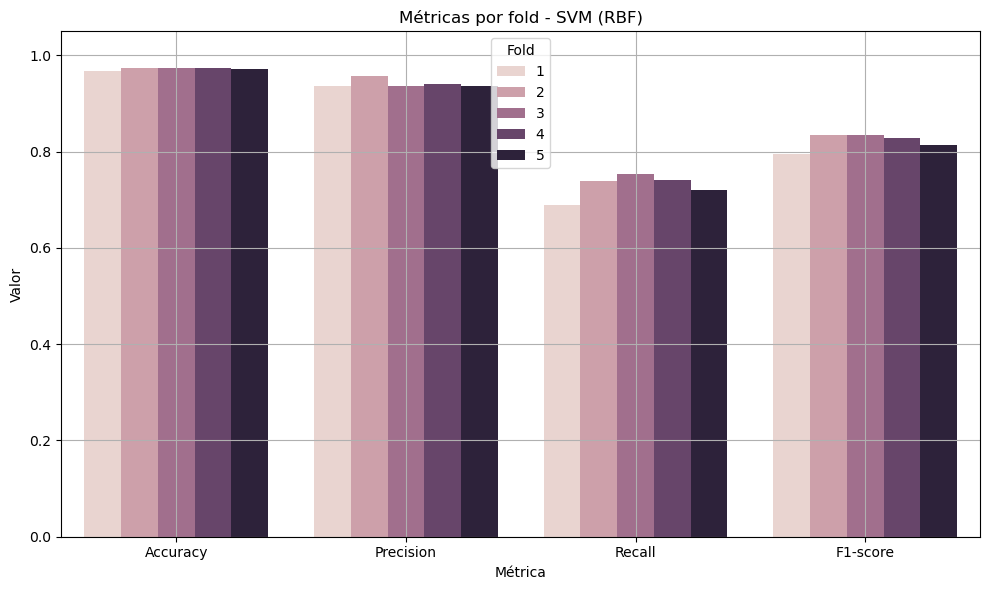

In [ ]:
# === 5. Visualización de métricas ===
df_metrics = pd.DataFrame({
    'Fold': list(range(1, k + 1)),
    'Accuracy': accuracies,
    'Precision': precisiones,
    'Recall': recalls,
    'F1-score': f1_scores
})

# Boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_metrics.drop(columns='Fold'))
plt.title("Distribución de métricas por fold - SVM (RBF)")
plt.grid(True)
plt.tight_layout()
plt.show()

# Barplot
df_melted = df_metrics.melt(id_vars="Fold", var_name="Métrica", value_name="Valor")
plt.figure(figsize=(10, 6))
sns.barplot(data=df_melted, x="Métrica", y="Valor", hue="Fold")
plt.title("Métricas por fold - SVM (RBF)")
plt.ylim(0, 1.05)
plt.grid(True)
plt.tight_layout()
plt.show()

Por último, analicemos la ***matriz de confusión***:

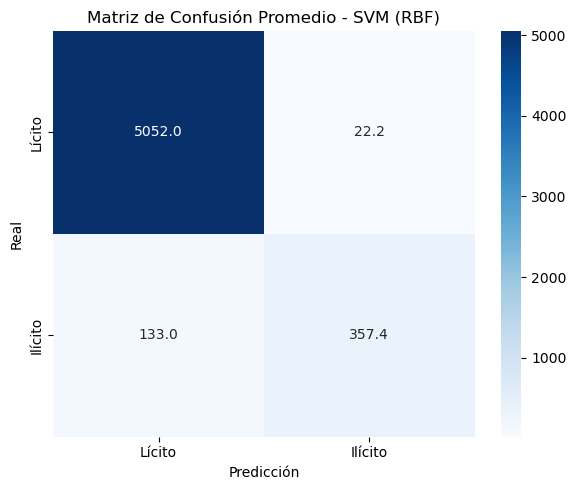

In [ ]:
# === 6. Matriz de confusión promedio ===
conf_avg = np.mean(conf_matrices, axis=0)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_avg, annot=True, fmt=".1f", cmap="Blues",
            xticklabels=["Lícito", "Ilícito"], yticklabels=["Lícito", "Ilícito"])
plt.title("Matriz de Confusión Promedio - SVM (RBF)")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.tight_layout()
plt.show()

Guardamos las métricas:

In [ ]:
# Listas con los valores de las métricas de SVM
acc_svm = df_metrics["Accuracy"].tolist()
prec_svm = df_metrics["Precision"].tolist()
rec_svm = df_metrics["Recall"].tolist()
f1_svm = df_metrics["F1-score"].tolist()

#### 5.4. Árbol de Decisión

A continuación, aplicaremos el modelo de clasificación de árbol de decisión (`DecisionTreeClassifier`), siguiendo exactamente el mismo esquema que para regresión logística, Random Forest y SVM. Entonces, procederemos con ***K-Fold***:

In [ ]:
# === 3. K-Fold cross-validation ===
k = 5
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
# Resultado: 80% train, 20% val para cada fold

# Guardar métricas
precisiones, recalls, f1_scores, accuracies = [], [], [], []

# Guardo la matriz de confusión
conf_matrices = []

# Imprimo la inicializacion de las validaciones cruzadas
print(f"\n  Validación cruzada (K={k}) sobre {100.0/k}% de los datos con Árbol de Decisión:")

# Calculo las validaciones cruzadas
for fold, (train_idx, val_idx) in enumerate(skf.split(X_temp_scaled, y_temp), 1):
    print(f"\n📁 Fold {fold}/{k}")

    # Variables de entrenamiento
    X_train, X_val = X_temp_scaled[train_idx], X_temp_scaled[val_idx]
    y_train, y_val = y_temp[train_idx], y_temp[val_idx]

    # Modelo de árbol de decisión
    model = DecisionTreeClassifier(random_state=42)
    model.fit(X_train, y_train)

    # Prediccion del modelo
    y_val_pred = model.predict(X_val)

    # Guardar métricas
    precisiones.append(precision_score(y_val, y_val_pred))
    recalls.append(recall_score(y_val, y_val_pred))
    f1_scores.append(f1_score(y_val, y_val_pred))
    accuracies.append(accuracy_score(y_val, y_val_pred))

    # Guardar matriz de confusión
    conf_matrices.append(confusion_matrix(y_val, y_val_pred))

    # Reporte completo
    print(classification_report(y_val, y_val_pred, target_names=["Lícito", "Ilícito"]))

# === 4. Métricas promedio de validación cruzada ===
print("\n  Promedios en validación cruzada - Árbol de Decisión:")
print(f"Accuracy:  {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
print(f"Precision: {np.mean(precisiones):.4f} ± {np.std(precisiones):.4f}")
print(f"Recall:    {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")
print(f"F1-score:  {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")


  Validación cruzada (K=5) sobre 20.0% de los datos con Árbol de Decisión:

📁 Fold 1/5
              precision    recall  f1-score   support

      Lícito       0.99      0.99      0.99      5075
     Ilícito       0.87      0.85      0.86       490

    accuracy                           0.98      5565
   macro avg       0.93      0.92      0.92      5565
weighted avg       0.97      0.98      0.98      5565


📁 Fold 2/5
              precision    recall  f1-score   support

      Lícito       0.99      0.99      0.99      5074
     Ilícito       0.86      0.89      0.88       491

    accuracy                           0.98      5565
   macro avg       0.93      0.94      0.93      5565
weighted avg       0.98      0.98      0.98      5565


📁 Fold 3/5
              precision    recall  f1-score   support

      Lícito       0.99      0.99      0.99      5074
     Ilícito       0.85      0.88      0.87       491

    accuracy                           0.98      5565
   macro avg    

A continuación, realizaremos las gráficas:
* Boxplot,
* Barplot.

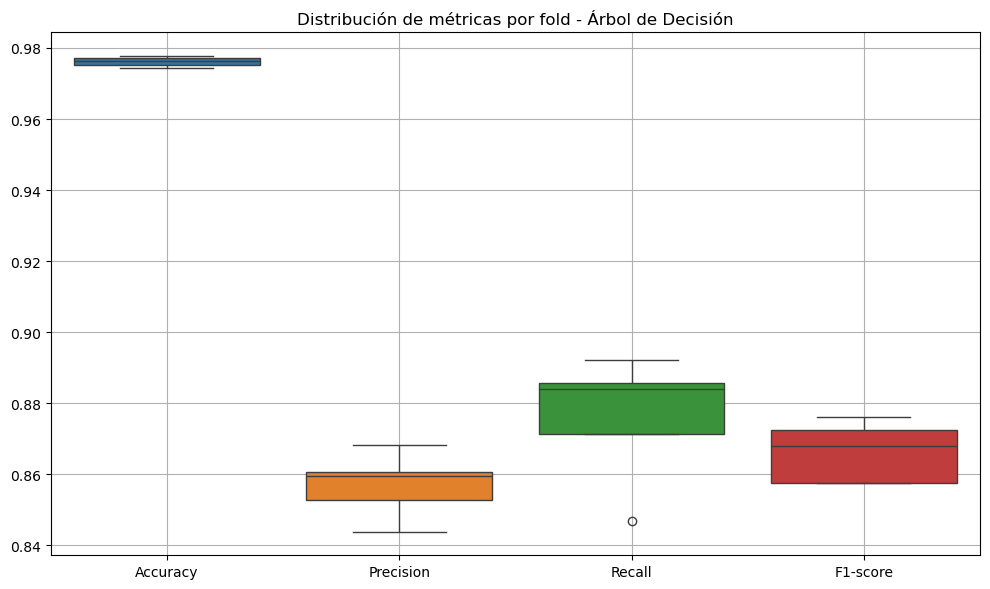

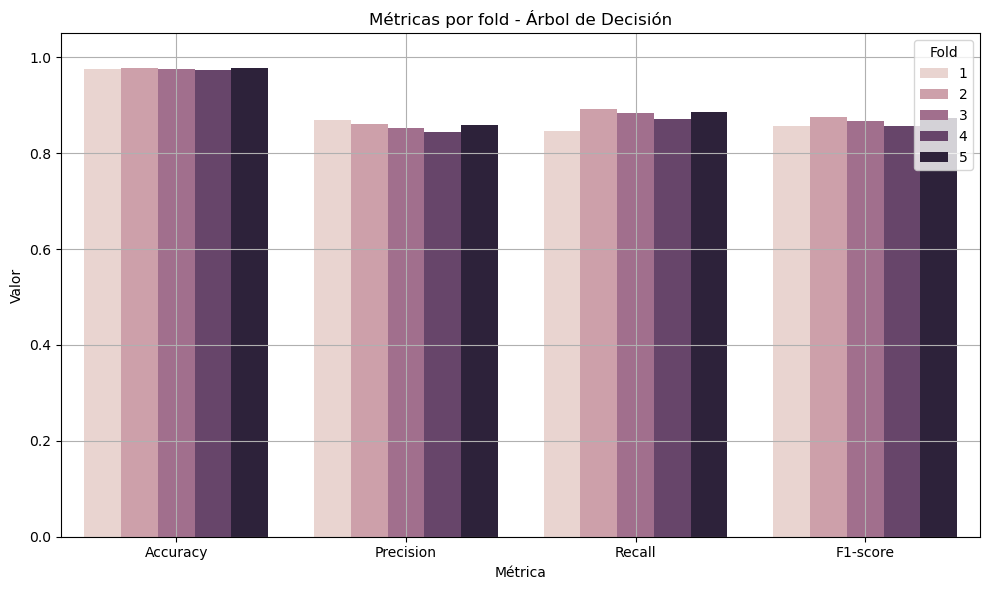

In [ ]:
# === 5. Visualización de métricas ===
df_metrics = pd.DataFrame({
    'Fold': list(range(1, k + 1)),
    'Accuracy': accuracies,
    'Precision': precisiones,
    'Recall': recalls,
    'F1-score': f1_scores
})

# Boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_metrics.drop(columns='Fold'))
plt.title("Distribución de métricas por fold - Árbol de Decisión")
plt.grid(True)
plt.tight_layout()
plt.show()

# Barplot
df_melted = df_metrics.melt(id_vars="Fold", var_name="Métrica", value_name="Valor")
plt.figure(figsize=(10, 6))
sns.barplot(data=df_melted, x="Métrica", y="Valor", hue="Fold")
plt.title("Métricas por fold - Árbol de Decisión")
plt.ylim(0, 1.05)
plt.grid(True)
plt.tight_layout()
plt.show()

Como último análisis, graficaremos la ***matriz de confusión***:

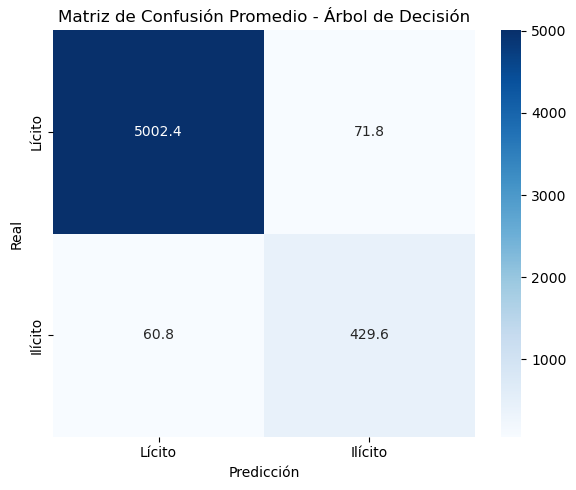

In [ ]:
# === 6. Matriz de confusión promedio ===
conf_avg = np.mean(conf_matrices, axis=0)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_avg, annot=True, fmt=".1f", cmap="Blues",
            xticklabels=["Lícito", "Ilícito"], yticklabels=["Lícito", "Ilícito"])
plt.title("Matriz de Confusión Promedio - Árbol de Decisión")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.tight_layout()
plt.show()

Nuevamente, almacenaremos los valores de las métricas en diferentes listas asociadas al árbol de dicisión:

In [ ]:
# Listas con los valores de las métricas mediante el modelo Arbol de Desicion
acc_dt = df_metrics["Accuracy"].tolist()
prec_dt = df_metrics["Precision"].tolist()
rec_dt = df_metrics["Recall"].tolist()
f1_dt = df_metrics["F1-score"].tolist()

#### 5.5. Red Neuronal MPL (Multilayer Perceptron)

En lo que sigue, aplicaremos la ***red neuronal MLP*** mediante el método `MLPClassifier` de la librería `scikit-learn`, siguiendo exactamente el mismo flujo que con los modelos anteriores. Sin embargo, en este caso debemos fijar previamente algunas variables del modelo, tomando los siguientes valores:
* `hidden_layer_sizes=(100,)`: una capa oculta con 100 neuronas,
* `activation='relu'`: función de activación moderna y efectiva,
* `solver='adam'`: optimizador robusto,
* `max_iter=300`: más iteraciones por si tarda en converger,
* `early_stopping=True`: corta si no mejora.

En lo que sigue, empecemos aplicando el método ***K-Fold***:

In [ ]:
# === 3. K-Fold cross-validation ===
k = 5
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
# Resultado: 80% train, 20% val para cada fold

# Guardar métricas
precisiones, recalls, f1_scores, accuracies = [], [], [], []

# Guardo la matriz de confusión
conf_matrices = []

# Imprimo la inicializacion de las validaciones cruzadas
print(f"\n  Validación cruzada (K={k}) sobre {100.0/k}% de los datos con MLP (Red Neuronal):")

# Calculo las validaciones cruzadas
for fold, (train_idx, val_idx) in enumerate(skf.split(X_temp_scaled, y_temp), 1):
    print(f"\n📁 Fold {fold}/{k}")

    # Variables de entrenamiento
    X_train, X_val = X_temp_scaled[train_idx], X_temp_scaled[val_idx]
    y_train, y_val = y_temp[train_idx], y_temp[val_idx]

    # Red neuronal MLP
    model = MLPClassifier(hidden_layer_sizes=(100,), activation='relu',
                          solver='adam', max_iter=300, early_stopping=True,
                          random_state=42)
    model.fit(X_train, y_train)

    # Prediccion del modelo
    y_val_pred = model.predict(X_val)

    # Guardo las métricas
    precisiones.append(precision_score(y_val, y_val_pred))
    recalls.append(recall_score(y_val, y_val_pred))
    f1_scores.append(f1_score(y_val, y_val_pred))
    accuracies.append(accuracy_score(y_val, y_val_pred))

    # Guardo la matriz de confusión
    conf_matrices.append(confusion_matrix(y_val, y_val_pred))

    # Reporte completo
    print(classification_report(y_val, y_val_pred, target_names=["Lícito", "Ilícito"]))

# === 4. Métricas promedio de validación cruzada ===
print("\n  Promedios en validación cruzada - MLP:")
print(f"Accuracy:  {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
print(f"Precision: {np.mean(precisiones):.4f} ± {np.std(precisiones):.4f}")
print(f"Recall:    {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")
print(f"F1-score:  {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")


  Validación cruzada (K=5) sobre 20.0% de los datos con MLP (Red Neuronal):

📁 Fold 1/5
              precision    recall  f1-score   support

      Lícito       0.98      0.99      0.99      5075
     Ilícito       0.92      0.81      0.86       490

    accuracy                           0.98      5565
   macro avg       0.95      0.90      0.92      5565
weighted avg       0.98      0.98      0.98      5565


📁 Fold 2/5
              precision    recall  f1-score   support

      Lícito       0.99      1.00      0.99      5074
     Ilícito       0.94      0.85      0.89       491

    accuracy                           0.98      5565
   macro avg       0.96      0.92      0.94      5565
weighted avg       0.98      0.98      0.98      5565


📁 Fold 3/5
              precision    recall  f1-score   support

      Lícito       0.98      0.99      0.99      5074
     Ilícito       0.94      0.84      0.89       491

    accuracy                           0.98      5565
   macro avg   

Al igual que en el caso anterior, veamos las gráficas de ***Boxplot*** y ***Barplot***:

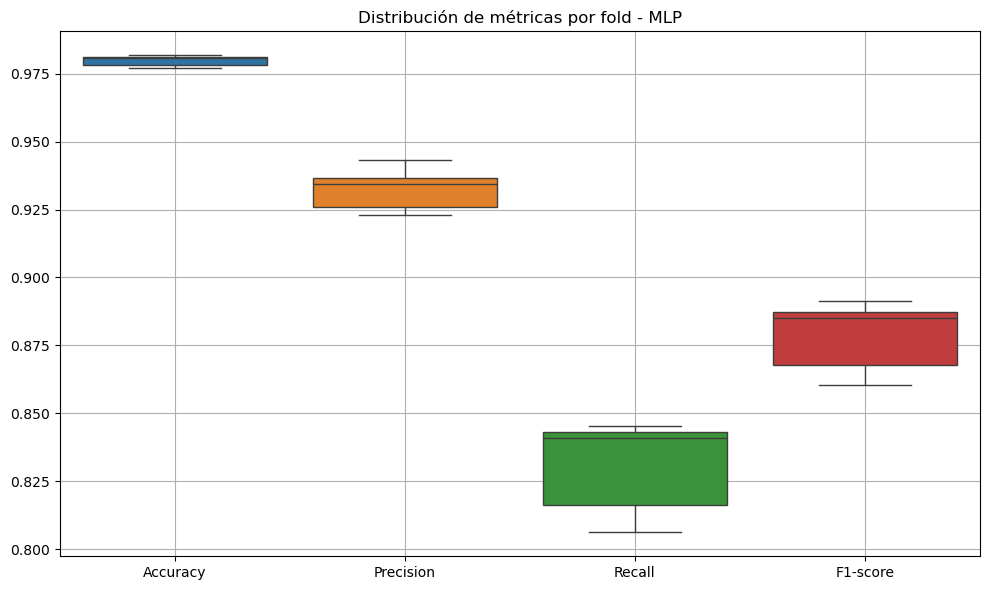

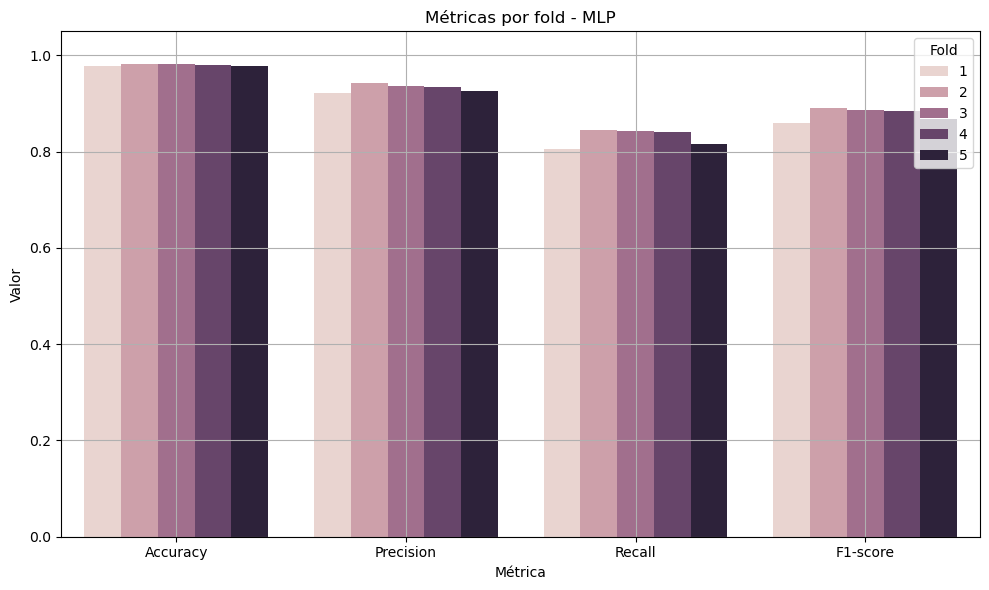

In [ ]:
# === 5. Visualización de métricas ===
df_metrics = pd.DataFrame({
    'Fold': list(range(1, k + 1)),
    'Accuracy': accuracies,
    'Precision': precisiones,
    'Recall': recalls,
    'F1-score': f1_scores
})

# Boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_metrics.drop(columns='Fold'))
plt.title("Distribución de métricas por fold - MLP")
plt.grid(True)
plt.tight_layout()
plt.show()

# Barplot
df_melted = df_metrics.melt(id_vars="Fold", var_name="Métrica", value_name="Valor")
plt.figure(figsize=(10, 6))
sns.barplot(data=df_melted, x="Métrica", y="Valor", hue="Fold")
plt.title("Métricas por fold - MLP")
plt.ylim(0, 1.05)
plt.grid(True)
plt.tight_layout()
plt.show()

Tal como en los casos anteriores, graficaremos la ***matriz de confusión***:

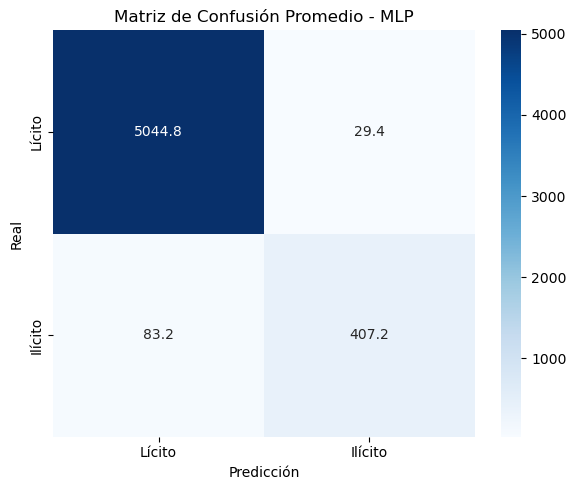

In [ ]:
# === 6. Matriz de confusión promedio ===
conf_avg = np.mean(conf_matrices, axis=0)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_avg, annot=True, fmt=".1f", cmap="Blues",
            xticklabels=["Lícito", "Ilícito"], yticklabels=["Lícito", "Ilícito"])
plt.title("Matriz de Confusión Promedio - MLP")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.tight_layout()
plt.show()

Por último, guardemos los valores de las métricas para utilizar en la comparacion de los diferentes métodos:

In [ ]:
# Listas con los valores de las métricas de la red neuronal con el perceptrón multicapa
acc_mlp = df_metrics["Accuracy"].tolist()
prec_mlp = df_metrics["Precision"].tolist()
rec_mlp = df_metrics["Recall"].tolist()
f1_mlp = df_metrics["F1-score"].tolist()

#### 5.6. Graph Convolutional Network (GCN)

El siguiente modelo a implementar, es el dado por ***red de grafos convolucionales*** (o en inglés *Graph Convolutional Network*, cuyas siglas usuales son GCN). A diferencia de los modelos anteriores, en los cuales en todos hemos utilizado la librería `scikit-learn`, en este caso debe utilizar la librería de ***PyTorch Geometric*** (las cuales requieren de `torch_geometric` y `torch`).

Por lo tanto, primero limpiaremos nuevamente los datos del `dataset` con el mismo criterio anterior y los dividiremos en dos conjuntos:
* Entrenamiento,
* validación.

In [ ]:
# === 1. Filtrar nodos útiles para el entrenamiento del GCN ===
# Queremos: nodos con etiquetas conocidas (0 = lícito, 1 = ilícito) Y que no estén aislados (grado > 0)
deg = degree(data.edge_index[0], data.num_nodes)  # Grado de cada nodo en el grafo
mask_known = ((data.y == 0) | (data.y == 1)) & (deg > 0)  # Máscara booleana para filtrar nodos útiles

idx_known = mask_known.nonzero(as_tuple=True)[0]  # Índices de nodos que cumplen la condición
y_known = data.y[idx_known]  # Etiquetas de esos nodos filtrados

# === 2. Inicializar listas para guardar métricas por fold ===
acc_gcn, prec_gcn, rec_gcn, f1_gcn = [], [], [], []  # Accuracy, precision, recall, F1-score

# Guardar todas las etiquetas verdaderas y predichas de validación cruzada
all_y_true = []
all_y_pred = []

Luego, definimos una función que implemente el modelo ***GCN***:

In [ ]:
# === 3. Definir el modelo GCN ===
class GCN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)   # Primera capa de convolución GCN
        self.conv2 = GCNConv(hidden_channels, out_channels)  # Segunda capa GCN (output logits)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)  # Aplicar primera capa
        x = F.relu(x)                  # Activación no lineal ReLU
        x = F.dropout(x, p=0.5, training=self.training)  # Dropout para regularización (solo en entrenamiento)
        x = self.conv2(x, edge_index)  # Capa final
        return x  # Devuelve logits sin softmax (lo hace internamente CrossEntropyLoss)

En esta instancia podemos empezar a iterar para calcular las métricas para cada  ***fold***:

In [ ]:
# === 4. Parámetros generales ===
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # GPU si está disponible
num_epochs = 200   # Número de épocas por fold
k = 5              # Número de folds en KFold

# === 5. Preparar el validador cruzado estratificado ===
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)  # Se asegura que haya equilibrio entre clases en cada fold

# Imprimo la inicializacion de las iteraciones por fold
print(f"\n  Validación cruzada K-Fold (K={k}) para GCN:\n")

# === 6. Loop sobre cada fold ===
for fold, (train_idx_np, val_idx_np) in enumerate(skf.split(idx_known, y_known), 1):
    print(f"\n📁 Fold {fold}/{k}")

    # Convertir índices de entrenamiento y validación a tensores PyTorch
    idx_train = idx_known[train_idx_np].clone().detach()
    idx_val   = idx_known[val_idx_np].clone().detach()

    # === Inicializar el modelo, optimizador y función de pérdida por fold ===
    model = GCN(in_channels=data.num_features, hidden_channels=64, out_channels=2).to(device)
    data = data.to(device)  # Mover los datos a la GPU si está disponible
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)  # Optimización Adam
    loss_fn = nn.CrossEntropyLoss()  # Función de pérdida para clasificación multiclase

    # === Entrenamiento por épocas ===
    for epoch in range(1, num_epochs + 1):
        model.train()  # Activar modo entrenamiento
        optimizer.zero_grad()  # Reiniciar gradientes acumulados
        out = model(data.x, data.edge_index)  # Hacer forward del modelo
        loss = loss_fn(out[idx_train], data.y[idx_train])  # Calcular pérdida solo en nodos de entrenamiento
        loss.backward()  # Retropropagación
        optimizer.step()  # Actualizar pesos

    # === Evaluación sobre el conjunto de validación ===
    model.eval()  # Modo evaluación
    out = model(data.x, data.edge_index)  # Predicciones para todos los nodos
    y_pred = out.argmax(dim=1)  # Clase predicha (mayor probabilidad)

    # Extraer predicciones y etiquetas verdaderas del conjunto de validación
    y_true_val = data.y[idx_val].cpu()
    y_pred_val = y_pred[idx_val].cpu()

    # === Calcular métricas ===
    acc = accuracy_score(y_true_val, y_pred_val)
    prec = precision_score(y_true_val, y_pred_val)
    rec = recall_score(y_true_val, y_pred_val)
    f1 = f1_score(y_true_val, y_pred_val)

    # === Calcular matriz de confusion ===
    all_y_true.extend(y_true_val.numpy())
    all_y_pred.extend(y_pred_val.numpy())

    # Guardar métricas en sus respectivas listas
    acc_gcn.append(acc)
    prec_gcn.append(prec)
    rec_gcn.append(rec)
    f1_gcn.append(f1)

    # === Reporte por fold ===
    print(classification_report(y_true_val, y_pred_val, target_names=["Lícito", "Ilícito"]))
    print(f"  Accuracy: {acc:.4f} | Precision: {prec:.4f} | Recall: {rec:.4f} | F1: {f1:.4f}")

# === 7. Mostrar resumen final en un DataFrame ===
df_metrics_gcn = pd.DataFrame({
    "Fold": range(1, k + 1),
    "Accuracy": acc_gcn,
    "Precision": prec_gcn,
    "Recall": rec_gcn,
    "F1-score": f1_gcn
})

print("\n  Promedios GCN (validación cruzada):")
display(df_metrics_gcn.mean(numeric_only=True).round(4))


  Validación cruzada K-Fold (K=5) para GCN:


📁 Fold 1/5
              precision    recall  f1-score   support

      Lícito       0.97      1.00      0.98      6343
     Ilícito       0.93      0.65      0.76       613

    accuracy                           0.96      6956
   macro avg       0.95      0.82      0.87      6956
weighted avg       0.96      0.96      0.96      6956

  Accuracy: 0.9643 | Precision: 0.9274 | Recall: 0.6460 | F1: 0.7615

📁 Fold 2/5
              precision    recall  f1-score   support

      Lícito       0.96      0.99      0.98      6343
     Ilícito       0.91      0.61      0.73       613

    accuracy                           0.96      6956
   macro avg       0.94      0.80      0.85      6956
weighted avg       0.96      0.96      0.96      6956

  Accuracy: 0.9603 | Precision: 0.9120 | Recall: 0.6085 | F1: 0.7299

📁 Fold 3/5
              precision    recall  f1-score   support

      Lícito       0.97      0.99      0.98      6343
     Ilícito     

Fold         3.0000
Accuracy     0.9618
Precision    0.9019
Recall       0.6369
F1-score     0.7462
dtype: float64

Veamos una gráfica de ***Boxplot*** y otra de ***Barplot*** para ilustrar el comportamiento de los promedios:

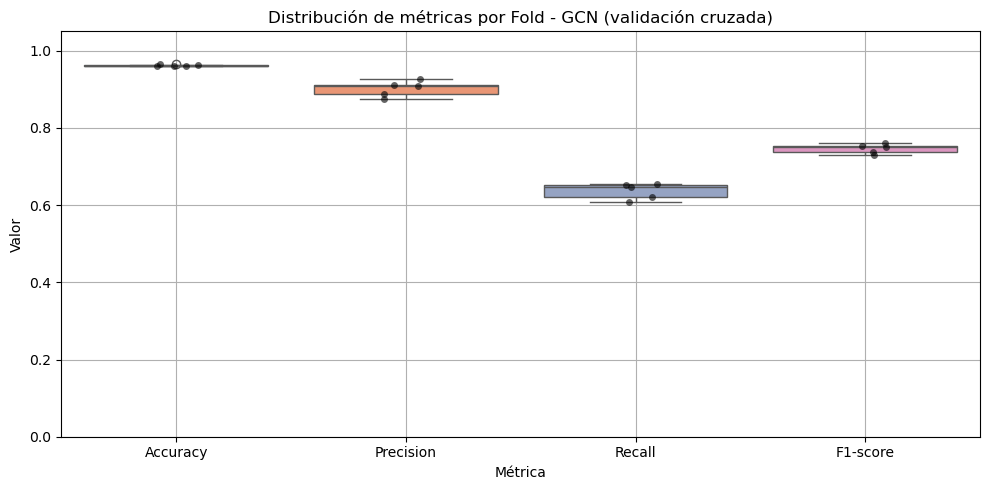

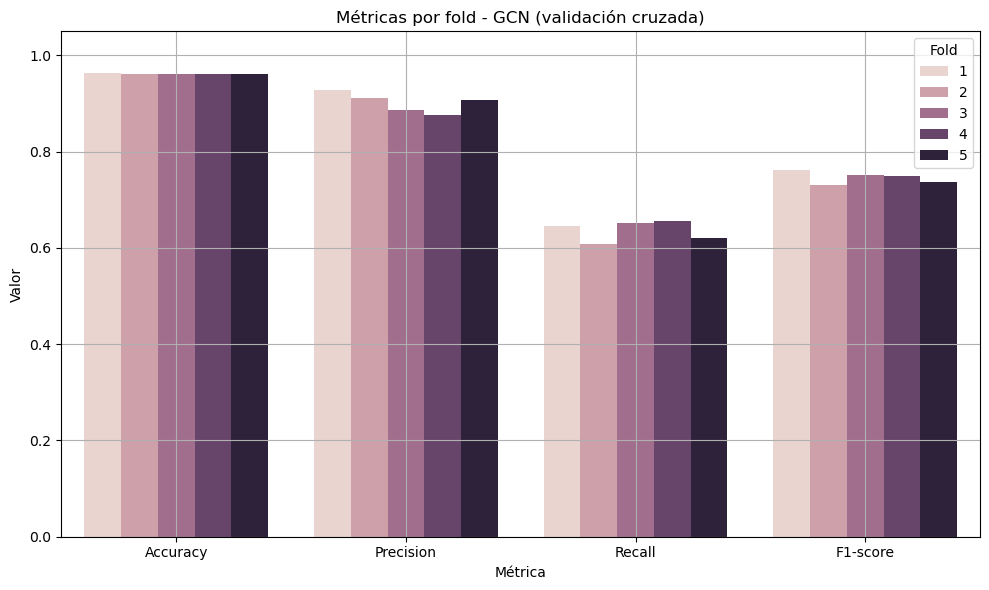

In [ ]:
# === 8. Gráfico de boxplot con distribución de métricas ===
df_long = df_metrics_gcn.melt(id_vars="Fold", var_name="Métrica", value_name="Valor")

# Calcular métricas promedio
plt.figure(figsize=(10, 5))
sns.boxplot(data=df_long, x="Métrica", y="Valor", hue="Métrica", palette="Set2", legend=False)
sns.stripplot(data=df_long, x="Métrica", y="Valor", color='black', alpha=0.6, jitter=0.1)
plt.title("Distribución de métricas por Fold - GCN (validación cruzada)")  # Evitamos emoji para evitar warnings
plt.ylim(0, 1.05)
plt.grid(True)
plt.tight_layout()
plt.show()

# === 9. Bar plot de métricas promedio ===
# Calcular métricas promedio
df_melted = df_metrics_gcn.melt(id_vars="Fold", var_name="Métrica", value_name="Valor")
plt.figure(figsize=(10, 6))
sns.barplot(data=df_melted, x="Métrica", y="Valor", hue="Fold")
plt.title("Métricas por fold - GCN (validación cruzada)")
plt.ylim(0, 1.05)
plt.grid(True)
plt.tight_layout()
plt.show()

Por último, la ***matriz de confusión***:

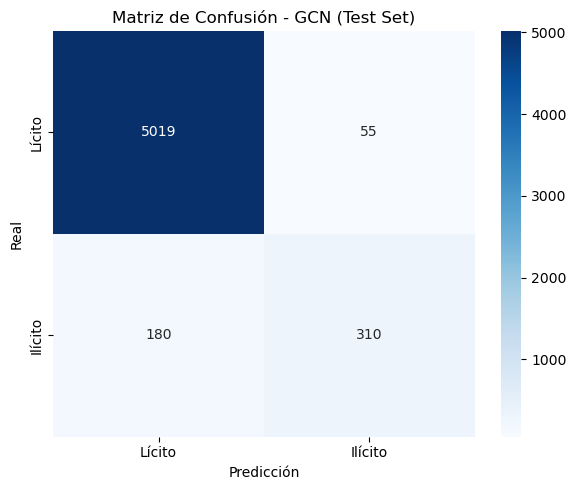

In [ ]:
# === Matriz de confusión en test ===
conf_matrix = confusion_matrix(all_y_true, all_y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Lícito", "Ilícito"], yticklabels=["Lícito", "Ilícito"])
plt.title("Matriz de Confusión - GCN (Test Set)")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.tight_layout()
plt.show()

#### 5.7. Graph Attention Network (GAT)

Otro modelo de grafos de interés, es el dado por ***red de grafos de atención*** (o en inglés *Graph Attention Network*, cuyas siglas usuales son GAT). Al igual que el modelo anterior, también debemos utilizar la librería de ***PyTorch Geometric*** (las cuales requieren de `torch_geometric` y `torch`).

Por lo tanto, podemos utilizar los datos del `dataset` que han sido limpiados en el modelo de grafos anterior (o simplemente repetit el mismo procedimiento). Luego, definimos las listas a utilizar:

In [ ]:
# === 2. Inicializar listas para guardar métricas por fold ===
acc_gat, prec_gat, rec_gat, f1_gat = [], [], [], []  # Accuracy, precision, recall, F1-score

# Guardar todas las etiquetas verdaderas y predichas de validación cruzada
all_y_true, all_y_pred = [], []

En lo que sigue, definimos la función que implemente el modelo ***GAT***:

In [ ]:
# === 3. Preparar modelo GAT ===
class GAT(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=2):
        super().__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.gat2 = GATConv(hidden_channels * heads, out_channels, heads=1)

    def forward(self, x, edge_index):
        x = self.gat1(x, edge_index)
        x = F.elu(x)
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.gat2(x, edge_index)
        return x

Definida la función del modelo, podemos empezar a iterar para calcular las métricas para cada  ***fold***:

In [ ]:
# === 4. Parámetros generales ===
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # GPU si está disponible
data = data.to(device)
num_epochs = 200   # Número de épocas por fold
k = 5              # Número de folds en KFold

# === 5. Validación cruzada K-Fold ===
k = 5
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42) # Se asegura que haya equilibrio entre clases en cada fold

# Imprimo la inicializacion de las iteraciones por fold
print(f"\n  Validación cruzada K-Fold (K={k}) - GAT\n")

for fold, (train_idx_np, val_idx_np) in enumerate(skf.split(idx_known, y_known), 1):
    print(f"📁 Fold {fold}/{k}")

    idx_train = idx_known[train_idx_np].clone().detach()
    idx_val = idx_known[val_idx_np].clone().detach()

    model = GAT(data.num_features, hidden_channels=64, out_channels=2).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.005, weight_decay=5e-4)
    loss_fn = nn.CrossEntropyLoss()

    # === Entrenamiento por fold ===
    for epoch in range(1, num_epochs + 1):
        model.train()
        optimizer.zero_grad()
        out = model(data.x, data.edge_index)
        loss = loss_fn(out[idx_train], data.y[idx_train])
        loss.backward()
        optimizer.step()

    # === Evaluación en validación ===
    model.eval()
    out = model(data.x, data.edge_index)
    y_pred = out.argmax(dim=1)

    y_true_val = data.y[idx_val].cpu()
    y_pred_val = y_pred[idx_val].cpu()

    # Guardar métricas por fold
    acc_gat.append(accuracy_score(y_true_val, y_pred_val))
    prec_gat.append(precision_score(y_true_val, y_pred_val))
    rec_gat.append(recall_score(y_true_val, y_pred_val))
    f1_gat.append(f1_score(y_true_val, y_pred_val))

    # Guardar para matriz de confusión
    all_y_true.extend(y_true_val.numpy())
    all_y_pred.extend(y_pred_val.numpy())

    print(classification_report(y_true_val, y_pred_val, target_names=["Lícito", "Ilícito"]))

# === 6. DataFrame de métricas ===
df_metrics_gat = pd.DataFrame({
    "Fold": np.arange(1, k + 1),
    "Accuracy": acc_gat,
    "Precision": prec_gat,
    "Recall": rec_gat,
    "F1-score": f1_gat
})

print("\n  Promedios GAT (validación cruzada):")
display(df_metrics_gat.mean(numeric_only=True).round(4))


  Validación cruzada K-Fold (K=5) - GAT

📁 Fold 1/5
              precision    recall  f1-score   support

      Lícito       0.97      0.99      0.98      6343
     Ilícito       0.92      0.71      0.80       613

    accuracy                           0.97      6956
   macro avg       0.95      0.85      0.89      6956
weighted avg       0.97      0.97      0.97      6956

📁 Fold 2/5
              precision    recall  f1-score   support

      Lícito       0.98      0.99      0.98      6343
     Ilícito       0.91      0.74      0.82       613

    accuracy                           0.97      6956
   macro avg       0.94      0.87      0.90      6956
weighted avg       0.97      0.97      0.97      6956

📁 Fold 3/5
              precision    recall  f1-score   support

      Lícito       0.97      0.99      0.98      6343
     Ilícito       0.90      0.73      0.81       613

    accuracy                           0.97      6956
   macro avg       0.94      0.86      0.90      6956

Fold         3.0000
Accuracy     0.9679
Precision    0.9068
Recall       0.7083
F1-score     0.7952
dtype: float64

Al igual que en caso anterior, veamos una gráfica de ***Boxplot*** y otra de ***Barplot***:

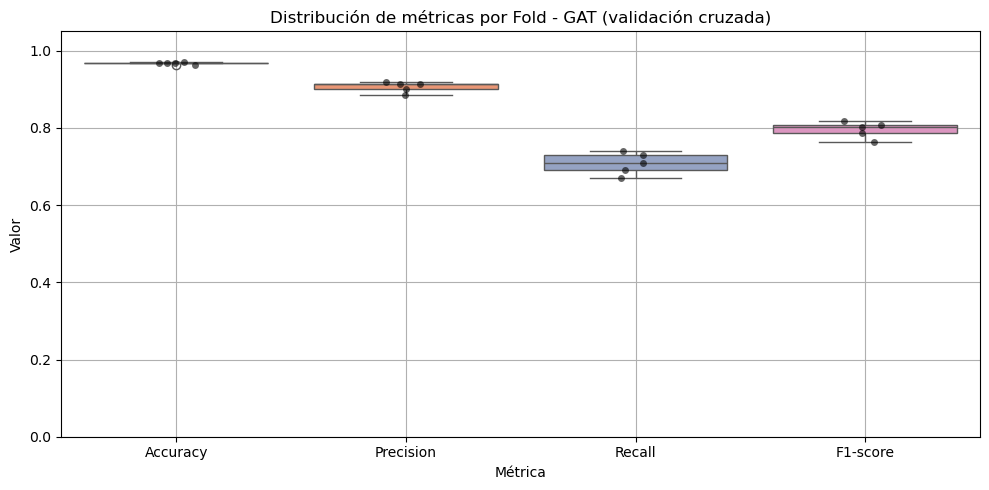

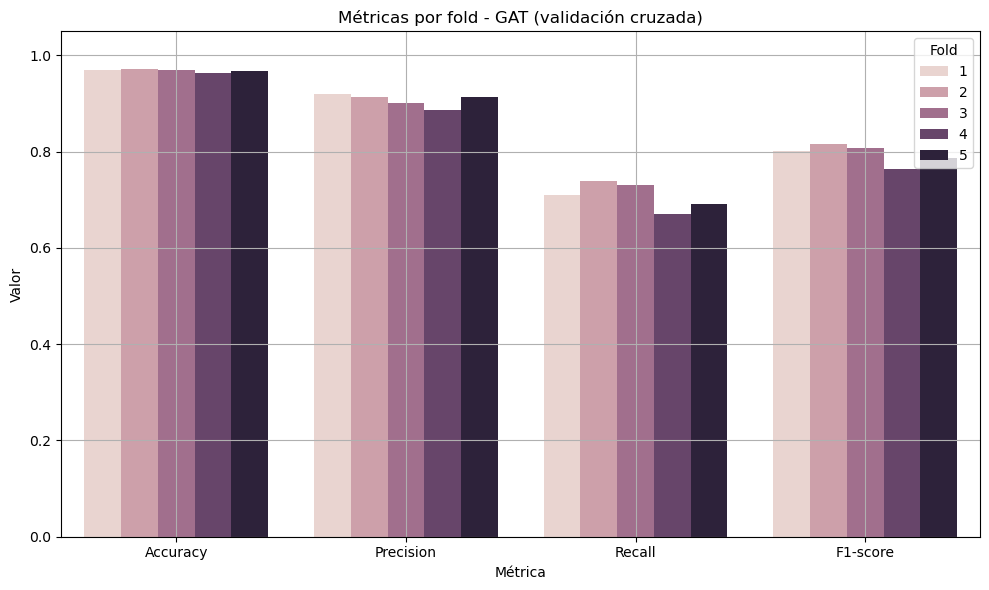

In [ ]:
# === 7. Boxplot y Barplot ===
df_long = df_metrics_gat.melt(id_vars="Fold", var_name="Métrica", value_name="Valor")

# Boxplot
plt.figure(figsize=(10, 5))
sns.boxplot(data=df_long, x="Métrica", y="Valor", hue="Métrica", palette="Set2", legend=False)
sns.stripplot(data=df_long, x="Métrica", y="Valor", color='black', alpha=0.6, jitter=0.1)
plt.title("Distribución de métricas por Fold - GAT (validación cruzada)")
plt.ylim(0, 1.05)
plt.grid(True)
plt.tight_layout()
plt.show()

# Barplot
df_melted = df_metrics_gat.melt(id_vars="Fold", var_name="Métrica", value_name="Valor")
plt.figure(figsize=(10, 6))
sns.barplot(data=df_melted, x="Métrica", y="Valor", hue="Fold")
plt.title("Métricas por fold - GAT (validación cruzada)")
plt.ylim(0, 1.05)
plt.grid(True)
plt.tight_layout()
plt.show()

Para terminar, la ***matriz de confusión***:

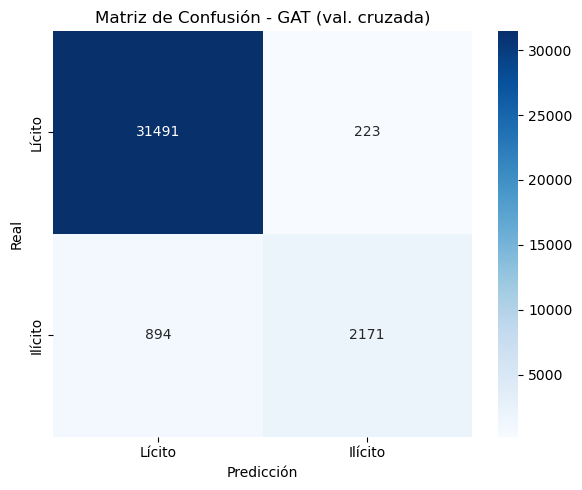

In [ ]:
# === 8. Matriz de confusión total ===
conf_gat = confusion_matrix(all_y_true, all_y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_gat, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Lícito", "Ilícito"], yticklabels=["Lícito", "Ilícito"])
plt.title("Matriz de Confusión - GAT (val. cruzada)")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.tight_layout()
plt.show()

#### 5.8. eXtreme Gradient Boosting (XGBoost)

Como último modelo utilizaremos  eXtreme Gradient Boosting (XGBoost), que es muy potente para clasificación en conjuntos tabulares como el dado en `EllipticBitcoinDataset`. Esta técnica construye modelos secuencialmente, donde cada nuevo modelo intenta corregir los errores de los modelos anteriores.

***¿Qué es el boosting de gradiente?***
El boosting de gradiente es un método de aprendizaje conjunto que combina varios modelos débiles, generalmente árboles de decisión, aunque también utiliza Random Forest, para crear un modelo fuerte. Se basa en la idea de que cada nuevo modelo se entrena para corregir los errores del modelo anterior, utilizando el gradiente de la función de pérdida.

Características destacadas de XGBoost que lo diferencian de otros algoritmos de potenciación de gradiente incluyen:
* Penalización inteligente de árboles,
* Reducción proporcional de nodos hoja,
* Potenciación de Newton,
* Parámetro adicional de aleatorización,
* Implementación en sistemas individuales y distribuidos, y cálculo fuera de línea,
* Selección automática de características,
* Esbozo ponderado de cuantiles justificado teóricamente para cálculos eficientes,
* Impulso de estructura de árbol paralelo con esparsidad,
* Estructura de bloques caché eficiente para el entrenamiento de árboles de decisión.

Sin embargo, para implementar numéricamente este modelo es necesario introducir una nueva librería llamada ***xgboost***, dada por `XGBClassifier`. Por lo que, nuevamente debemos:
* Aplicar el procedimiento de limpieza del `dataset`,
* Dividir el conjunto de entrenamiento y validación.

In [ ]:
# === 1. Filtrar nodos conocidos y no aislados ===
deg = degree(data.edge_index[0], data.num_nodes)
mask_known = ((data.y == 0) | (data.y == 1)) & (deg > 0)
X = data.x[mask_known].numpy()
y = data.y[mask_known].numpy()

# === 2. Dividir conjunto de prueba final (20%) ===
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42)

# === 3. Escalar características (opcional, XGBoost no lo necesita, pero lo hacemos para uniformidad) ===
scaler = StandardScaler()
X_temp_scaled = scaler.fit_transform(X_temp)
X_test_scaled = scaler.transform(X_test)

: 

A continuación, comenzamos con la validación cruzada que nos provee ***K-Fold***:

In [ ]:
# === 4. Validación cruzada K-Fold ===
k = 5
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

acc_xgb, prec_xgb, rec_xgb, f1_xgb = [], [], [], []
all_y_true, all_y_pred = [], []

print(f"\n  Validación cruzada K-Fold (K={k}) - XGBoost\n")

for fold, (train_idx, val_idx) in enumerate(skf.split(X_temp_scaled, y_temp), 1):
    print(f"📁 Fold {fold}/{k}")

    X_train, X_val = X_temp_scaled[train_idx], X_temp_scaled[val_idx]
    y_train, y_val = y_temp[train_idx], y_temp[val_idx]

    model = XGBClassifier(eval_metric='logloss', random_state=42)
    model.fit(X_train, y_train)

    y_val_pred = model.predict(X_val)

    # Guardar métricas
    acc_xgb.append(accuracy_score(y_val, y_val_pred))
    prec_xgb.append(precision_score(y_val, y_val_pred))
    rec_xgb.append(recall_score(y_val, y_val_pred))
    f1_xgb.append(f1_score(y_val, y_val_pred))

    # Acumular para matriz de confusión
    all_y_true.extend(y_val)
    all_y_pred.extend(y_val_pred)

    print(classification_report(y_val, y_val_pred, target_names=["Lícito", "Ilícito"]))

# === 5. DataFrame de métricas por fold ===
df_metrics_xgb = pd.DataFrame({
    "Fold": np.arange(1, k+1),
    "Accuracy": acc_xgb,
    "Precision": prec_xgb,
    "Recall": rec_xgb,
    "F1-score": f1_xgb
})

print("\n  Promedios XGBoost (validación cruzada):")
display(df_metrics_xgb.mean(numeric_only=True).round(4))

Ahora veamos una gráfica de ***Boxplot*** y otra de ***Barplot***:

In [ ]:
# === 6. Visualización (boxplot + barplot) ===
df_long = df_metrics_xgb.melt(id_vars="Fold", var_name="Métrica", value_name="Valor")
plt.figure(figsize=(10, 5))
sns.boxplot(data=df_long, x="Métrica", y="Valor", hue="Métrica", palette="Set2", legend=False)
sns.stripplot(data=df_long, x="Métrica", y="Valor", color='black', alpha=0.6, jitter=0.1)
plt.title("Distribución de métricas por Fold - XGBoost")
plt.ylim(0, 1.05)
plt.grid(True)
plt.tight_layout()
plt.show()

# Barplot de métricas promedio
df_melted = df_metrics_xgb.melt(id_vars="Fold", var_name="Métrica", value_name="Valor")
plt.figure(figsize=(10, 6))
sns.barplot(data=df_melted, x="Métrica", y="Valor", hue="Fold")
plt.title("Métricas por fold - XGBoost (validación cruzada)")
plt.ylim(0, 1.05)
plt.grid(True)
plt.tight_layout()
plt.show()

Y finalizaremos con la ***matriz de confusión***:

In [ ]:
# === 7. Matriz de confusión global (validación cruzada) ===
conf_xgb = confusion_matrix(all_y_true, all_y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_xgb, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Lícito", "Ilícito"], yticklabels=["Lícito", "Ilícito"])
plt.title("Matriz de Confusión - XGBoost (val. cruzada)")
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.tight_layout()
plt.show()

> Nota: Todos los modelos, menos el XGboost y el de grafos, tienen una dispersión muy pequeña frente a los otros que tienen una dispersión más amplia. Esto tiende a generar valores de métricas más estables, pero también puede indicar que no están capturando bien la complejidad del problema.

#### 5.9 Comparación entre modelos

Para comparar los modelos tabulares y de grafos, se utilizó validación cruzada estratificada con el mismo número de folds (por ejemplo, 5).
Se calcularon las métricas Accuracy, Precision, Recall y F1-score para cada fold.
Luego se promediaron las métricas para cada modelo, obteniendo su rendimiento medio y variabilidad.
Se eligió el mejor modelo basado en el F1-score promedio, ya que es una métrica balanceada que considera precisión y recall, importante en problemas con clases desbalanceadas. Las comparaciones se visualizaron con gráficos de barras y radar.

In [ ]:
# Crear DataFrame resumen de métricas promedio por modelo
resumen = pd.DataFrame({
    "Modelo": [
        "Logistic Regression", "Random Forest", "SVM (RBF)",
        "Árbol de Decisión", "MLP", "GCN", "GAT", "XGBoost"
    ],
    "Accuracy": [
        np.mean(acc_log), np.mean(acc_rf), np.mean(acc_svm),
        np.mean(acc_dt), np.mean(acc_mlp), np.mean(acc_gcn), np.mean(acc_gat), np.mean(acc_xgb)
    ],
    "Precision": [
        np.mean(prec_log), np.mean(prec_rf), np.mean(prec_svm),
        np.mean(prec_dt), np.mean(prec_mlp), np.mean(prec_gcn), np.mean(prec_gat), np.mean(prec_xgb)
    ],
    "Recall": [
        np.mean(rec_log), np.mean(rec_rf), np.mean(rec_svm),
        np.mean(rec_dt), np.mean(rec_mlp), np.mean(rec_gcn), np.mean(rec_gat), np.mean(rec_xgb)
    ],
    "F1-score": [
        np.mean(f1_log), np.mean(f1_rf), np.mean(f1_svm),
        np.mean(f1_dt), np.mean(f1_mlp), np.mean(f1_gcn), np.mean(f1_gat), np.mean(f1_xgb)
    ]
})

# Mostrar tabla
display(resumen.round(4))

,Modelo,Accuracy,Precision,Recall,F1-score
0,Logistic Regression,0.9587,0.8339,0.6643,0.7392
1,Random Forest,0.9857,0.9956,0.8413,0.9119
2,SVM (RBF),0.9721,0.9415,0.7288,0.8214
3,Árbol de Decisión,0.9762,0.8569,0.8760,0.8662
4,MLP,0.9798,0.9326,0.8303,0.8785
5,GCN,0.9618,0.9019,0.6369,0.7462
6,GAT,0.9679,0.9068,0.7083,0.7952
7,XGBoost,0.9901,0.9887,0.8976,0.9409


XGBoost fue el modelo que alcanzó el mayor F1-score, lo que indica que es el más equilibrado y efectivo para clasificar correctamente las instancias de ambas clases en este dataset. Por lo tanto, se considera el mejor modelo para esta tarea específica.

Luego, realizamos un gráfico comparativo de barras:

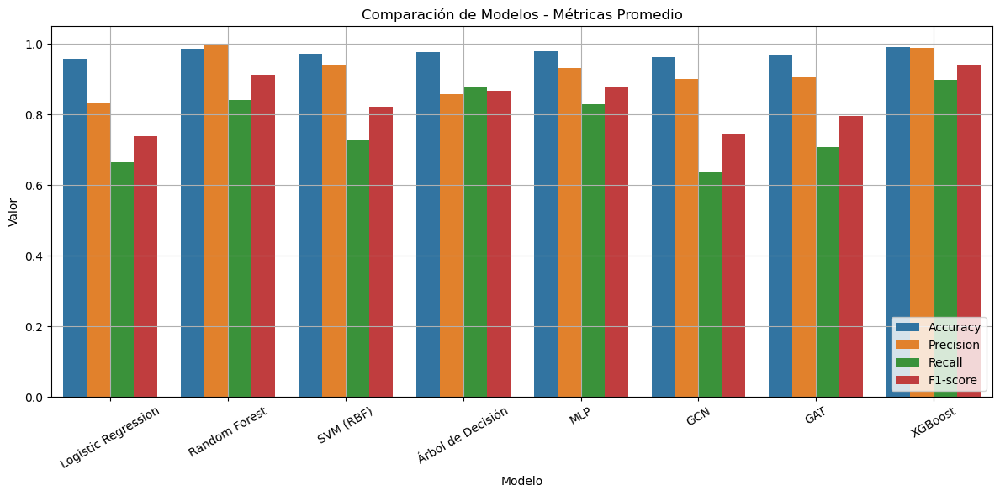

In [ ]:
# Convertir a formato long para seaborn
df_long = resumen.melt(id_vars="Modelo", var_name="Métrica", value_name="Valor")

# Barplot
plt.figure(figsize=(12, 6))
sns.barplot(data=df_long, x="Modelo", y="Valor", hue="Métrica")
plt.title("Comparación de Modelos - Métricas Promedio")
plt.ylim(0, 1.05)
plt.xticks(rotation=30)
plt.grid(True)
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()

Por último, veamos un gráfico de radar:

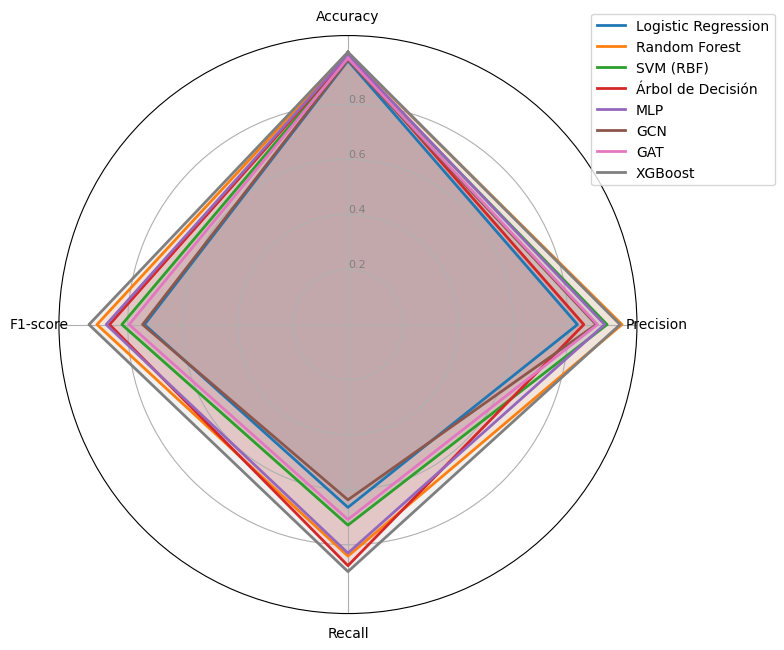

In [ ]:
# Crear DataFrame con métricas normalizadas entre 0 y 1 (ya lo están)
df_radar = resumen.set_index("Modelo")

# Métricas
labels = df_radar.columns.tolist()
num_labels = len(labels)

# Ángulos para el radar plot
angles = [n / float(num_labels) * 2 * pi for n in range(num_labels)]
angles += angles[:1]  # cerrar el círculo

# Preparar la figura
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

# Dibujar un radar por modelo
for model in df_radar.index:
    values = df_radar.loc[model].tolist()
    values += values[:1]  # cerrar el círculo
    ax.plot(angles, values, label=model, linewidth=2)
    ax.fill(angles, values, alpha=0.1)

# Configuración del gráfico
ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)
plt.xticks(angles[:-1], labels)
ax.set_rlabel_position(0)
plt.yticks([0.2, 0.4, 0.6, 0.8], ["0.2", "0.4", "0.6", "0.8"], color="gray", size=8)
plt.ylim(0, 1.05)
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1.05))
plt.tight_layout()
plt.show()

El modelo XGBoost obtuvo el mejor desempeño medido por la métrica F1-score, la cual es especialmente adecuada para problemas con clases desbalanceadas, ya que combina precisión y recall.

Para optimizar el rendimiento del modelo XGBoost, se realizó una búsqueda de hiperparámetros mediante RandomizedSearchCV con validación cruzada interna. Esta búsqueda permitió ajustar parámetros clave como la cantidad de árboles (n_estimators), la profundidad máxima de los árboles (max_depth), la tasa de aprendizaje (learning_rate), y otros factores de regularización y muestreo, que afectan la capacidad de generalización y la robustez del modelo.

El uso de validación cruzada en la búsqueda asegura que el modelo no se sobreajuste a una partición específica de los datos, y la posterior evaluación en un conjunto de test independiente confirma la validez del desempeño reportado.

Finalmente, el modelo XGBoost ajustado logró un balance óptimo entre precisión y sensibilidad, reflejado en el mejor F1-score, consolidándose así como el modelo más adecuado para la tarea de clasificación en este dataset.


In [ ]:
# Filtrar nodos conocidos y no aislados ===
deg = degree(data.edge_index[0], data.num_nodes)
mask_known = ((data.y == 0) | (data.y == 1)) & (deg > 0)
X = data.x[mask_known].numpy()
y = data.y[mask_known].numpy()

# Dividir conjunto de prueba final (20%) ===
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42)

# Escalar características ===
scaler = StandardScaler()
X_temp_scaled = scaler.fit_transform(X_temp)
X_test_scaled = scaler.transform(X_test)

# Búsqueda de hiperparámetros con validación cruzada interna ===
print("\n=== Búsqueda de hiperparámetros con RandomizedSearchCV ===\n")

param_dist = {
    'n_estimators': randint(50, 300),
    'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.3),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.6, 0.4),
    'gamma': uniform(0, 5)
}

model = XGBClassifier(eval_metric='logloss', random_state=42)

random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_dist,
    n_iter=30,
    scoring='f1',
    cv=3,
    verbose=0,
    random_state=42,
    n_jobs=-1
)

random_search.fit(X_temp_scaled, y_temp)

print("Mejores hiperparámetros encontrados:")
print(random_search.best_params_)
print(f"Mejor F1-score (CV interno): {random_search.best_score_:.4f}")

# Evaluar el mejor modelo en el conjunto test final ===
best_model = random_search.best_estimator_
y_test_pred = best_model.predict(X_test_scaled)

print("\n=== Reporte final en conjunto de test ===")
print(classification_report(y_test, y_test_pred, target_names=["Lícito", "Ilícito"]))

# Métricas finales en test ===
acc_test = accuracy_score(y_test, y_test_pred)
prec_test = precision_score(y_test, y_test_pred)
rec_test = recall_score(y_test, y_test_pred)
f1_test = f1_score(y_test, y_test_pred)

print(f"Accuracy (test): {acc_test:.4f}")
print(f"Precision (test): {prec_test:.4f}")
print(f"Recall (test): {rec_test:.4f}")
print(f"F1-score (test): {f1_test:.4f}")


=== Búsqueda de hiperparámetros con RandomizedSearchCV ===

Mejores hiperparámetros encontrados:
{'colsample_bytree': np.float64(0.662397808134481), 'gamma': np.float64(0.2904180608409973), 'learning_rate': np.float64(0.26985284373248053), 'max_depth': 6, 'n_estimators': 153, 'subsample': np.float64(0.8832290311184181)}
Mejor F1-score (CV interno): 0.9385

=== Reporte final en conjunto de test ===
              precision    recall  f1-score   support

      Lícito       0.99      1.00      0.99      6343
     Ilícito       0.99      0.90      0.94       613

    accuracy                           0.99      6956
   macro avg       0.99      0.95      0.97      6956
weighted avg       0.99      0.99      0.99      6956

Accuracy (test): 0.9907
Precision (test): 0.9893
Recall (test): 0.9038
F1-score (test): 0.9446


Los mejores hiperparámetros encontrados son

* 'colsample_bytree': 0.662397808134481,
* 'gamma': 0.2904180608409973,
* 'learning_rate': 0.26985284373248053,
* 'max_depth': 6,
* 'n_estimators': 153
* 'subsample': 0.8832290311184181

donde la metrica F1-score  mejora de 0.9409 a 0.9446 con exploración de hiperparámetros


## 6. Conclusiones y Perpectivas <a name="conclusiones"></a>

**MODELOS TABULARES VS MODELOS DE GRAFOS**

La elección entre un modelo tabular (por ejemplo, árboles de decisión, XGBoost, redes neuronales densas) y un modelo basado en grafos (como GCN, GAT, GraphSAGE, etc.) depende del problema y del tipo de información disponible.
En nuestro caso los modelos tabulares dan mejor rendimiento que el de grafos, estas pueden ser las razones principales:

1. Poca información útil en la estructura del grafo
 - Si la conectividad entre nodos no aporta patrones relevantes, los modelos de grafos no logran capitalizar ventajas, y el modelo tabular —que se enfoca solo en atributos— puede hacerlo mejor.

2. Etiquetas disponibles solo para pocos nodos
 - Los modelos de grafos suelen necesitar un contexto más rico (etiquetas en vecinos, nodos cercanos, etc.). Si hay poca supervisión, el modelo puede no generalizar bien desde la estructura.

3. Las features tabulares son muy informativas
 - Si las variables en sí mismas (transacciones, montos, frecuencia, etc.) tienen mucho poder predictivo, el modelo tabular puede aprender muy bien sin necesidad de la estructura del grafo.

4. El grafo es muy disperso o está mal conectado
 - En grafos con muchos nodos aislados o conexiones muy débiles, el modelo de grafos no puede propagar información útil. En cambio, un modelo tabular no depende de la topología.

5. Modelo de grafo suboptimizado
 - Tal vez el modelo GNN no está bien entrenado (ej: poca profundidad, mal preprocesamiento, sin normalización adecuada, sin tuning de hiperparámetros). Un modelo tabular bien ajustado puede superarlo fácilmente.

6. El grafo contiene ruido estructural
 - Si hay muchas conexiones irrelevantes o engañosas (ej: entre nodos de distinta clase), el modelo de grafo puede incorporar ruido. En cambio, el tabular puede enfocarse solo en lo importante.


En conclusicón el rendimiento superior del modelo tabular puede deberse a que los atributos individuales son suficientes para la predicción, mientras que la estructura del grafo no aporta información adicional relevante o está mal aprovechada. Además, los modelos tabulares suelen ser más maduros, fáciles de entrenar y ajustar que los modelos de grafos, lo que también puede influir en el resultado.

PUNTOS A MEJORAR:
- En este trabajo se observa una repetición frecuente de celdas de código, principalmente debido a que se aplican los mismos procedimientos a distintos casos (por ejemplo, al evaluar distintos modelos o métricas). Esta repetición podría optimizarse agrupando la lógica repetida en funciones reutilizables, lo que permitiría reducir la extensión del informe y mejorar su legibilidad y mantenibilidad.
- Sería interesante profundizar en los modelos convolucionales de grafos ya que sería útil comparar los modelos convolucionales que se obtienen haciendo una nueva limpieza del dataset, ya que actualmente la dispersión es muy mínima. También sería interesante explorar modificanto el grafo para que sea ponderado, lo que podría mejorar la capacidad de los modelos de grafos para capturar relaciones más complejas entre las transacciones.
